# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



Running this project require the following imports 

In [1]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline
#more 

from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist, squareform
from scipy.stats import pearsonr

from matplotlib.colors import LogNorm

from itertools import combinations
from sklearn.model_selection import StratifiedKFold
import matplotlib as mpl

In [2]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = ['blue','black','red','yellow','green','brown','orange','violet','lightpink','aqua']
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

# Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



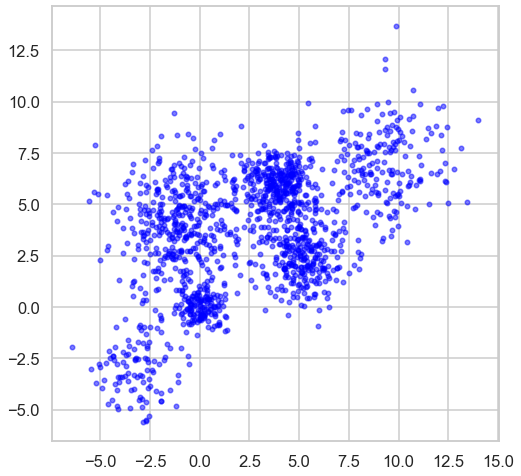

In [3]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

## Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

In [4]:
def display_cluster(X, km=[], num_clusters=0):
    color = ['black','blue','red','yellow','green','brown','orange','violet','lightpink','aqua']
    alpha = 0.5  # Color opacity
    s = 20

    if num_clusters == 0:
        plt.scatter(X[:, 0], X[:, 1], c=color[0], alpha=alpha, s=s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_ == i, 0], X[km.labels_ == i, 1], c=color[i % len(color)], alpha=alpha, s=s)
            plt.scatter(km.cluster_centers_[i][0], km.cluster_centers_[i][1], c=color[i % len(color)], marker='x', s=100)

For K=2, Silhouette Score: 0.4751544541991239
For K=3, Silhouette Score: 0.43631793714185435
For K=4, Silhouette Score: 0.4628725400351352
For K=5, Silhouette Score: 0.48100602217073096
For K=6, Silhouette Score: 0.48614459735646176
For K=7, Silhouette Score: 0.4635574784262779
For K=8, Silhouette Score: 0.44342826922624695
For K=9, Silhouette Score: 0.44072492110350264
For K=10, Silhouette Score: 0.3959155820588724
The best K based on Silhouette Score: 6


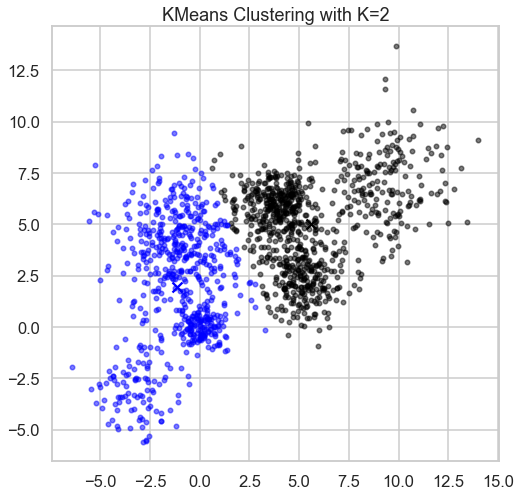

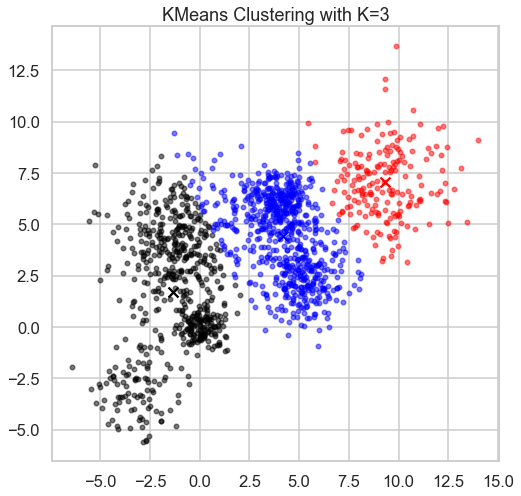

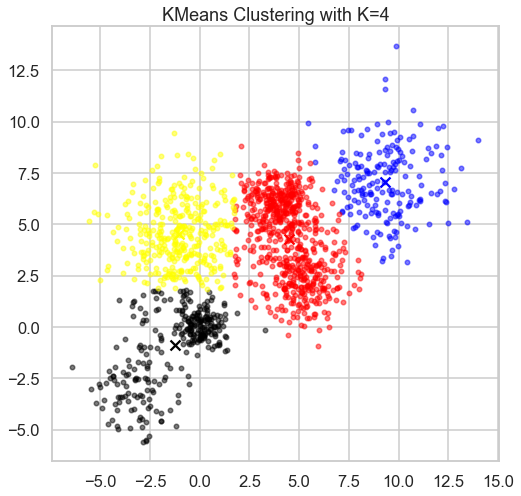

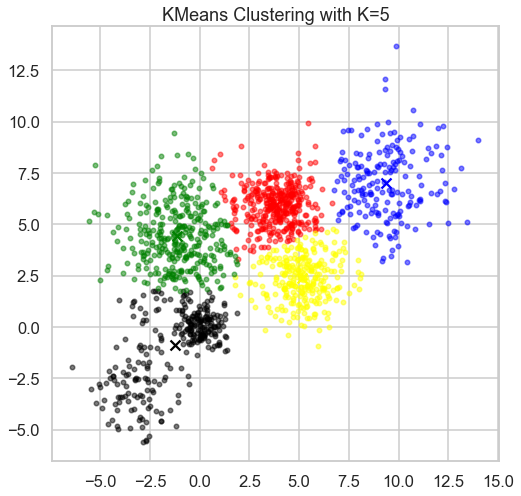

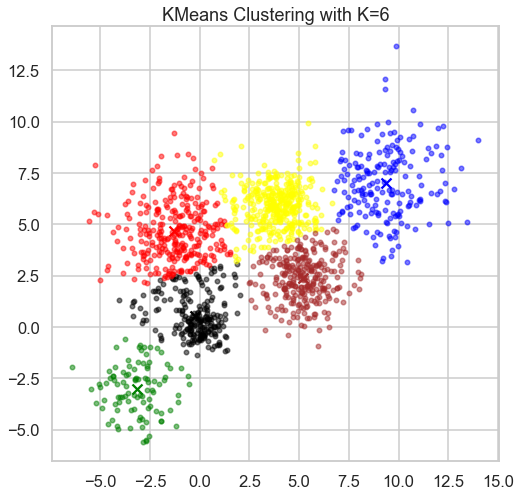

...

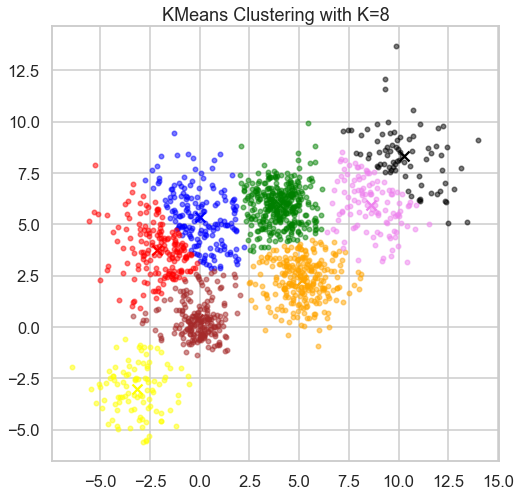

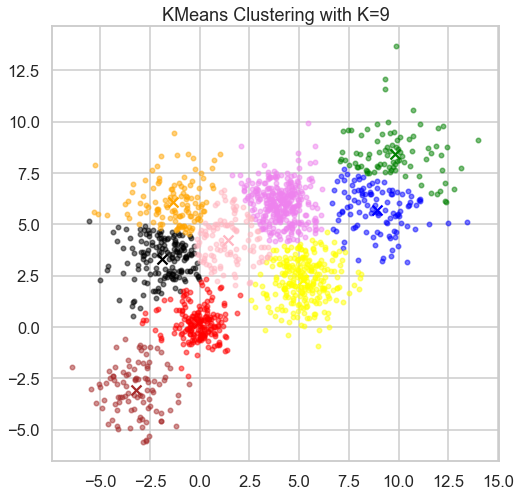

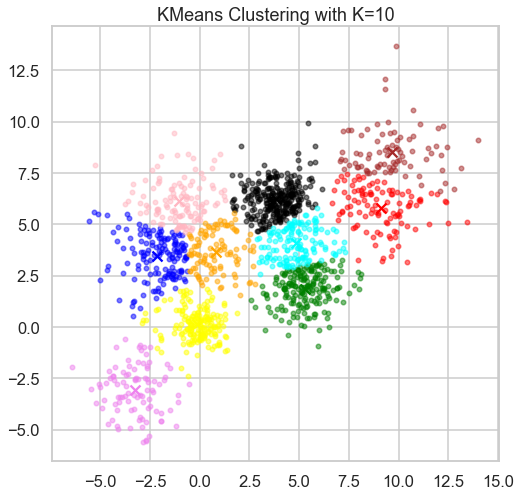

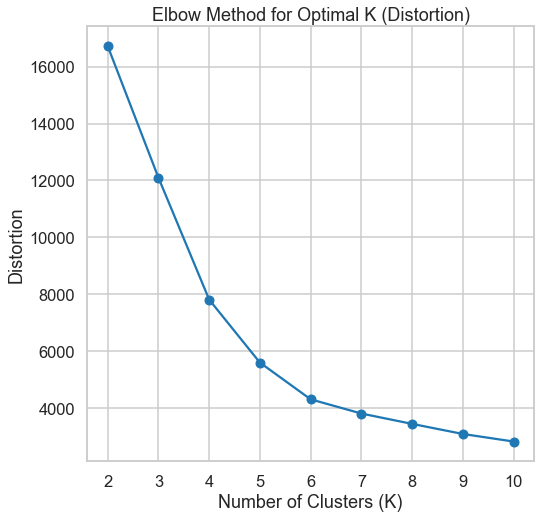

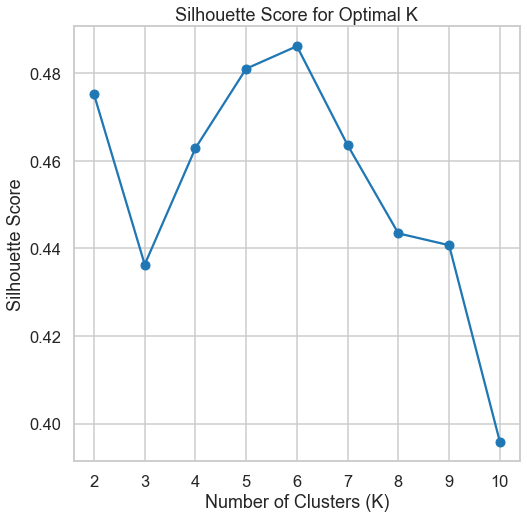

In [5]:
# Function to perform KMeans clustering and display results
def kmeans_clustering(X, k_values):
    distortions = []
    silhouette_scores = []

    for k in k_values:
        km = KMeans(n_clusters=k, random_state=42)
        km.fit(X)
        
        # Display clusters
        plt.figure()
        display_cluster(X, km, k)
        plt.title(f'KMeans Clustering with K={k}')
        
        # Calculate distortion and silhouette_score
        distortions.append(km.inertia_)
        silhouette_avg = silhouette_score(X, km.labels_)
        silhouette_scores.append(silhouette_avg)
        print(f'For K={k}, Silhouette Score: {silhouette_avg}')

    # Plot distortion function versus K
    plt.figure()
    plt.plot(k_values, distortions, marker='o')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion')
    plt.title('Elbow Method for Optimal K (Distortion)')

    # Plot silhouette_score versus K
    plt.figure()
    plt.plot(k_values, silhouette_scores, marker='o')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Optimal K')

    # Find the best K based on silhouette_score
    best_k = k_values[np.argmax(silhouette_scores)]
    print(f'The best K based on Silhouette Score: {best_k}')

    return best_k

# Specify K values to try
k_values = range(2, 11)

# Perform KMeans clustering and display results
best_k_kmeans = kmeans_clustering(Multi_blob_Data, k_values)


## Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [6]:
# def hierarchical_clustering(X, affinity='euclidean', linkage_type='average', n_clusters=2):
#     distances = squareform(pdist(X, metric=affinity))

#     # Perform hierarchical clustering
#     model = AgglomerativeClustering(linkage=linkage_type, n_clusters=n_clusters)
#     labels = model.fit_predict(distances)

#     # Plot dendrogram
#     plt.figure(figsize=(12, 6))
#     plt.title(f'Hierarchical Clustering Dendrogram (Linkage: {linkage_type}, Clusters: {n_clusters}, Affinity: {affinity})')
#     dendrogram(linkage(distances, method=linkage_type), truncate_mode='level', p=3)
#     plt.xlabel("Number of points in node (or index of point if no parenthesis).")
#     plt.show()

#     # Calculate silhouette score
#     silhouette_avg = silhouette_score(distances, labels)
#     print(f'Silhouette Score: {silhouette_avg}')

#     return silhouette_avg

# distance_metrics = ['euclidean', 'cosine', 'cityblock']
# best_silhouette_score = float('-inf')
# best_params = None

# for distance_metric in distance_metrics:
#     for linkage_type in ['average', 'single']:
#         silhouette_score_current = hierarchical_clustering(Multi_blob_Data, affinity=distance_metric, linkage_type=linkage_type)
        
#         # Store the best silhouette_score and parameters
#         if silhouette_score_current > best_silhouette_score:
#             best_silhouette_score = silhouette_score_current
#             best_params = {'distance_metric': distance_metric, 'linkage_type': linkage_type}

# # Print the best parameters and silhouette score
# print("Best Parameters:", best_params)
# print("Best Silhouette Score:", best_silhouette_score)


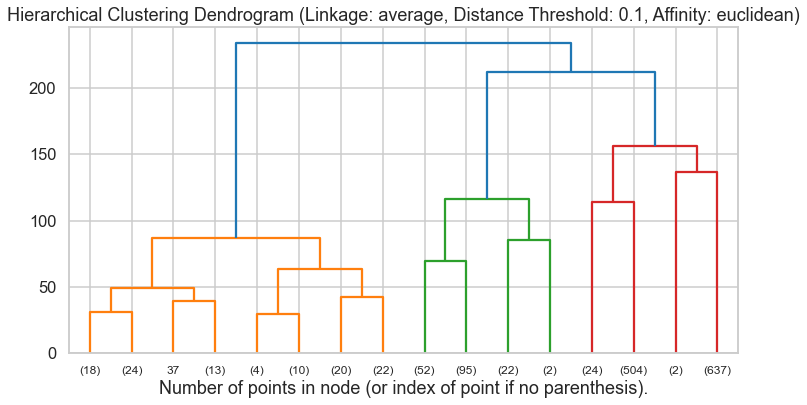

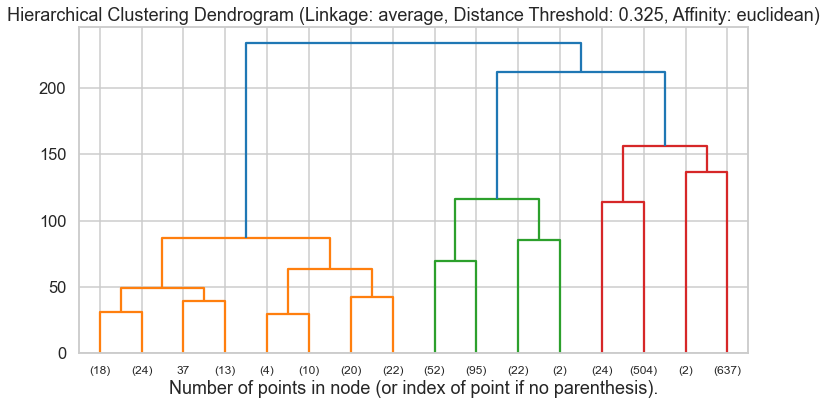

Silhouette Score: 0.007450377189461496


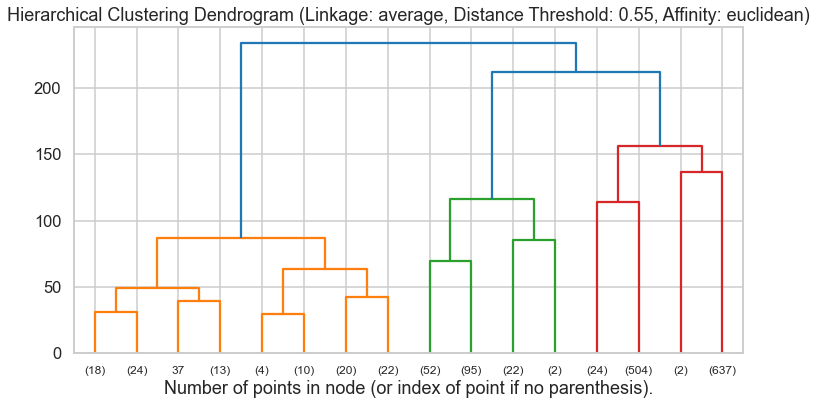

Silhouette Score: 0.01771900983879523


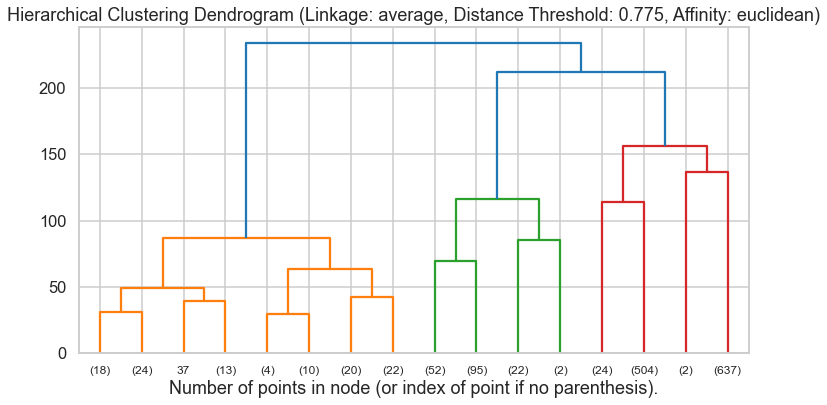

Silhouette Score: 0.0351023553202372


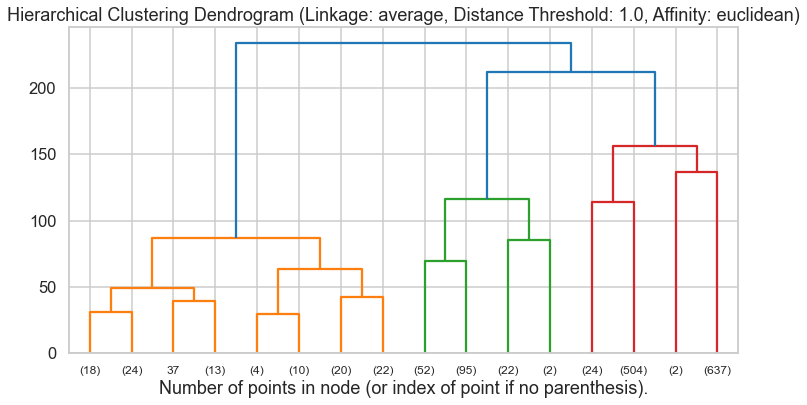

Silhouette Score: 0.0512778759626157


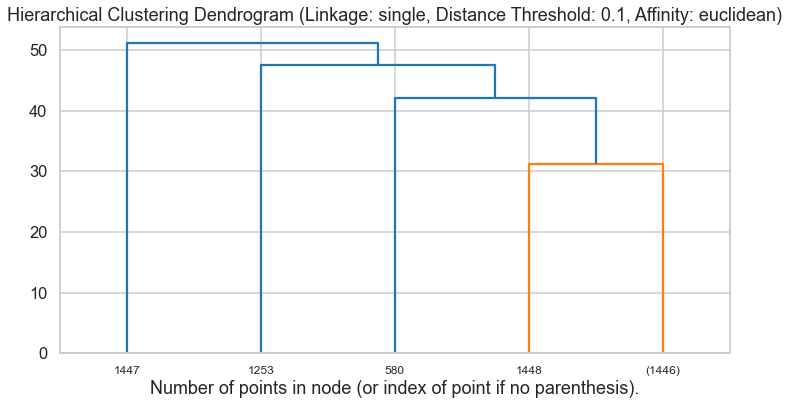

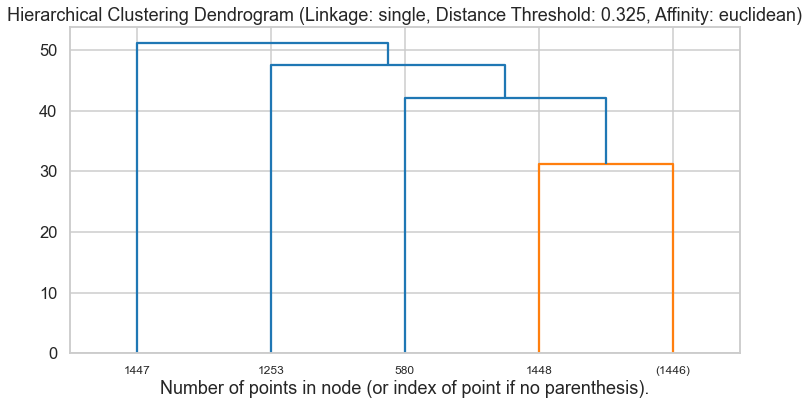

Silhouette Score: 0.007450377189461496


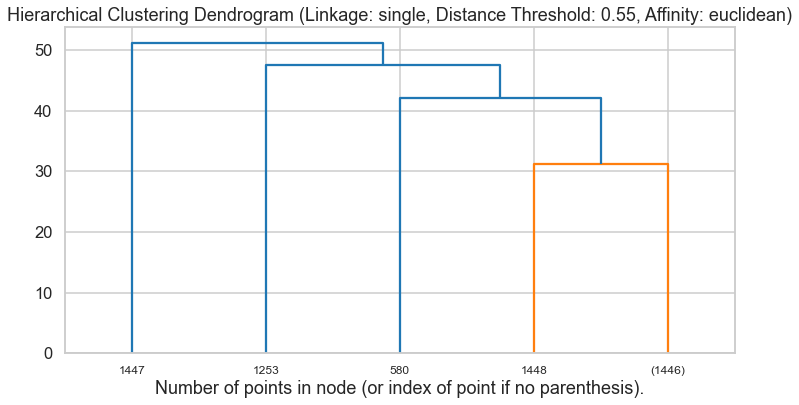

Silhouette Score: 0.01771900983879523


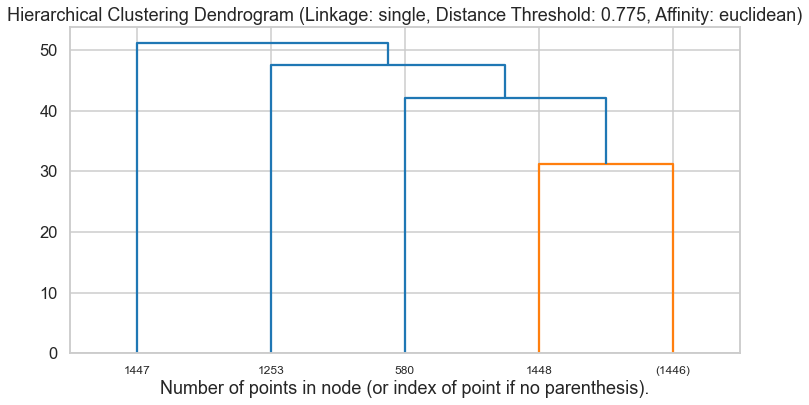

Silhouette Score: 0.0351023553202372


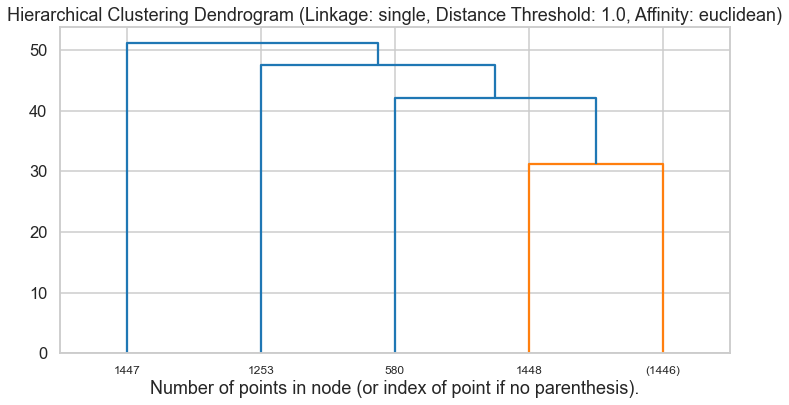

Silhouette Score: 0.05168067108159009


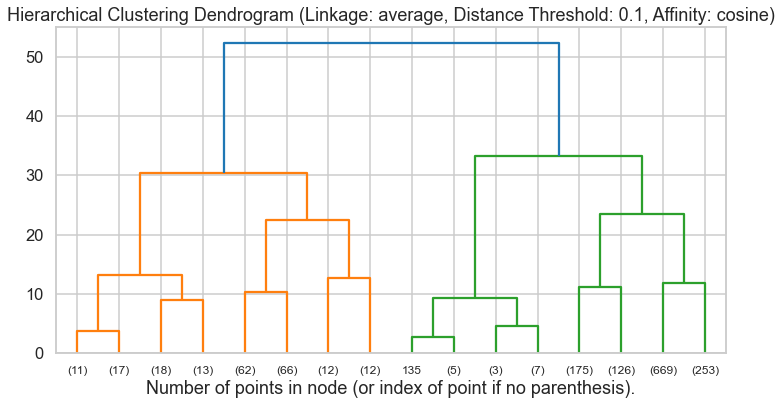

Silhouette Score: 0.5507724392106312


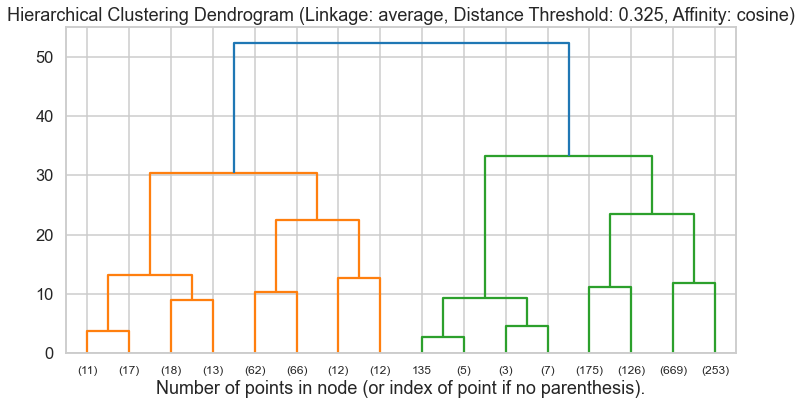

Silhouette Score: 0.5736163131356719


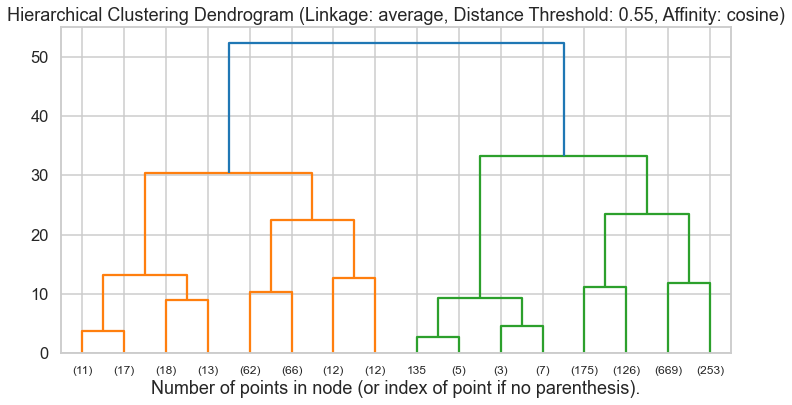

Silhouette Score: 0.56045739325593


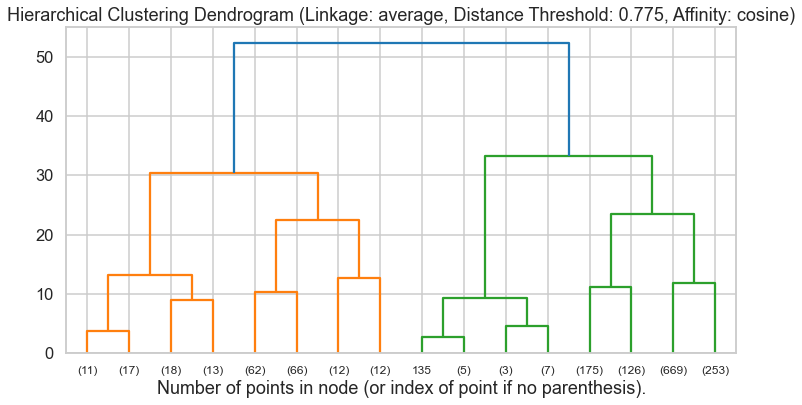

Silhouette Score: 0.558587793850764


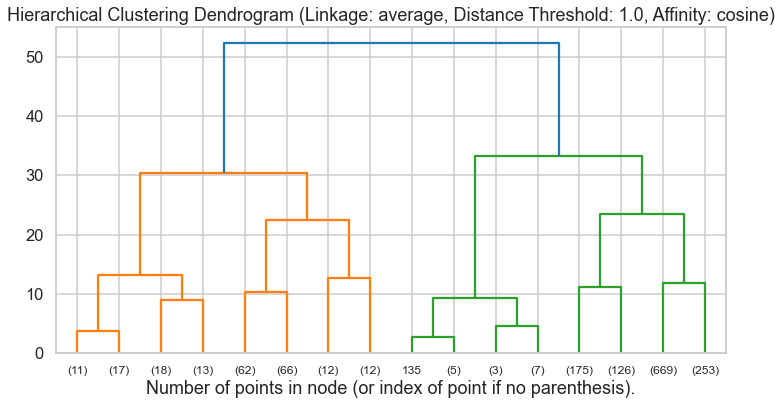

Silhouette Score: 0.554669039477657


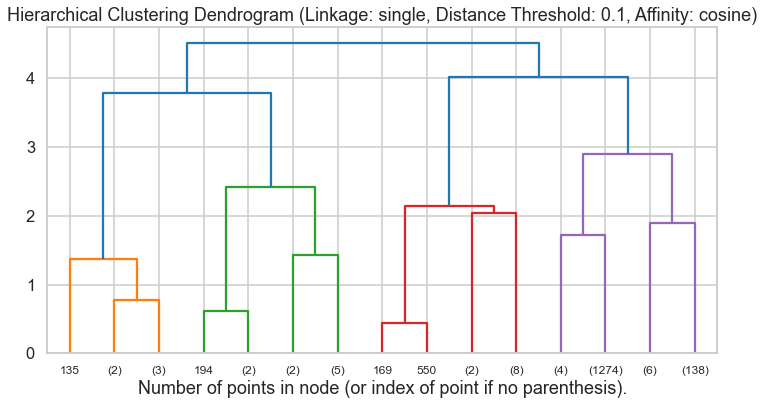

Silhouette Score: 0.41638233861834495


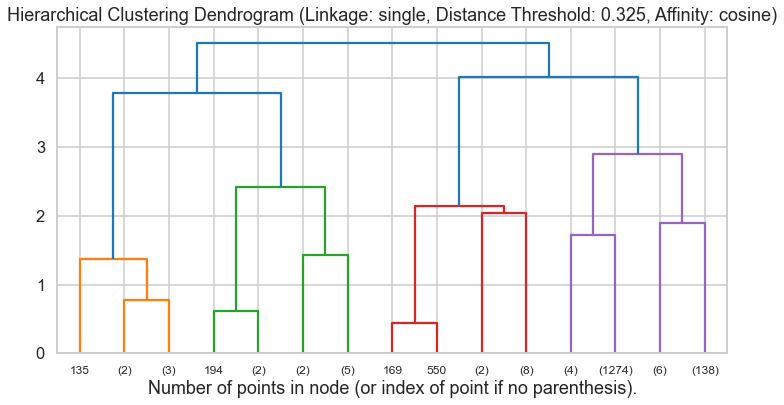

Silhouette Score: 0.30928285270460737


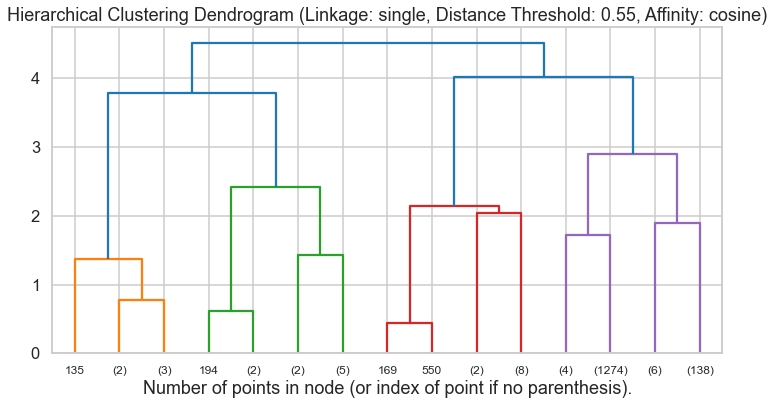

Silhouette Score: 0.20172892374784734


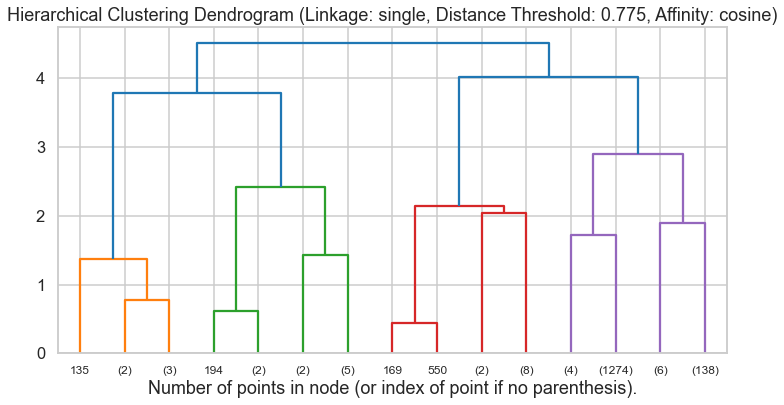

Silhouette Score: 0.1797561920028272


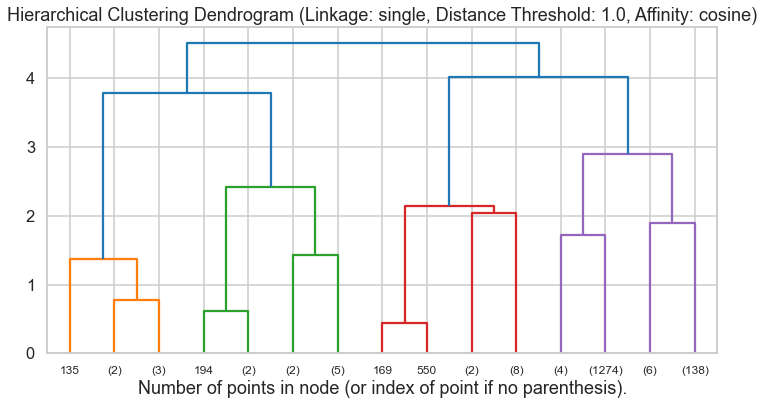

Silhouette Score: 0.24931153775359077


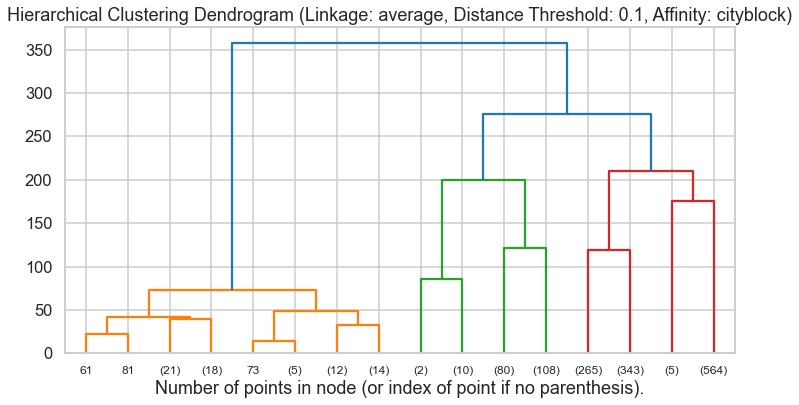

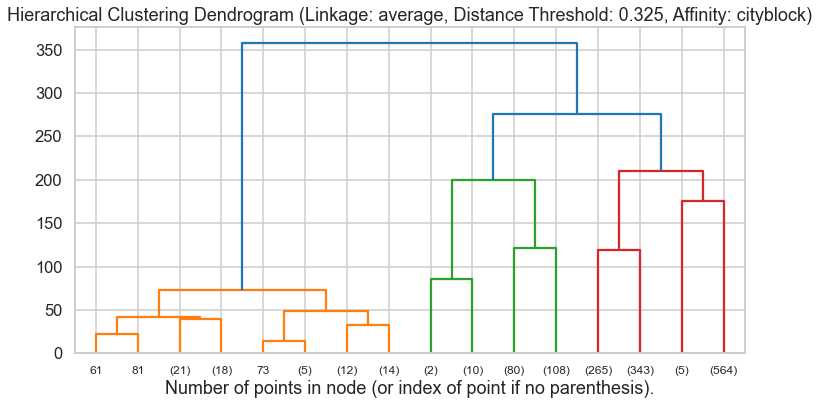

Silhouette Score: 0.006305693603030953


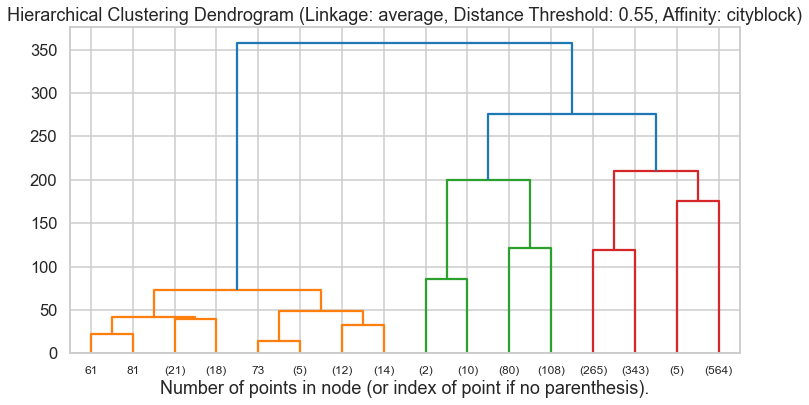

Silhouette Score: 0.011143415824324687


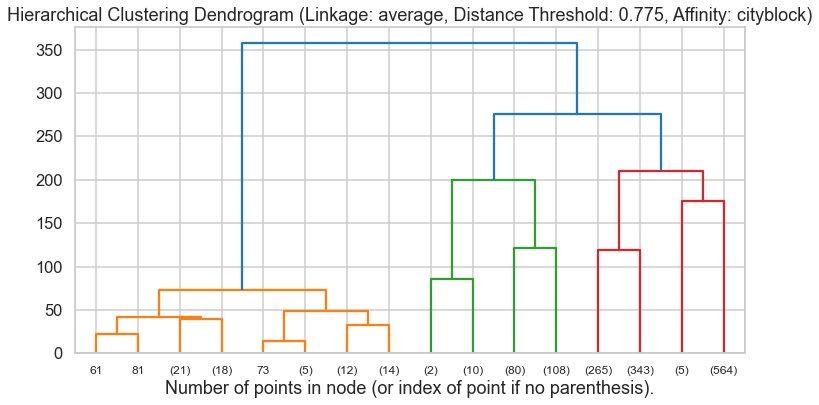

Silhouette Score: 0.018940013177695558


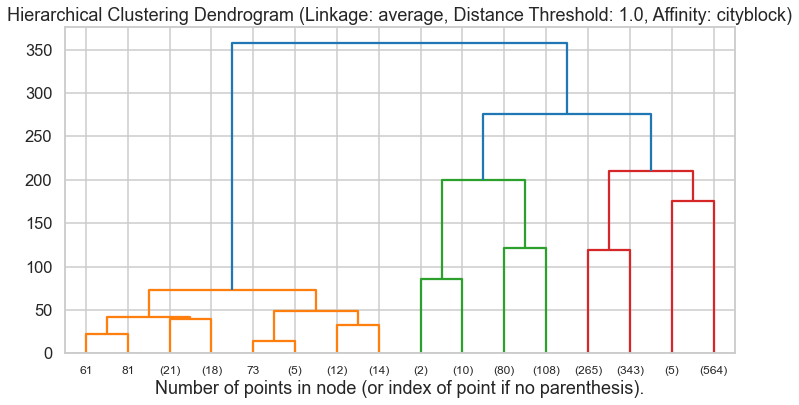

Silhouette Score: 0.026175386257318765


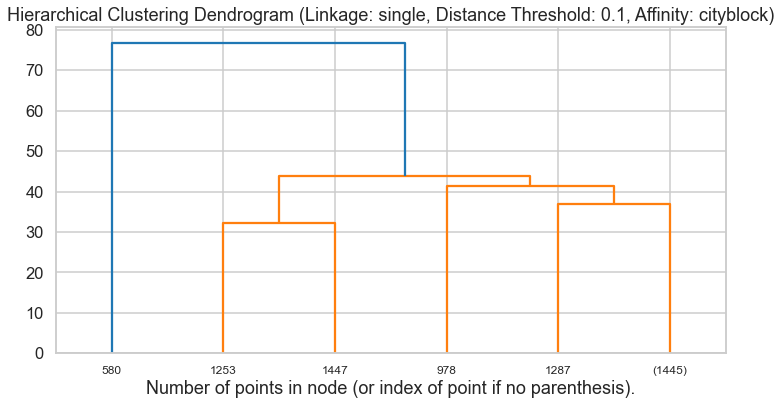

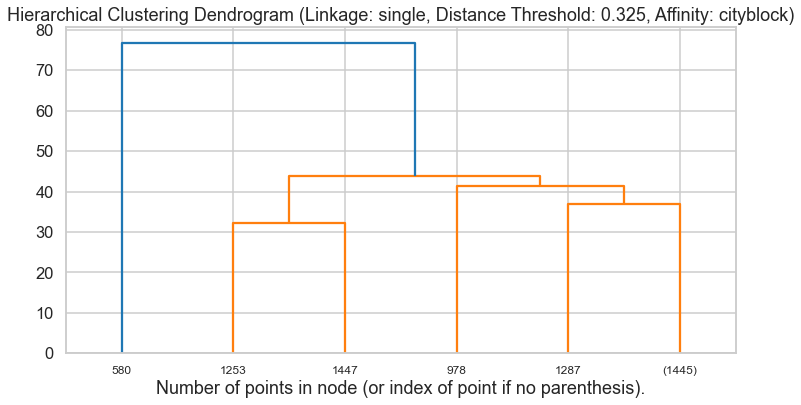

Silhouette Score: 0.006305693603030953


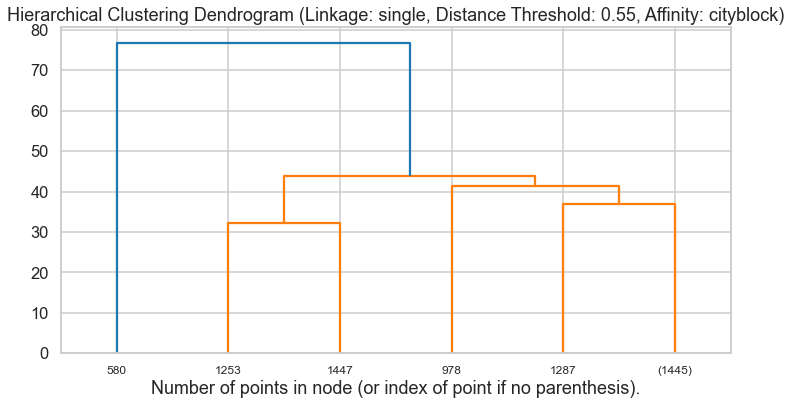

Silhouette Score: 0.011143415824324687


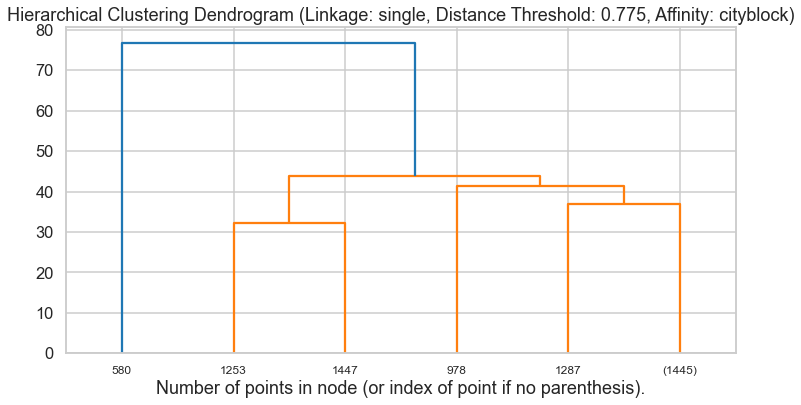

Silhouette Score: 0.018940013177695558


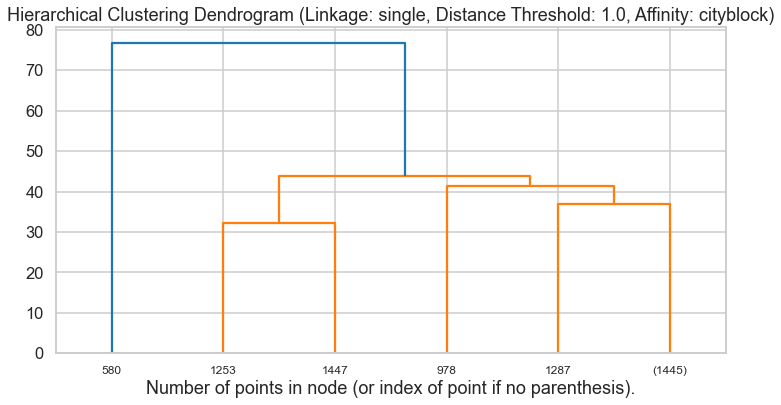

Silhouette Score: 0.026175386257318765
Best Parameters: {'distance_metric': 'cosine', 'linkage_type': 'average', 'distance_threshold': 0.325}
Best Silhouette Score: 0.5736163131356719


In [7]:
def hierarchical_clustering(X, affinity='euclidean', linkage_type='average', distance_threshold=None):

    distances = squareform(pdist(X, metric=affinity))
    # Perform hierarchical clustering
    model = AgglomerativeClustering(linkage=linkage_type, n_clusters=None, distance_threshold=distance_threshold)
    labels = model.fit_predict(distances)

    # Plot dendrogram
    plt.figure(figsize=(12, 6))
    plt.title(f'Hierarchical Clustering Dendrogram (Linkage: {linkage_type}, Distance Threshold: {distance_threshold}, Affinity: {affinity})')
    dendrogram(linkage(distances, method=linkage_type), truncate_mode='level', p=3)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    plt.show()

    # Calculate silhouette score
    silhouette_avg = silhouette_score(distances, labels)
    print(f'Silhouette Score: {silhouette_avg}')

    return silhouette_avg

# Example usage:
distance_metrics = ['euclidean', 'cosine', 'cityblock']
best_silhouette_score = float('-inf')
best_params = None

for distance_metric in distance_metrics:
    for linkage_type in ['average', 'single']:
        for distance_threshold in np.linspace(0.1, 1.0, 5):
            try:
                    silhouette_score_current = hierarchical_clustering(Multi_blob_Data,affinity=distance_metric, linkage_type=linkage_type, distance_threshold=distance_threshold)

                    # Store the best silhouette_score and parameters
                    if silhouette_score_current > best_silhouette_score:
                        best_silhouette_score = silhouette_score_current
                        best_params = {'distance_metric': distance_metric, 'linkage_type': linkage_type,'distance_threshold': distance_threshold}

            except ValueError as e:
                    # Skip when the number of clusters is one
                if "Number of labels is 1" in str(e):
                    continue
#         silhouette_score_current = hierarchical_clustering(Multi_blob_Data, affinity=distance_metric, linkage_type=linkage_type, distance_threshold=0.5)
        
#         # Store the best silhouette_score and parameters
#         if silhouette_score_current > best_silhouette_score:
#             best_silhouette_score = silhouette_score_current
#             best_params = {'distance_metric': distance_metric, 'linkage_type': linkage_type, 'distance_threshold': 0.5}

# Print the best parameters and silhouette score
print("Best Parameters:", best_params)
print("Best Silhouette Score:", best_silhouette_score)


## DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

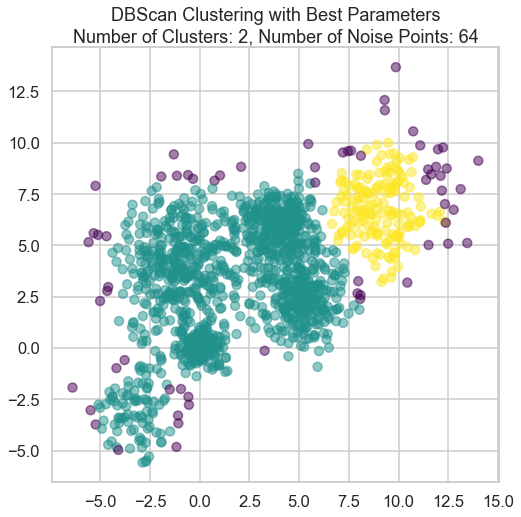

Best EPS: 0.8, Best Min_samples: 8
Best Silhouette Score: 0.3051951203876005


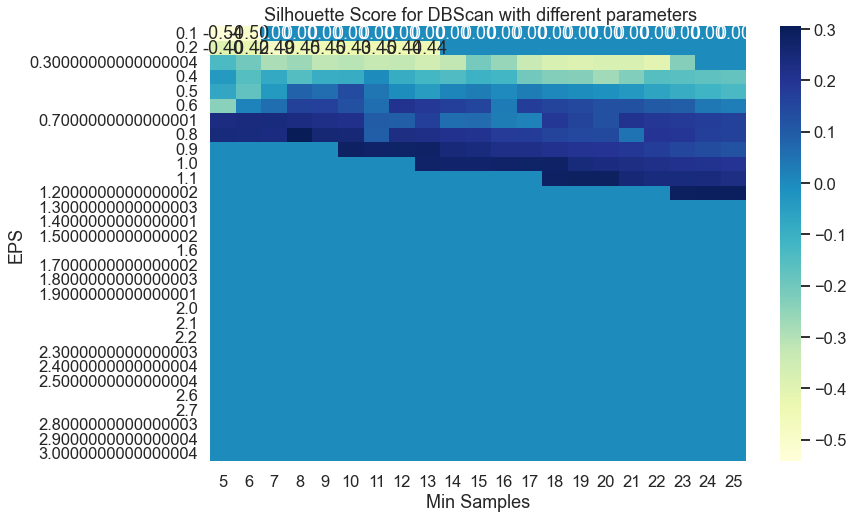

In [8]:
def perform_dbscan_with_average_silhouette(data, eps_range, min_samples_range):
    silhouette_scores = np.zeros((len(eps_range), len(min_samples_range)))

    for i, eps in enumerate(eps_range):
        for j, min_samples in enumerate(min_samples_range):
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(data)

            unique_labels = set(labels)
            if len(unique_labels) > 2:  # At least 2 clusters and noise
                silhouette_avg = silhouette_score(data, labels)
                silhouette_scores[i, j] = silhouette_avg

    return silhouette_scores

# Define the range of parameters to search
eps_range = np.arange(0.1, 3.1, 0.1)
min_samples_range = np.arange(5, 26, 1)

# Perform DBScan with varying parameters and average silhouette score
average_silhouette_scores = perform_dbscan_with_average_silhouette(Multi_blob_Data, eps_range, min_samples_range)

# Find the indices of the maximum average silhouette score
best_indices = np.unravel_index(np.argmax(average_silhouette_scores), average_silhouette_scores.shape)
best_eps, best_min_samples, best_avg_silhouette_score = eps_range[best_indices[0]], min_samples_range[best_indices[1]], average_silhouette_scores[best_indices]

# Plot resulting clusters with the best parameters
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(Multi_blob_Data)

# Count the number of clusters (excluding noise)
num_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)
num_noise_points = np.sum(best_labels == -1)

# Plot the clusters
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=best_labels, cmap='viridis', alpha=0.5)
plt.title(f'DBScan Clustering with Best Parameters\nNumber of Clusters: {num_clusters}, Number of Noise Points: {num_noise_points}')
plt.show()

# Print the best parameters and corresponding average silhouette score
print(f"Best EPS: {best_eps}, Best Min_samples: {best_min_samples}")
print(f"Best Silhouette Score: {best_avg_silhouette_score}")

# Plot average silhouette scores
plt.figure(figsize=(12, 8))
sns.heatmap(average_silhouette_scores, annot=True, fmt=".2f", cmap="YlGnBu",
                xticklabels=min_samples_range, yticklabels=eps_range)
plt.xlabel("Min Samples")
plt.ylabel("EPS")
plt.title(" Silhouette Score for DBScan with different parameters")
plt.show()


## Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

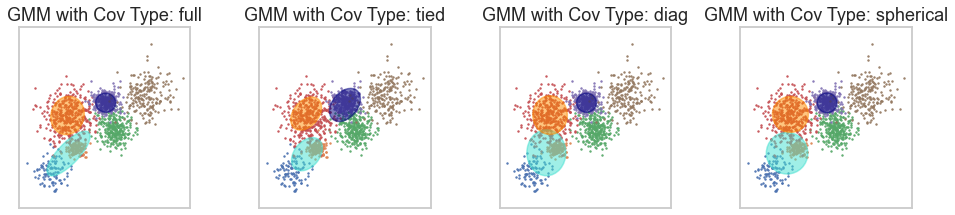

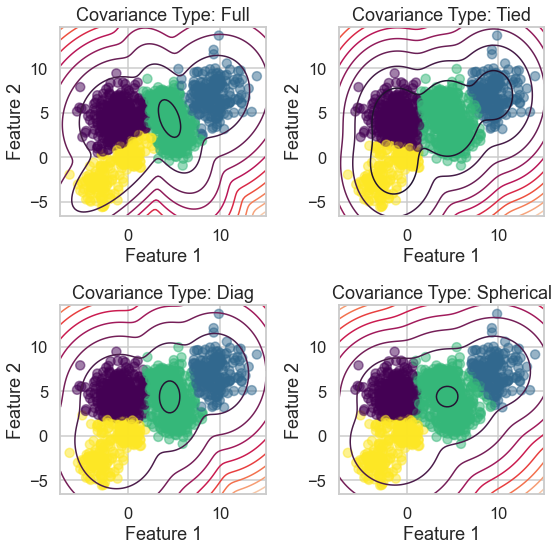

Log-likelihood for Full covariance type: -4.90
Log-likelihood for Tied covariance type: -5.00
Log-likelihood for Diag covariance type: -4.99
Log-likelihood for Spherical covariance type: -5.02


In [9]:
colors = ["navy", "turquoise", "darkorange"]

def make_ellipses(gmm, ax):
    for n, color in enumerate(colors):
        if gmm.covariance_type == "full":
            covariances = gmm.covariances_[n][:2, :2]
        elif gmm.covariance_type == "tied":
            covariances = gmm.covariances_[:2, :2]
        elif gmm.covariance_type == "diag":
            covariances = np.diag(gmm.covariances_[n][:2])
        elif gmm.covariance_type == "spherical":
            covariances = np.eye(gmm.means_.shape[1]) * gmm.covariances_[n]
        v, w = np.linalg.eigh(covariances)
        u = w[0] / np.linalg.norm(w[0])
        angle = np.arctan2(u[1], u[0])
        angle = 180 * angle / np.pi  # convert to degrees
        v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
        ell = mpl.patches.Ellipse(
            gmm.means_[n, :2], v[0], v[1], angle=180 + angle, color=color
        )
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)
        ax.add_artist(ell)
        ax.set_aspect("equal", "datalim")

n_classes = len(np.unique(y))

# Set up GMM parameters
covariance_types = ["full", "tied", "diag", "spherical"]
n_estimators = len(covariance_types)

plt.figure(figsize=(4 * n_estimators, 8))
plt.subplots_adjust(wspace=0.4, hspace=0.4)

for index, cov_type in enumerate(covariance_types):
    # Fit GMM with the current covariance_type
    gmm = GaussianMixture(n_components=n_classes, covariance_type=cov_type, random_state=42)
    gmm.fit(Multi_blob_Data)

    # Plot data points
    plt.subplot(2, n_estimators, index + 1)
    for n, color in enumerate(sns.color_palette("deep")):
        data = Multi_blob_Data[y == n]
        plt.scatter(data[:, 0], data[:, 1], s=0.8, color=color, label=f"Class {n + 1}")

    # Plot GMM components
    make_ellipses(gmm, plt.gca())
    plt.title(f"GMM with Cov Type: {cov_type}")
    plt.xticks(())
    plt.yticks(())

#     # Plot 2D contour plot of the GMM
#     plt.subplot(2, n_estimators, index + n_estimators + 1)
#     h = plt.gca()
#     x, y = np.meshgrid(np.linspace(-10, 15), np.linspace(-10, 15))
#     xy = np.column_stack((x.ravel(), y.ravel()))
#     z = -gmm.score_samples(xy)
#     z = z.reshape(x.shape)
#     plt.contour(x, y, z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10))
#     plt.title(f"2D Contour of GMM with Covariance Type: {cov_type}")
#     plt.xlabel("Feature 1")
#     plt.ylabel("Feature 2")

plt.show()


## Another way of representation VERRA

log_likelihoods = {}

for i, covariance_type in enumerate(covariance_types, 1):
    # Create and fit GMM model
    gmm = GaussianMixture(n_components=4, covariance_type=covariance_type, random_state=0)
    gmm.fit(Multi_blob_Data)
    
    log_likelihoods[covariance_type] = gmm.score(Multi_blob_Data)
    
    # Generate grid points to evaluate the density
    x_min, x_max = Multi_blob_Data[:, 0].min() - 1, Multi_blob_Data[:, 0].max() + 1
    y_min, y_max = Multi_blob_Data[:, 1].min() - 1, Multi_blob_Data[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    Z = -gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot contour plot
    plt.subplot(2, 2, i)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], marker='o', c=gmm.predict(Multi_blob_Data), cmap='viridis', alpha=0.5)
    plt.contour(xx, yy, Z, levels=10, linewidths=1.5)
    plt.title(f'Covariance Type: {covariance_type.capitalize()}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()
for covariance_type, log_likelihood in log_likelihoods.items():
    print(f'Log-likelihood for {covariance_type.capitalize()} covariance type: {log_likelihood:.2f}')


# iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [10]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = ['blue','black','red','yellow','green','brown','orange','violet','lightpink','aqua']
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

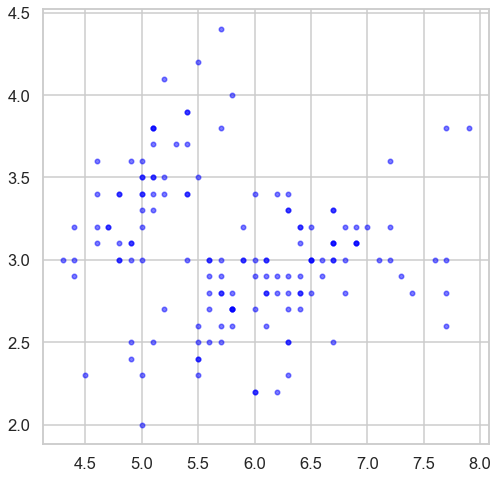

In [11]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']
display_cluster(iris_data.data)

## Kmeans

### Applying PCA first to reduce the iris to 2 features

For K=2, Silhouette Score: 0.7056703225091883
For K=3, Silhouette Score: 0.5976764219497545
For K=4, Silhouette Score: 0.5577409232179588
For K=5, Silhouette Score: 0.5515547785410179
For K=6, Silhouette Score: 0.4441209760037298
For K=7, Silhouette Score: 0.43351819489498855
For K=8, Silhouette Score: 0.45285311347101753
For K=9, Silhouette Score: 0.44356967602313363
For K=10, Silhouette Score: 0.4037502088778099
The best K based on Silhouette Score: 2


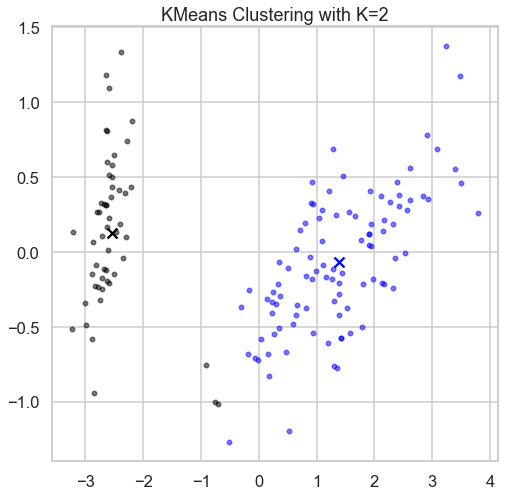

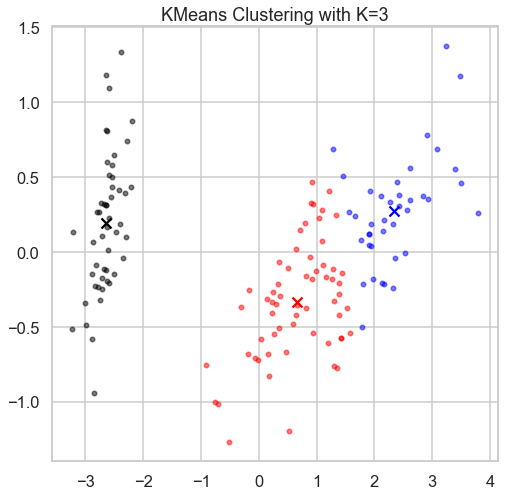

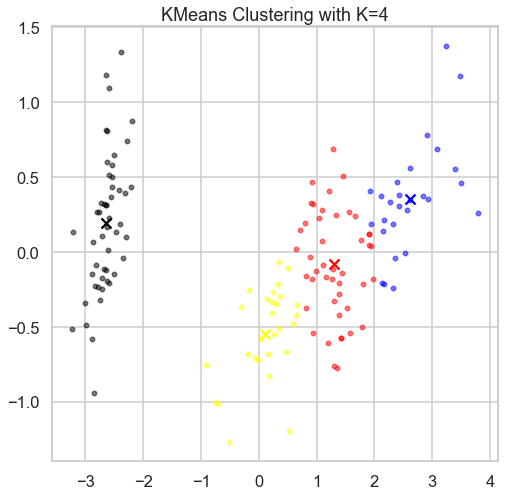

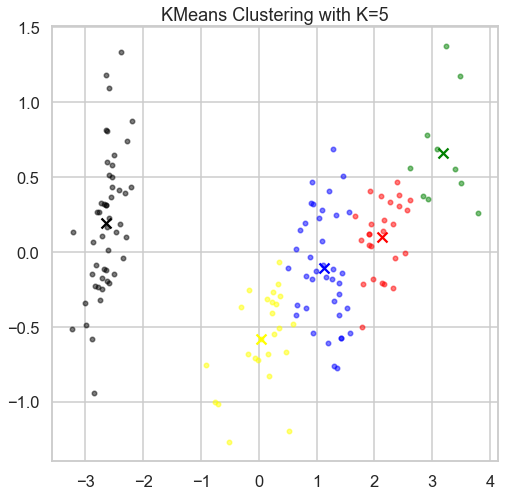

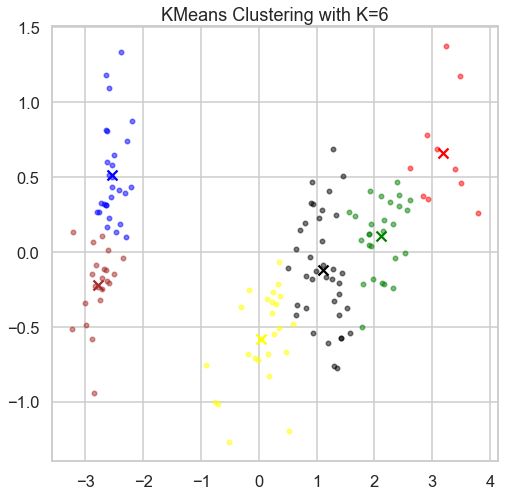

...

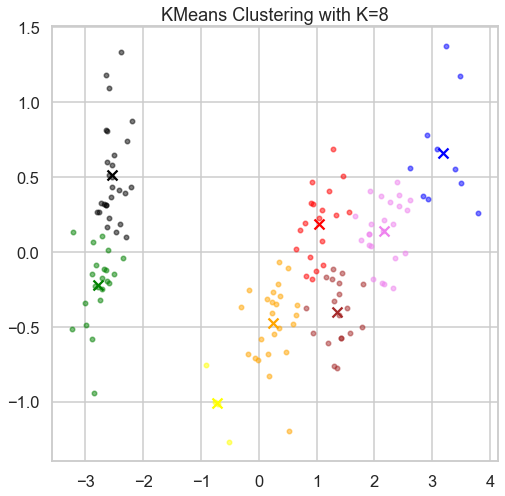

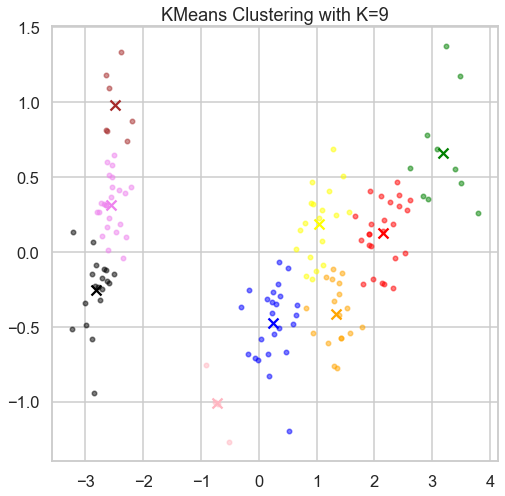

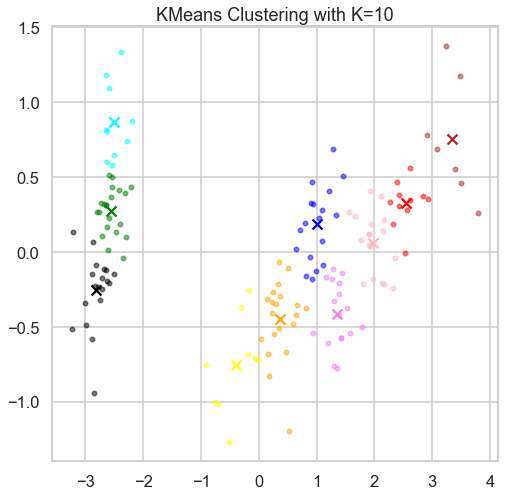

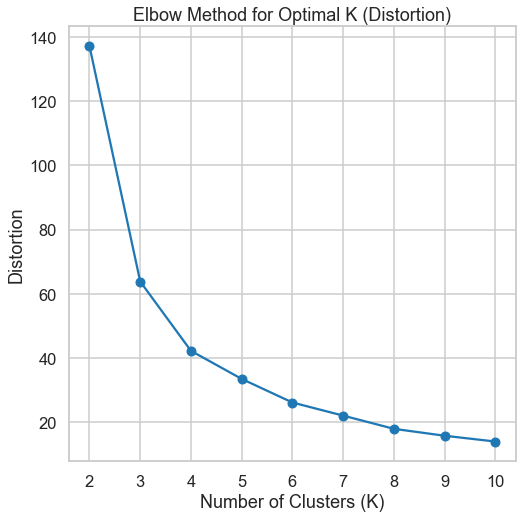

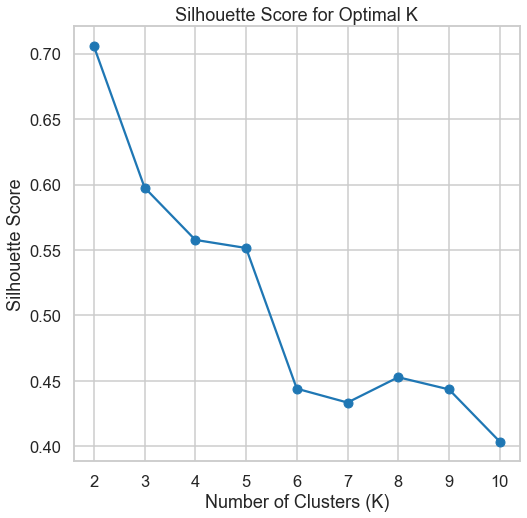

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data

# Apply PCA to reduce the dataset to 2 dimensions
pca = PCA(n_components=2)
iris_features_pca = pca.fit_transform(iris_features)

# Specify K values to try
k_values = range(2, 11)

# Perform KMeans clustering and display results using PCA
best_k_pca = kmeans_clustering(iris_features_pca, k_values)


### Taking every two features together then apply the kmeans function

For K=2, Silhouette Score: 0.4629549773635977
For K=3, Silhouette Score: 0.4450525692083638
For K=4, Silhouette Score: 0.4206583419478651
For K=5, Silhouette Score: 0.41181523011737703
For K=6, Silhouette Score: 0.3940131398141253
For K=7, Silhouette Score: 0.3721654418203221
For K=8, Silhouette Score: 0.3825506599589951
For K=9, Silhouette Score: 0.3934201505779464
For K=10, Silhouette Score: 0.40259824410360334
The best K based on Silhouette Score: 2
For K=2, Silhouette Score: 0.7097529826994816
For K=3, Silhouette Score: 0.5890584158017611
For K=4, Silhouette Score: 0.5645593160995663
For K=5, Silhouette Score: 0.5577931215347036
For K=6, Silhouette Score: 0.41177757163941237
For K=7, Silhouette Score: 0.40668478139262904
For K=8, Silhouette Score: 0.41383464955438437
For K=9, Silhouette Score: 0.39620674415596785
For K=10, Silhouette Score: 0.4292093502645689
The best K based on Silhouette Score: 2
For K=2, Silhouette Score: 0.5569997286881243
For K=3, Silhouette Score: 0.503955822

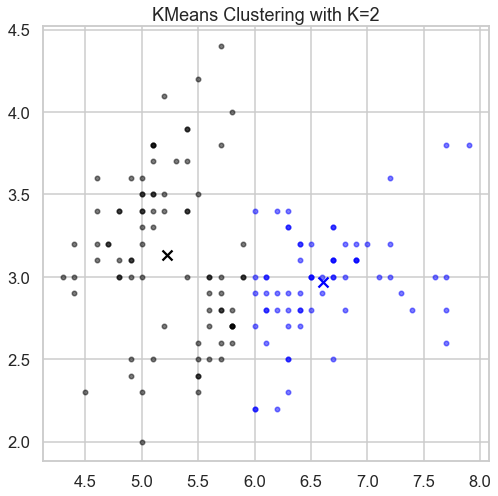

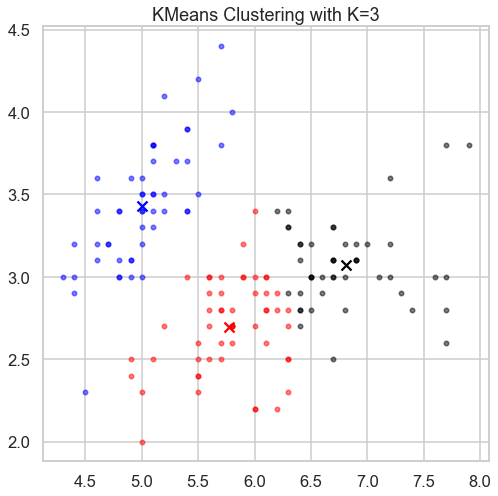

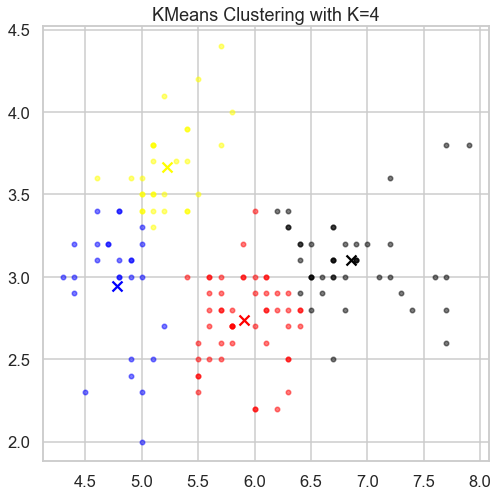

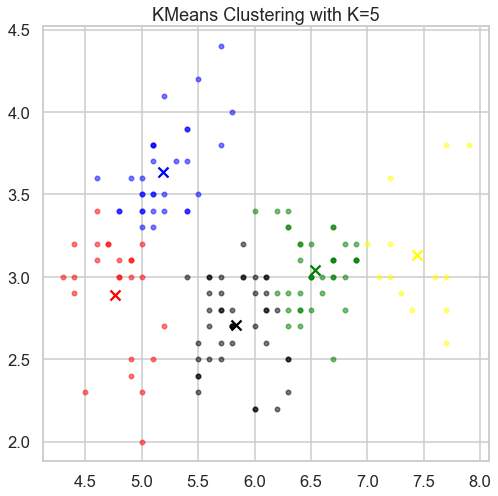

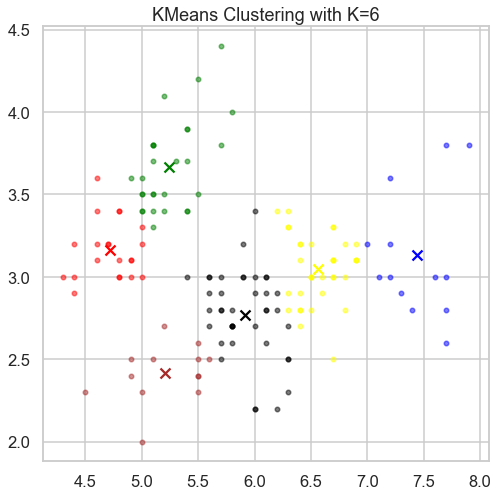

...

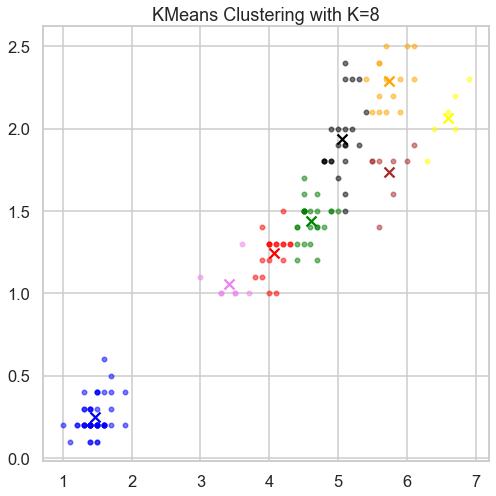

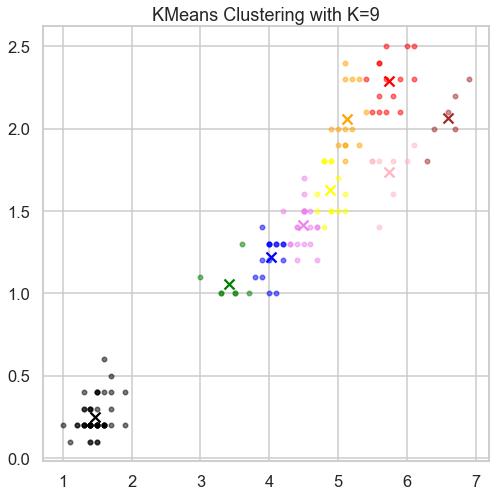

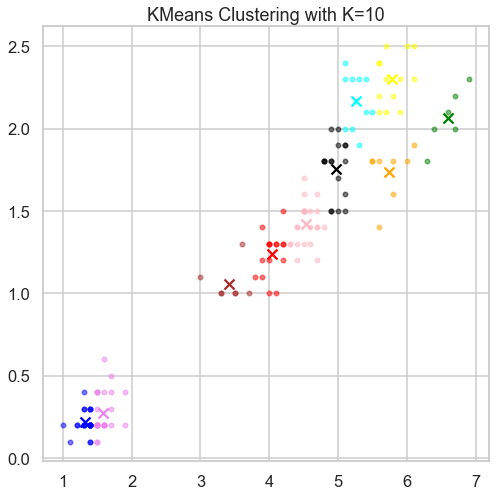

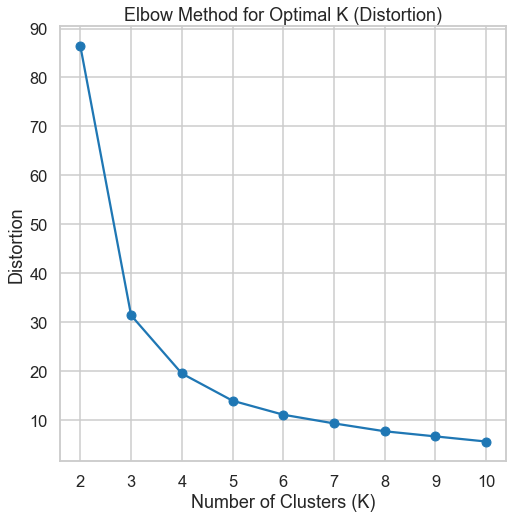

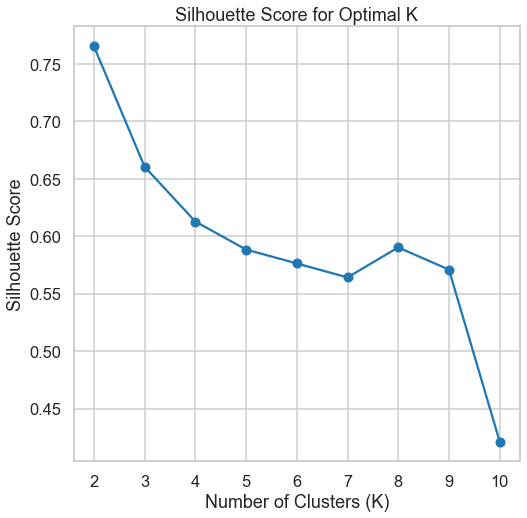

In [13]:
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data
feature_names = iris_data.feature_names

# Specify K values to try
k_values = range(2, 11)

# Get all pairs of features
feature_pairs = list(combinations(range(iris_features.shape[1]), 2))

# Perform KMeans clustering for each feature pair
best_k_per_pair = {}
for pair in feature_pairs:
    features_subset = iris_features[:, pair]
    best_k = kmeans_clustering(features_subset, k_values)
    best_k_per_pair[pair] = best_k

# Print the best K and feature names for each pair
for pair, best_k in best_k_per_pair.items():
    feature_names_subset = [feature_names[i] for i in pair]
    print(f'Best K for features {feature_names_subset}: {best_k}')


## Heirarchal clustering

### Taking every two features together 

In [14]:
# # Load Iris dataset
# iris_data = load_iris()
# X = iris_data.data
# feature_names = iris_data.feature_names

# # Select every pair of features
# pairs_of_features = [(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]

# # Perform hierarchical clustering for each pair of features
# best_silhouette_score = float('-inf')
# best_params = None

# for pair in pairs_of_features:
#     feature_subset = X[:, pair]
#     feature_subset_names = [feature_names[i] for i in pair]
#     print ("\nPair of Features:", feature_subset_names )
#     for distance_metric in ['euclidean', 'cosine', 'cityblock']:
#         for linkage_type in ['average', 'single']:
#             silhouette_score_current = hierarchical_clustering(feature_subset, affinity=distance_metric, linkage_type=linkage_type,distance_threshold=0.5)
            
#             # Store the best silhouette_score and parameters
#             if silhouette_score_current > best_silhouette_score:
#                 best_silhouette_score = silhouette_score_current
#                 best_params = {'pair': feature_subset_names, 'distance_metric': distance_metric, 'linkage_type': linkage_type}

# # Print the best parameters and silhouette score
# print("\nBest Parameters:", best_params)
# print("Best Silhouette Score:", best_silhouette_score)



Pair of Features: ['sepal length (cm)', 'sepal width (cm)']


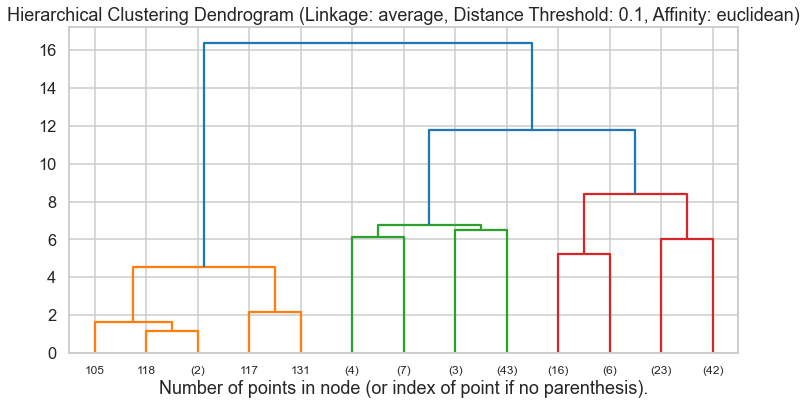

Silhouette Score: 0.39999990751224895


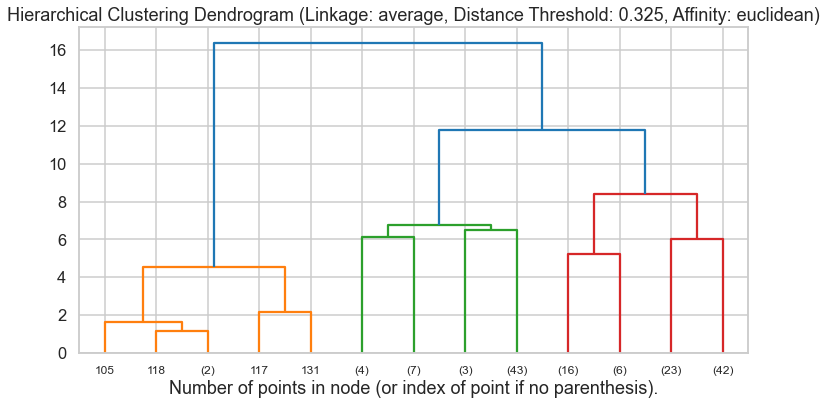

Silhouette Score: 0.39999990751224895


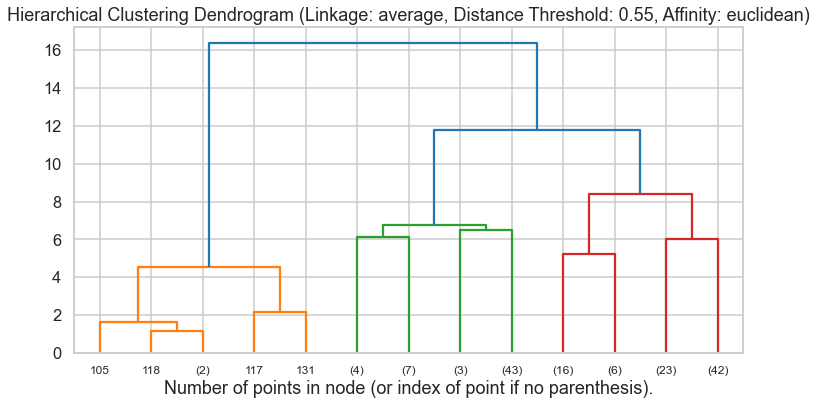

Silhouette Score: 0.4070545289742814


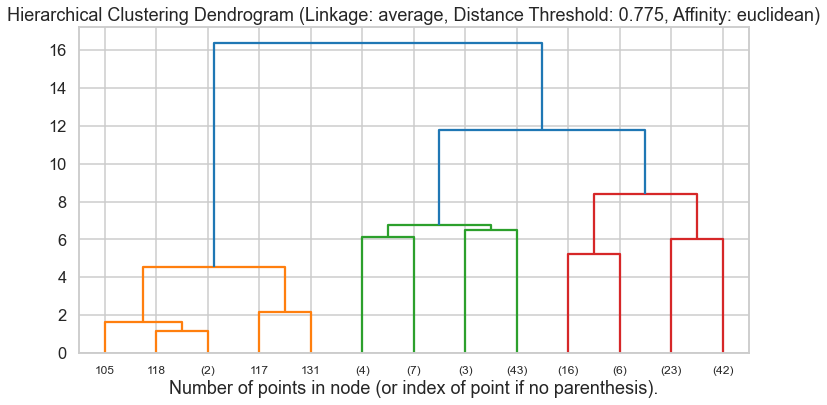

Silhouette Score: 0.4138733371100864


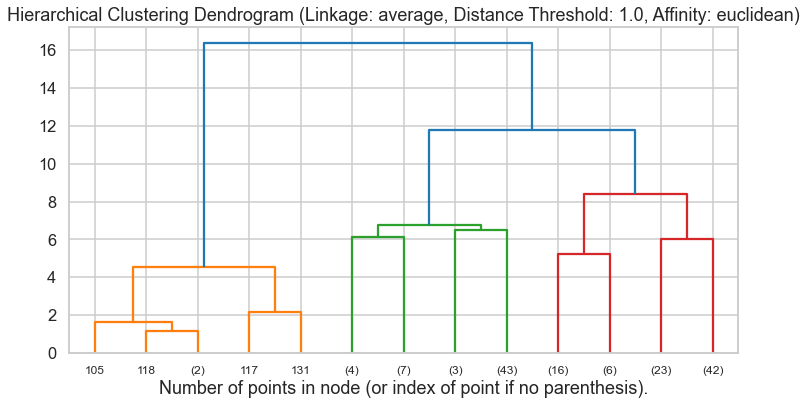

Silhouette Score: 0.4343565440171985


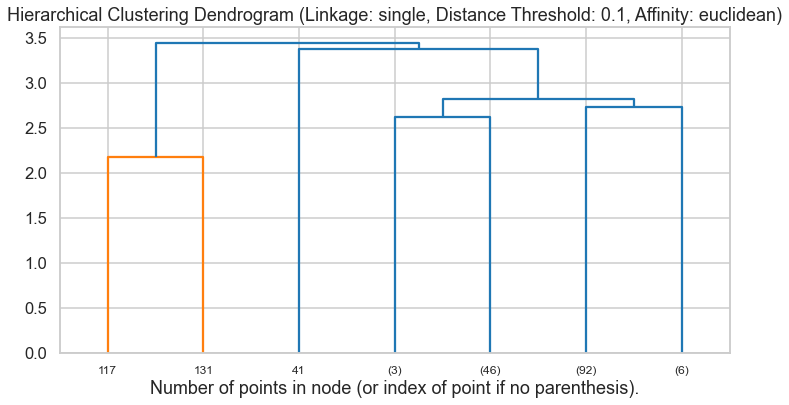

Silhouette Score: 0.39999990751224895


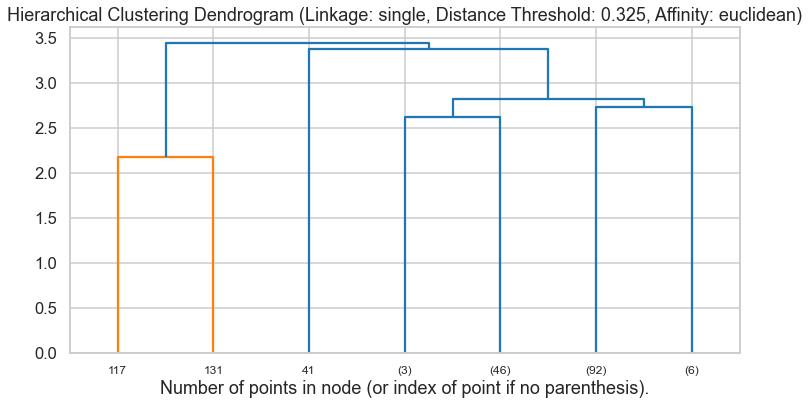

Silhouette Score: 0.39999990751224895


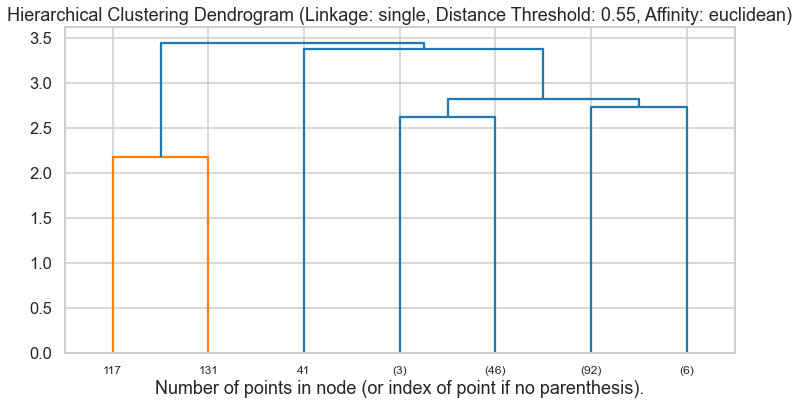

Silhouette Score: 0.4070545289742814


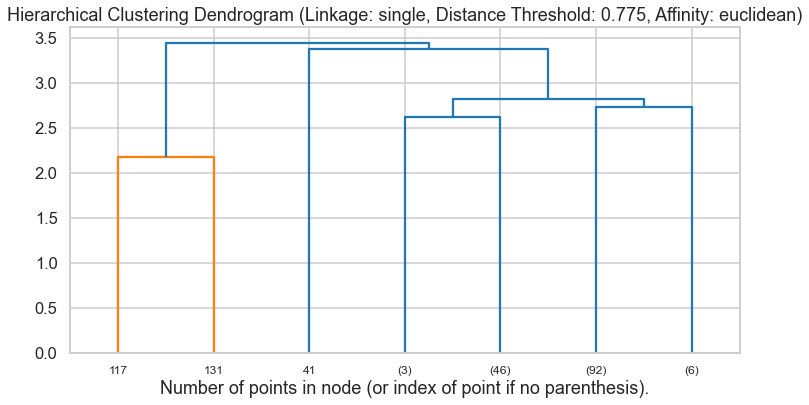

Silhouette Score: 0.3661020280065681


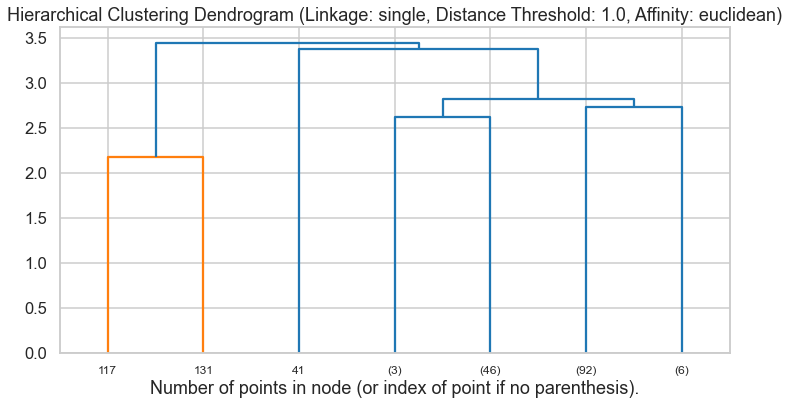

Silhouette Score: 0.3428660523206156


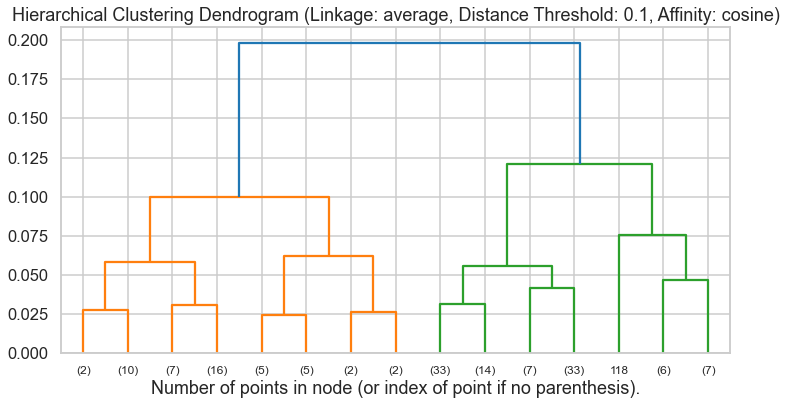

Silhouette Score: 0.6476217445807798


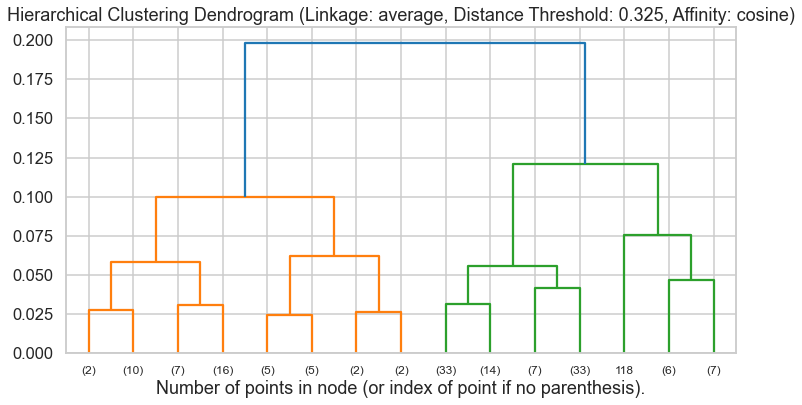

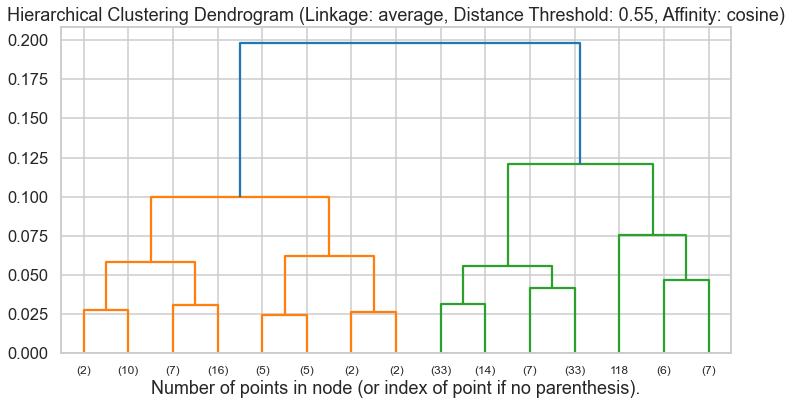

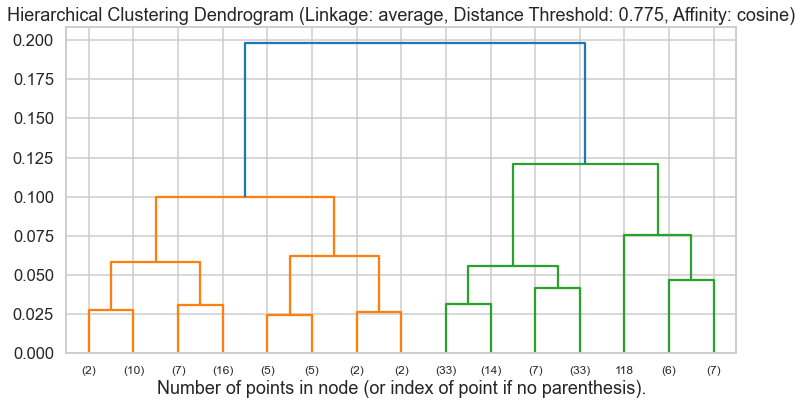

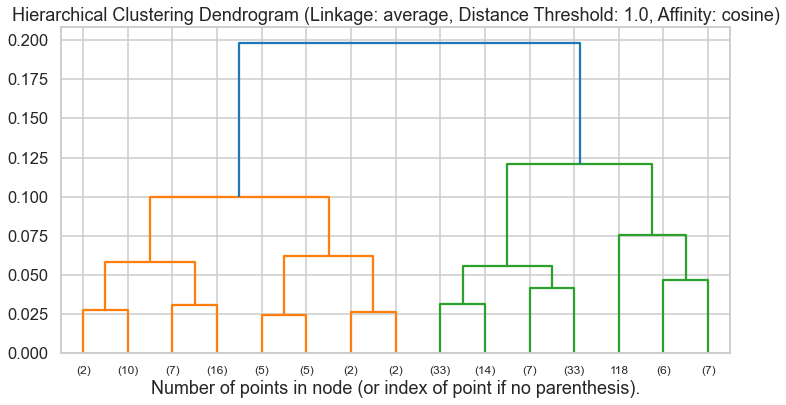

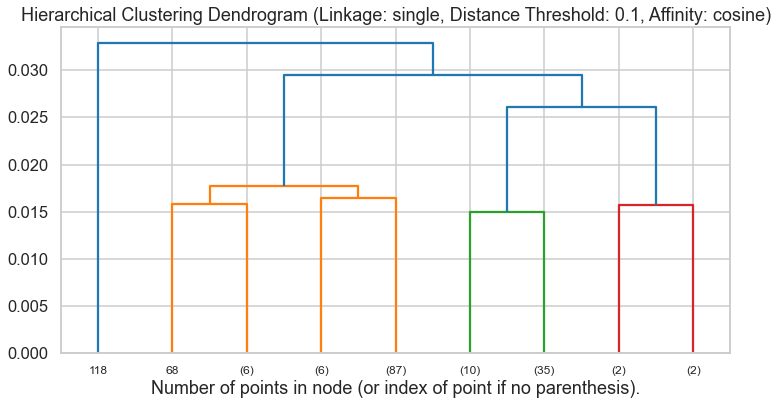

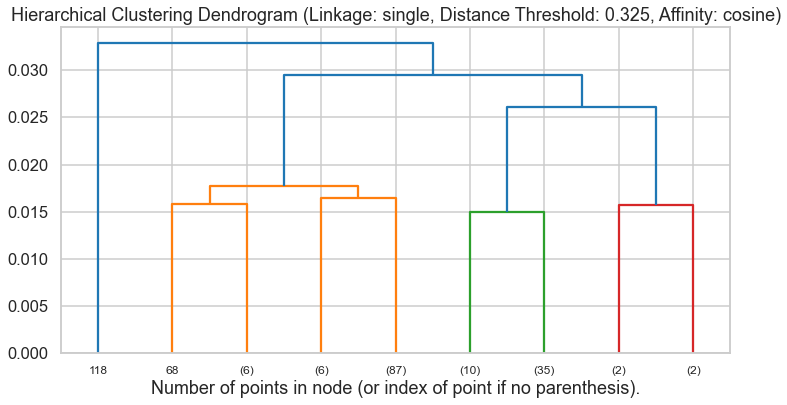

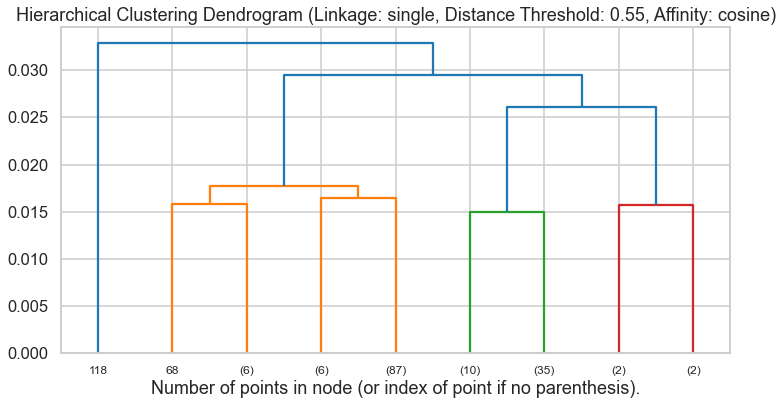

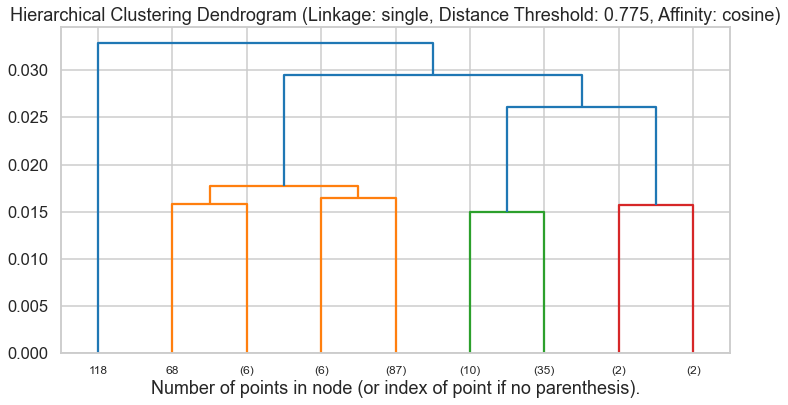

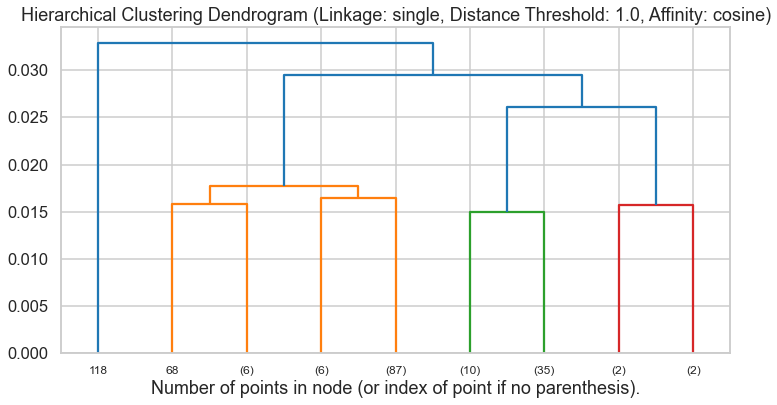

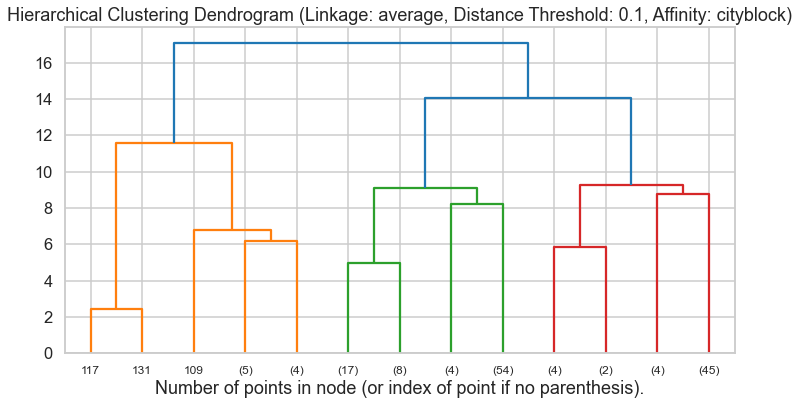

Silhouette Score: 0.39999995907500413


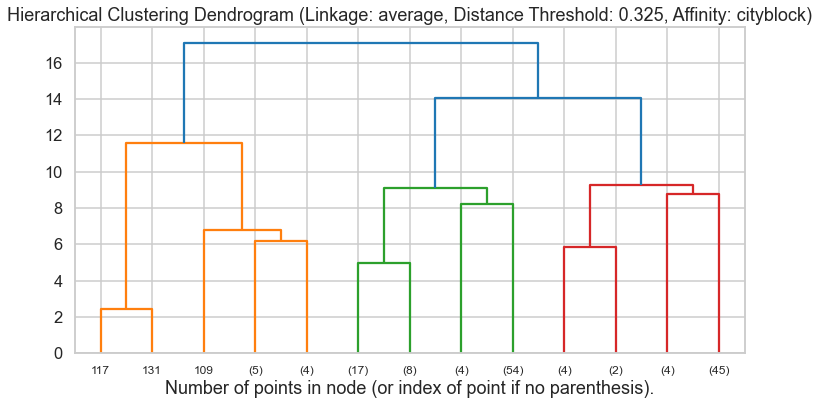

Silhouette Score: 0.39999995907500413


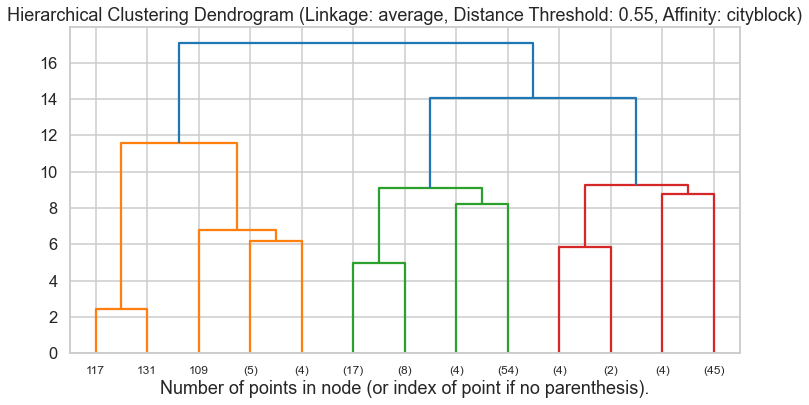

Silhouette Score: 0.39999995907500413


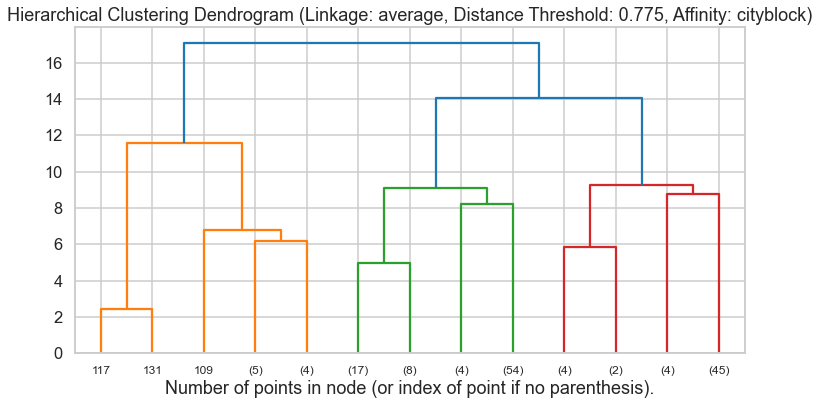

Silhouette Score: 0.39999995907500413


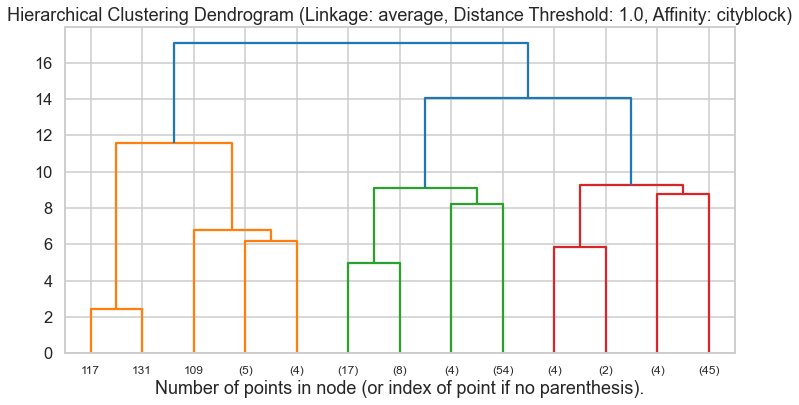

Silhouette Score: 0.39999995907500413


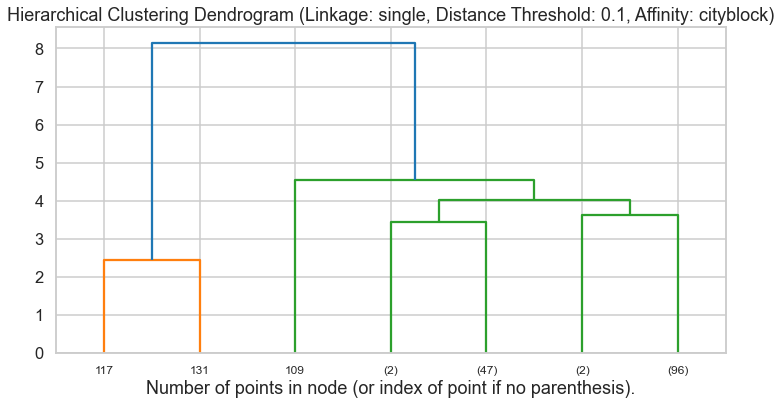

Silhouette Score: 0.39999995907500413


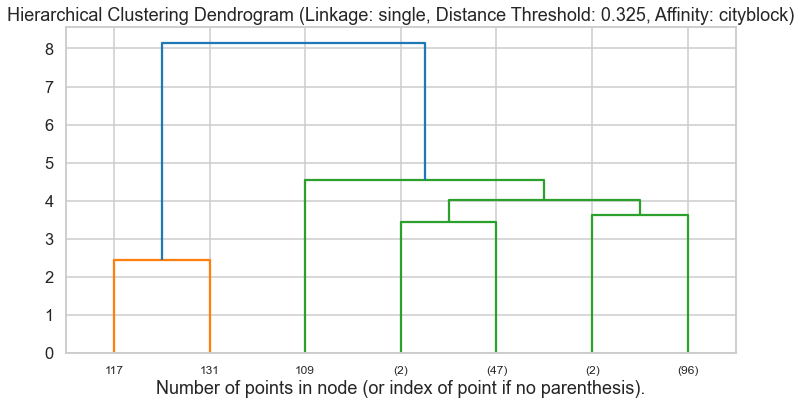

Silhouette Score: 0.39999995907500413


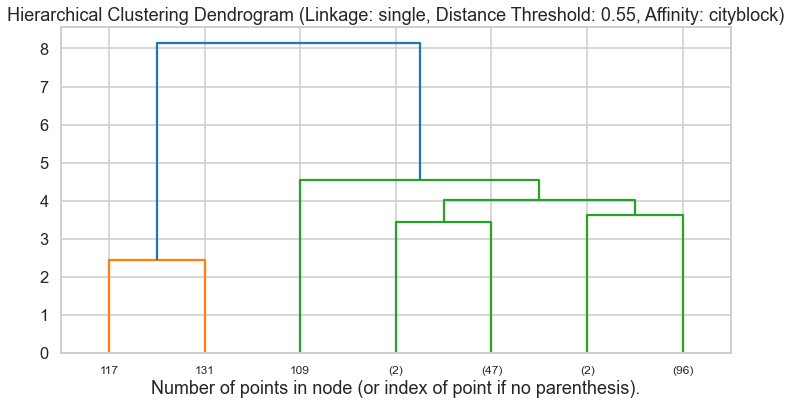

Silhouette Score: 0.39999995907500413


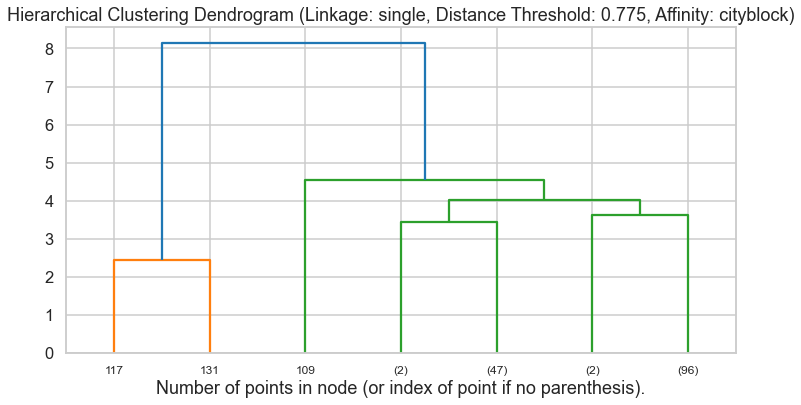

Silhouette Score: 0.39999995907500413


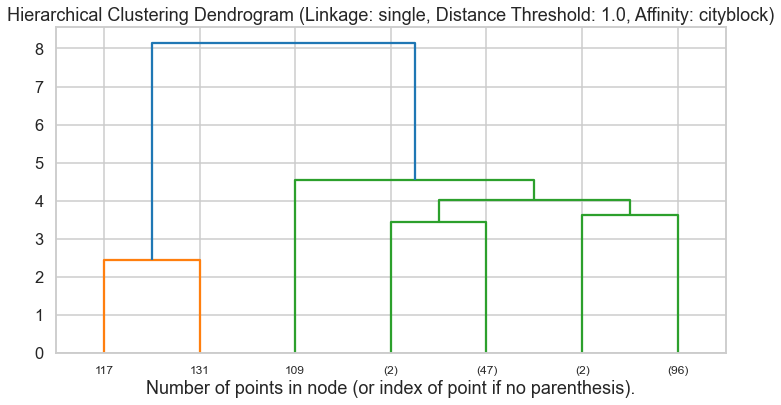

Silhouette Score: 0.39999995907500413

Pair of Features: ['sepal length (cm)', 'petal length (cm)']


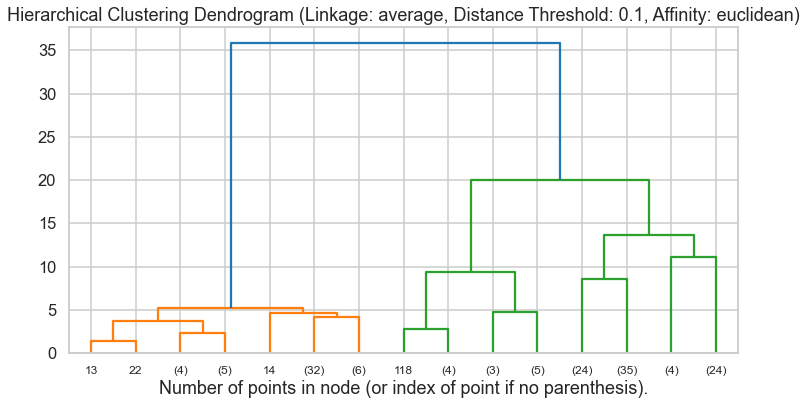

Silhouette Score: 0.3399998684932954


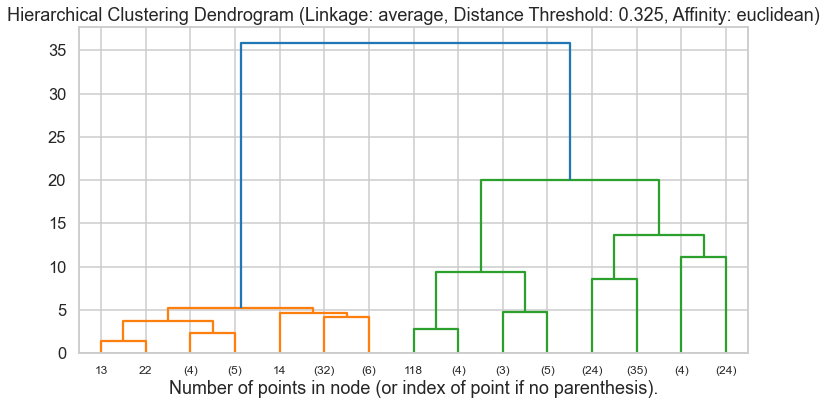

Silhouette Score: 0.3399998684932954


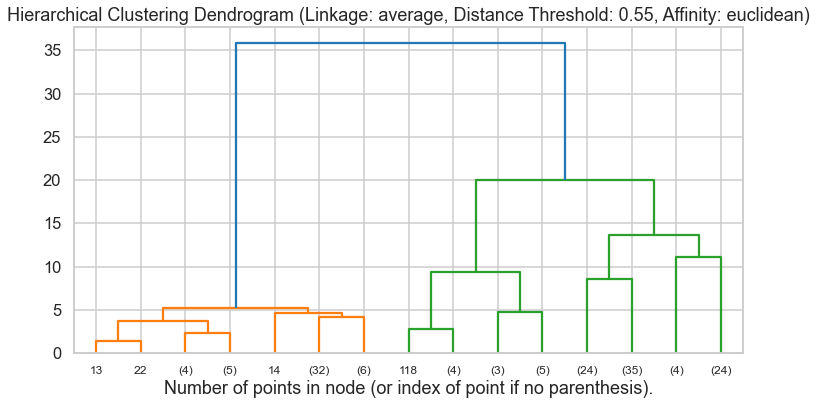

Silhouette Score: 0.3399998684932954


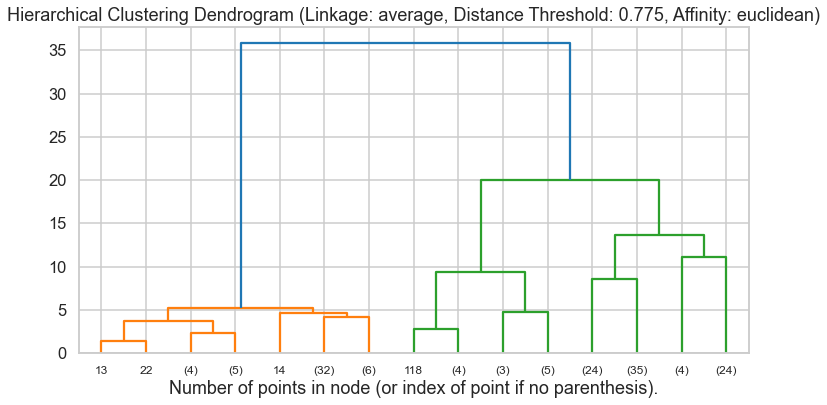

Silhouette Score: 0.34824445316556873


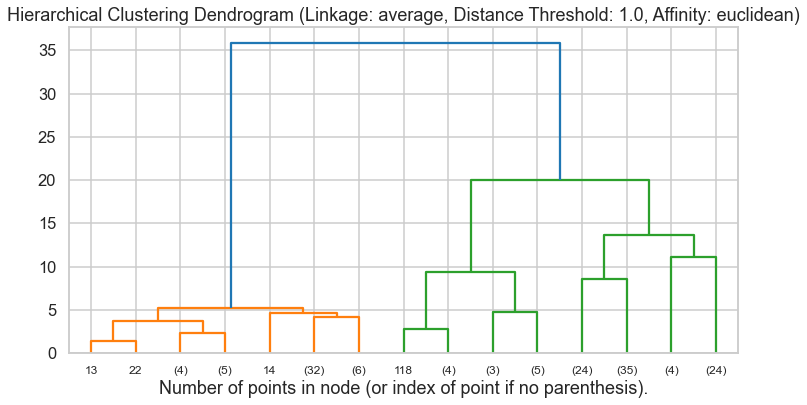

Silhouette Score: 0.3685395128124186


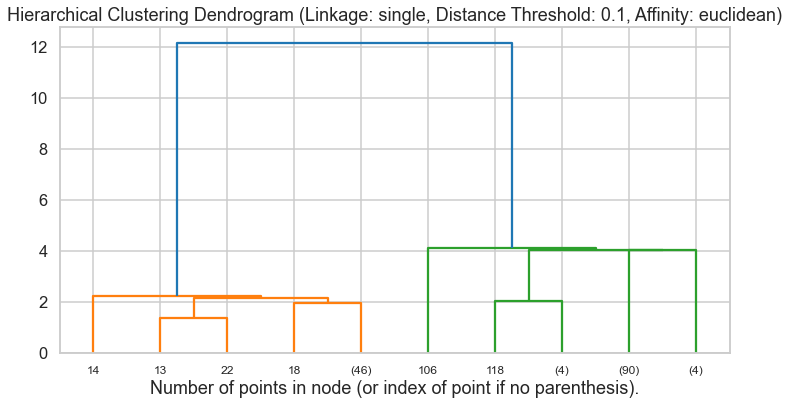

Silhouette Score: 0.3399998684932954


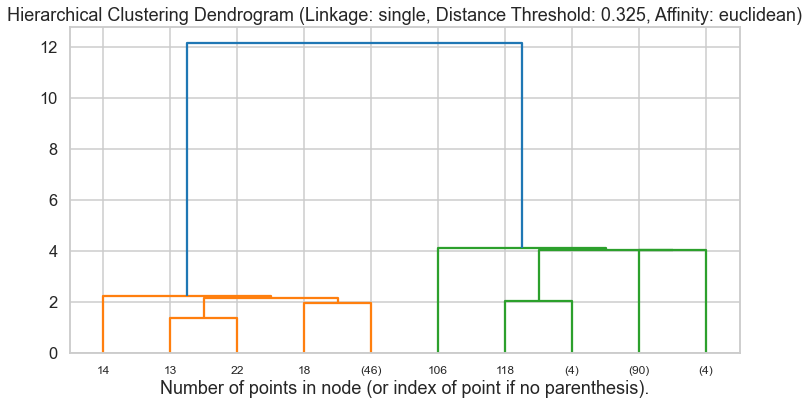

Silhouette Score: 0.3399998684932954


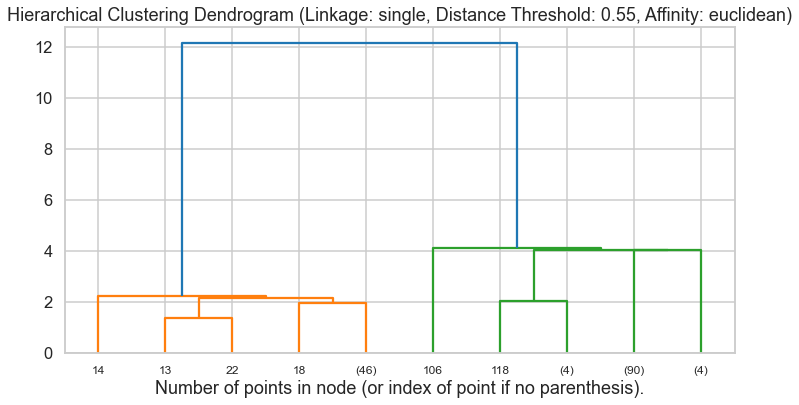

Silhouette Score: 0.3399998684932954


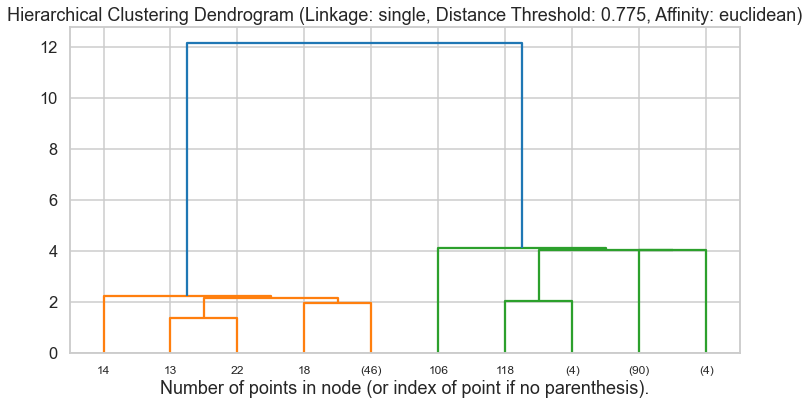

Silhouette Score: 0.2657931576864924


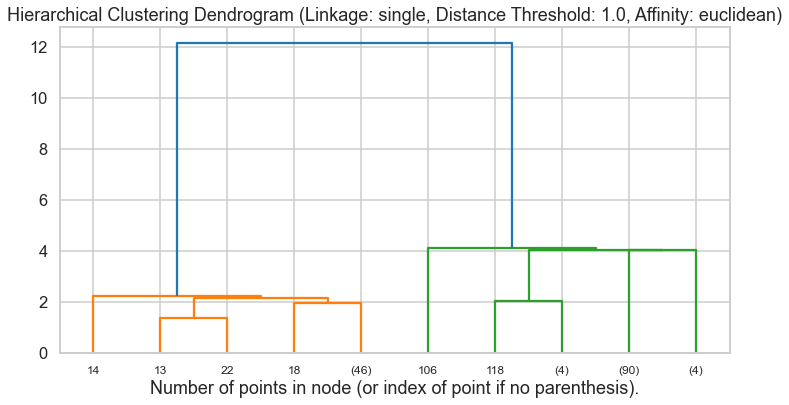

Silhouette Score: 0.25471911378986256


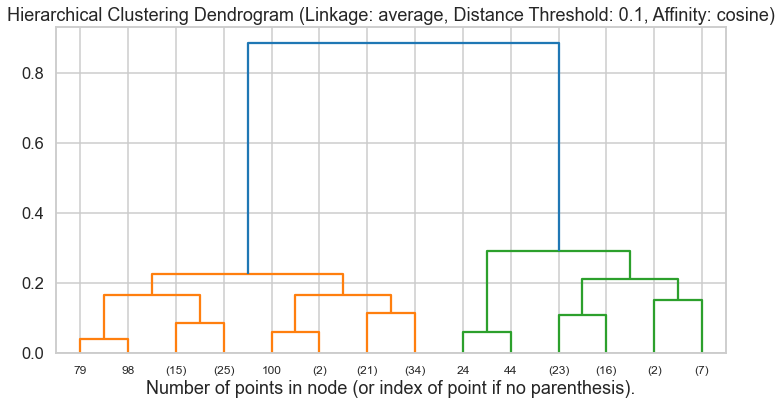

Silhouette Score: 0.5280073778702096


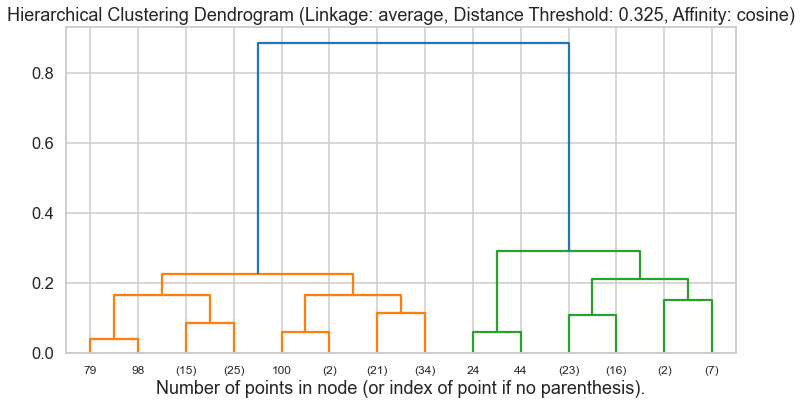

Silhouette Score: 0.8343311853591958


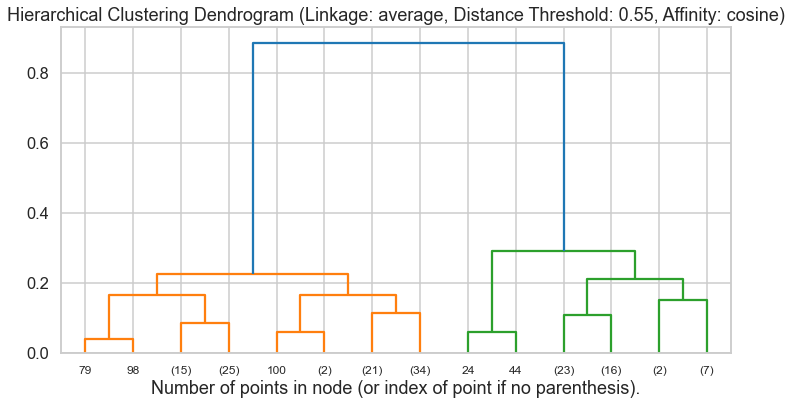

Silhouette Score: 0.8343311853591958


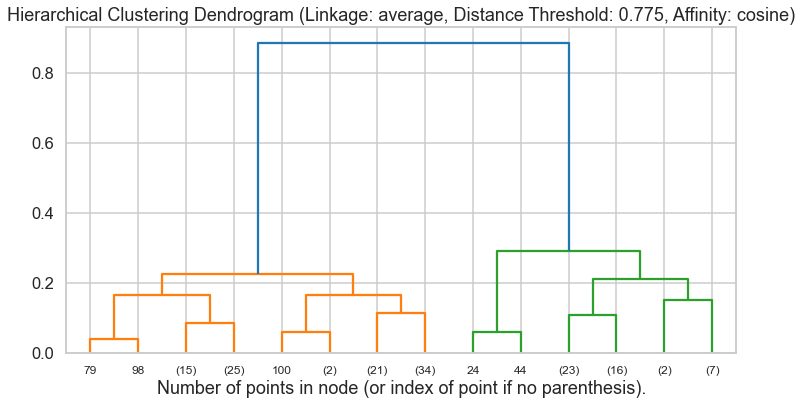

Silhouette Score: 0.8343311853591958


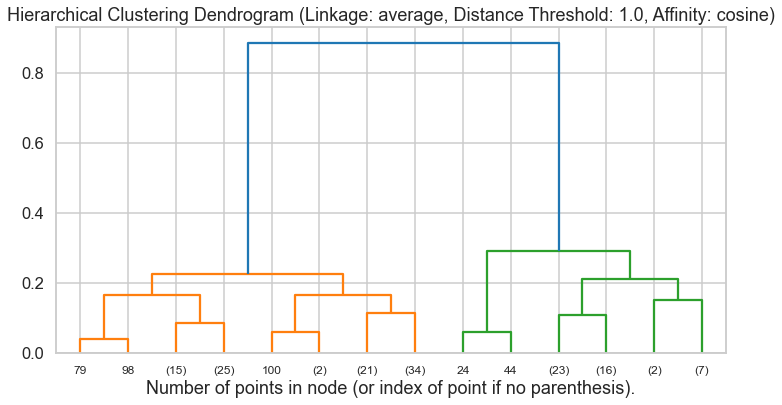

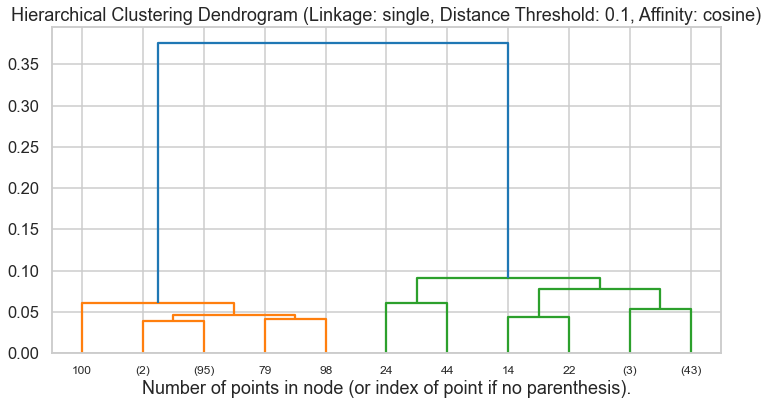

Silhouette Score: 0.8343311853591958


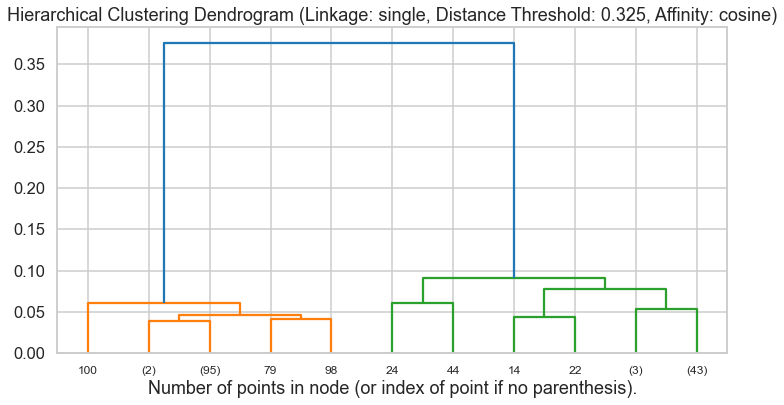

Silhouette Score: 0.8343311853591958


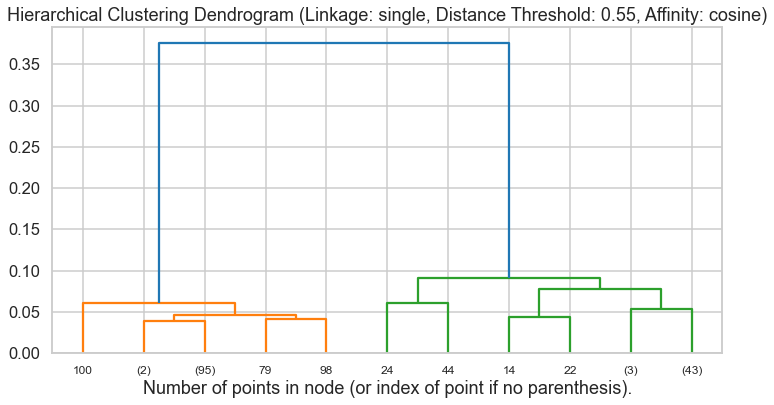

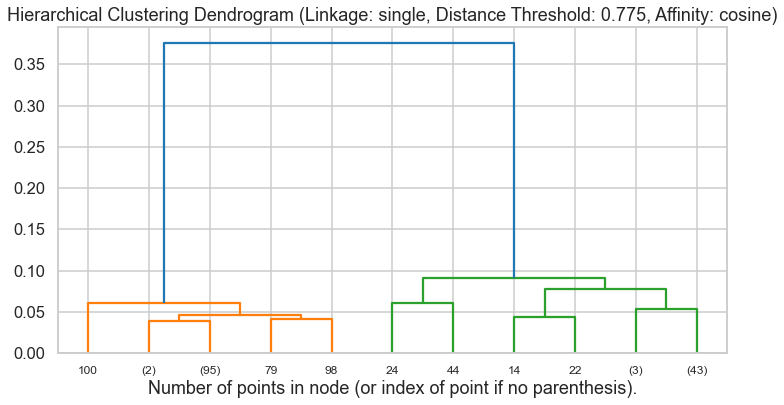

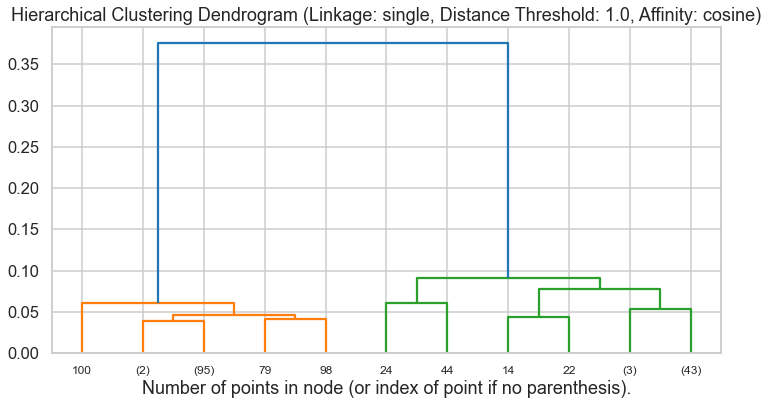

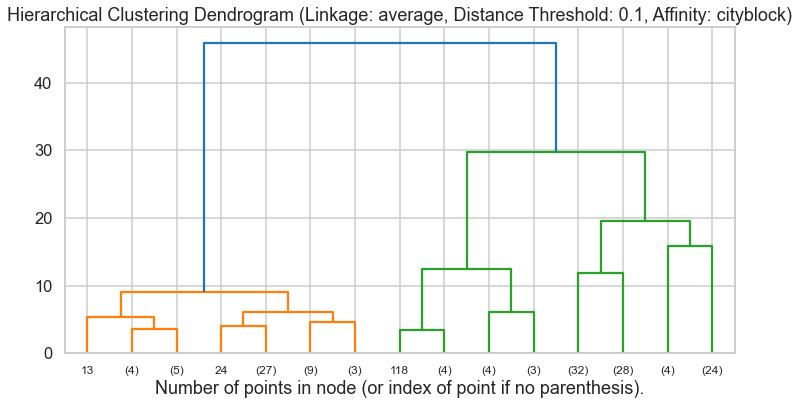

Silhouette Score: 0.3399999241425907


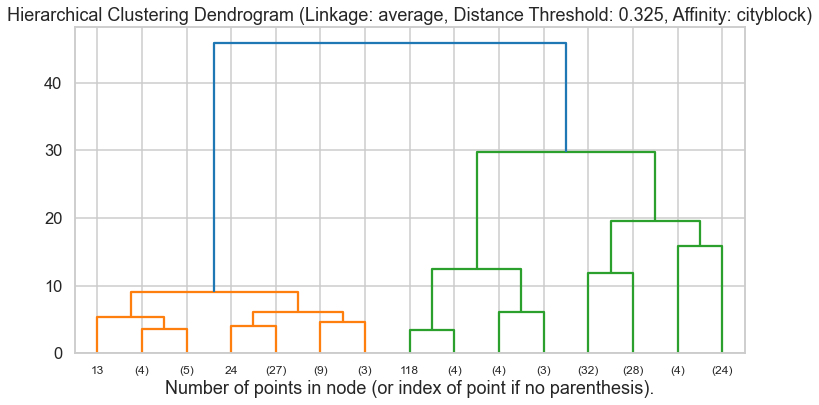

Silhouette Score: 0.3399999241425907


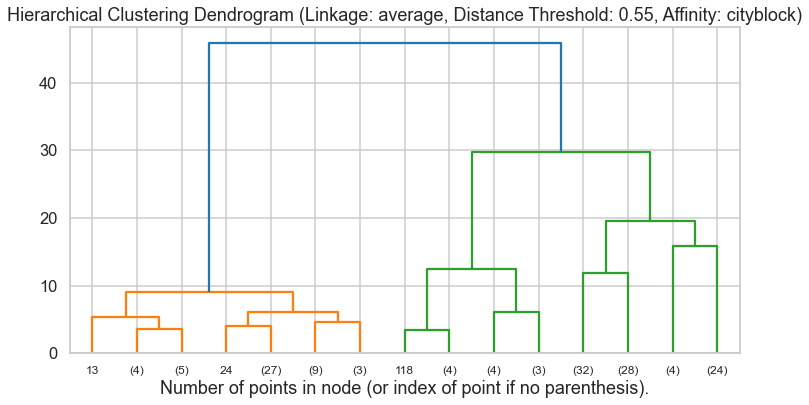

Silhouette Score: 0.35114127097851283


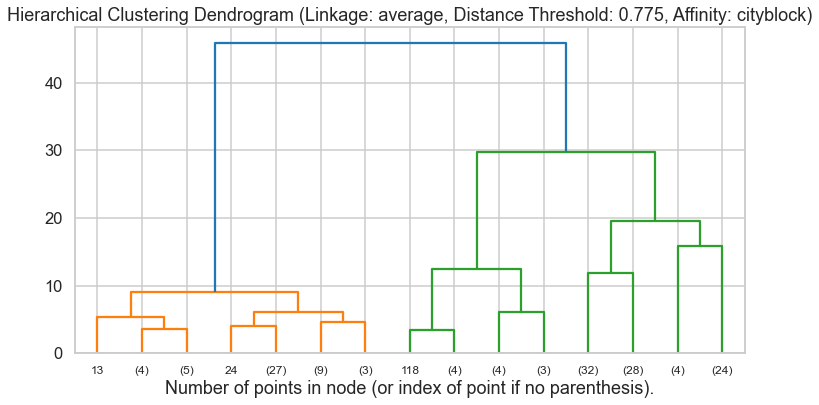

Silhouette Score: 0.3647062949283494


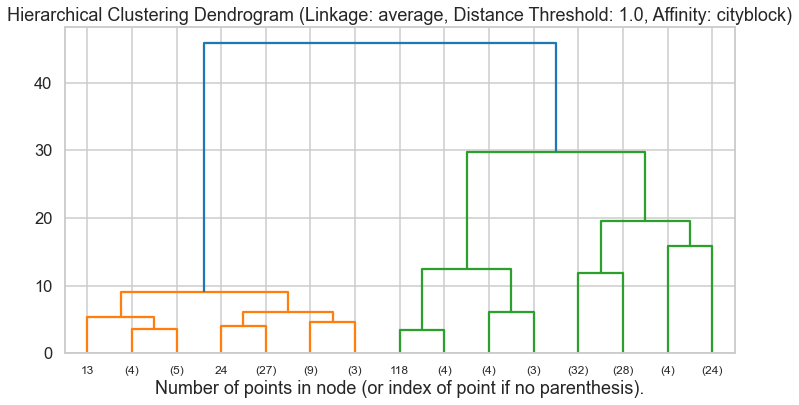

Silhouette Score: 0.3466657702571603


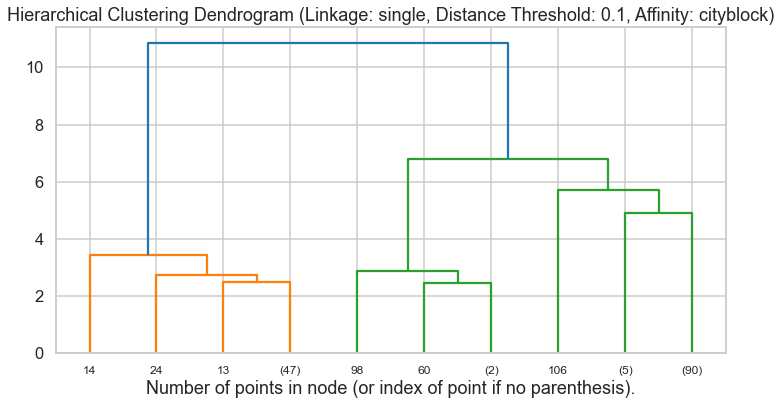

Silhouette Score: 0.3399999241425907


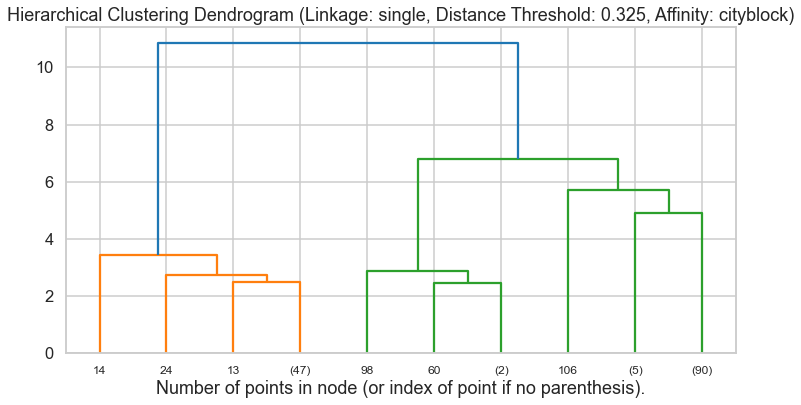

Silhouette Score: 0.3399999241425907


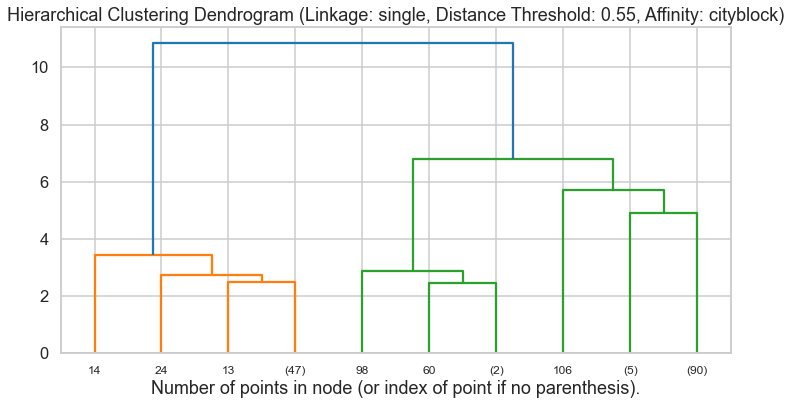

Silhouette Score: 0.35114127097851283


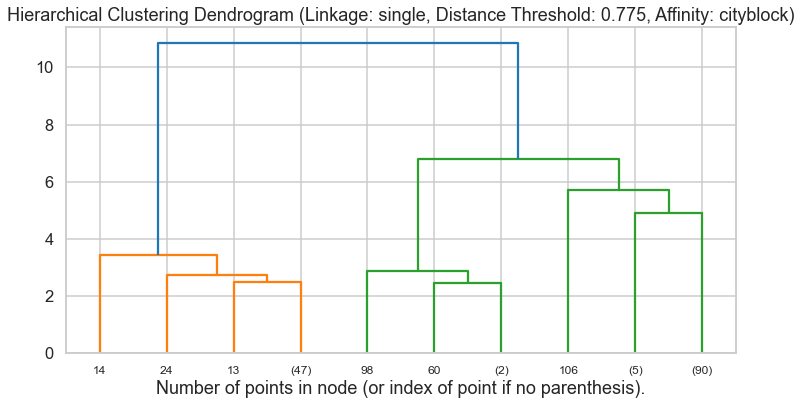

Silhouette Score: 0.3647062949283494


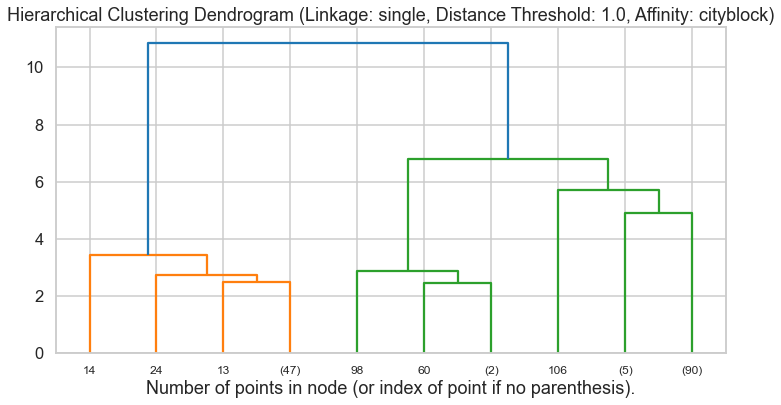

Silhouette Score: 0.35516521778055665

Pair of Features: ['sepal length (cm)', 'petal width (cm)']


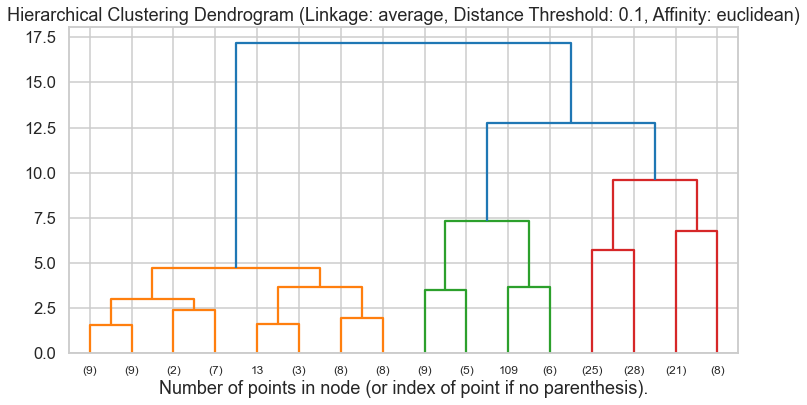

Silhouette Score: 0.45999986082359917


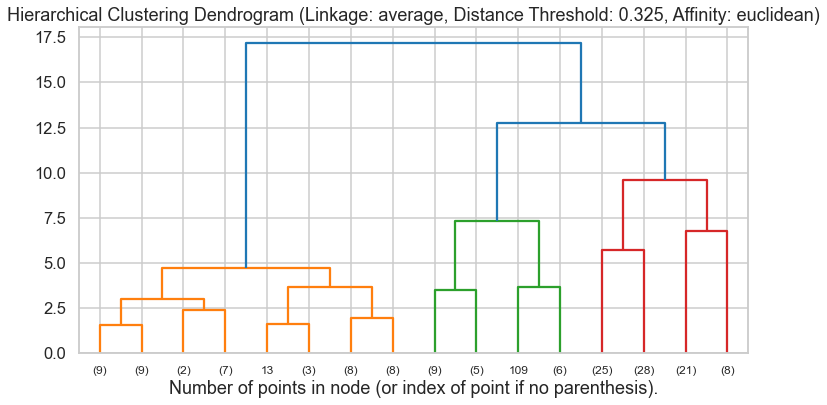

Silhouette Score: 0.45999986082359917


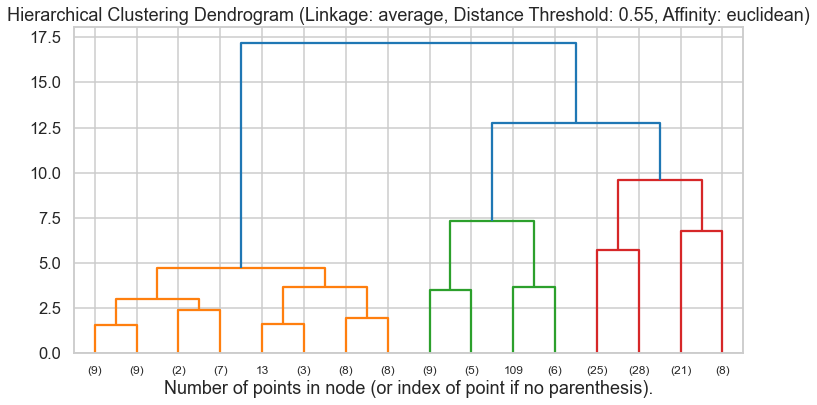

Silhouette Score: 0.45999986082359917


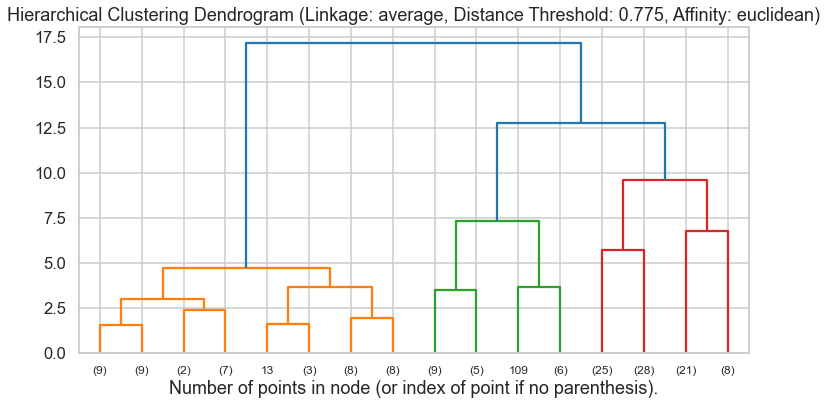

Silhouette Score: 0.44497369205429643


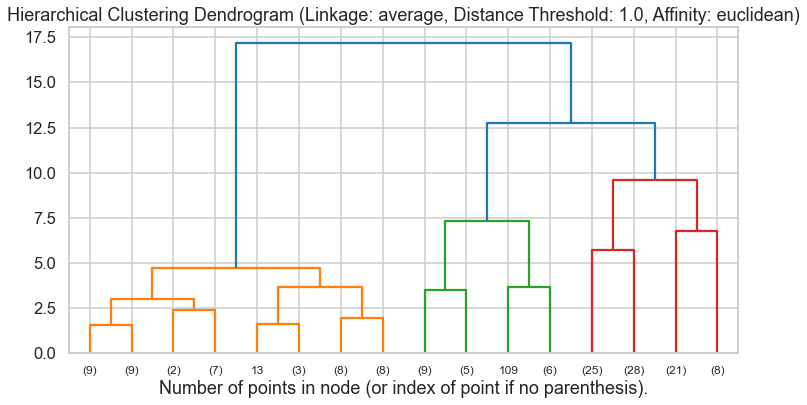

Silhouette Score: 0.4041153608562278


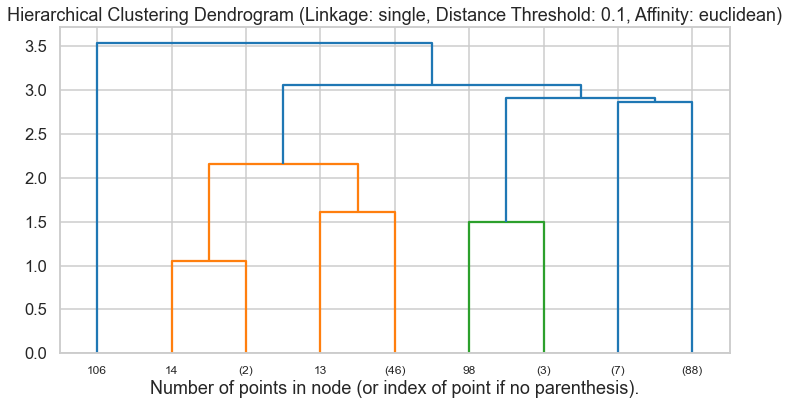

Silhouette Score: 0.45999986082359917


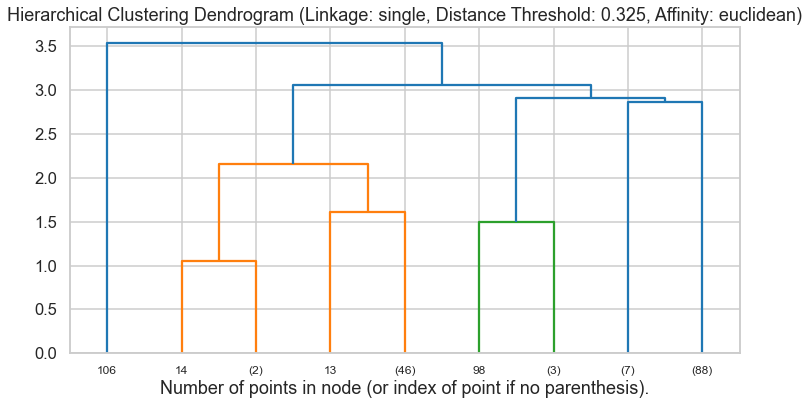

Silhouette Score: 0.45999986082359917


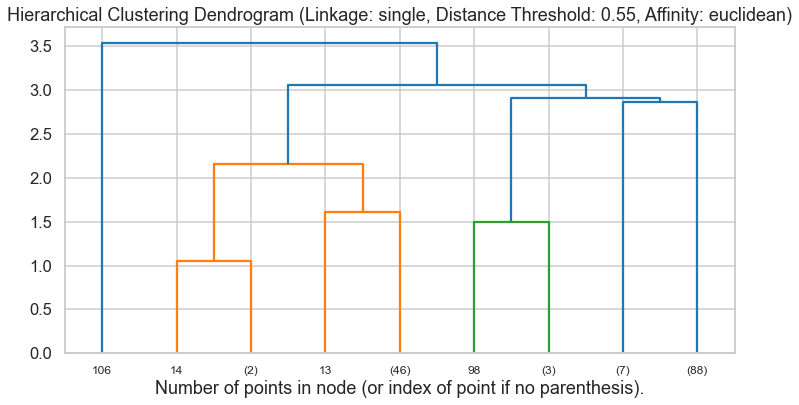

Silhouette Score: 0.45999986082359917


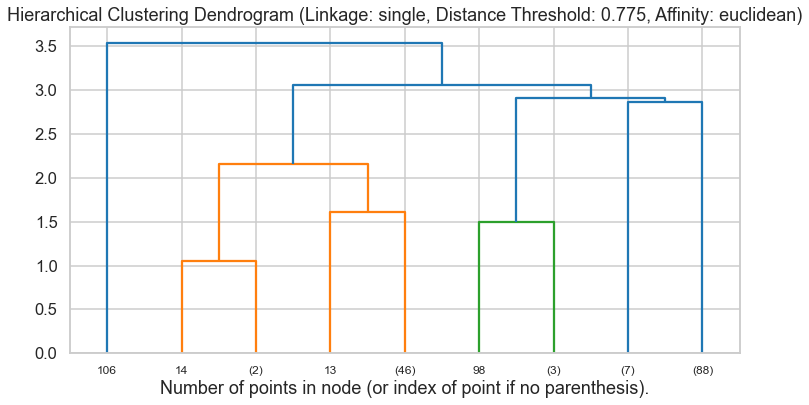

Silhouette Score: 0.4360589536103779


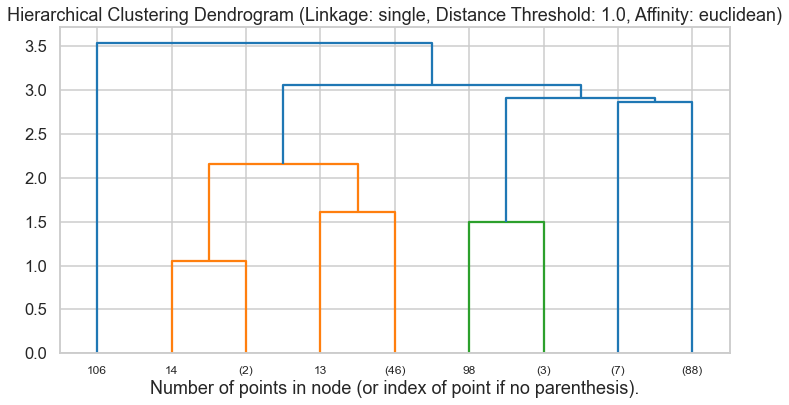

Silhouette Score: 0.20233325391744092


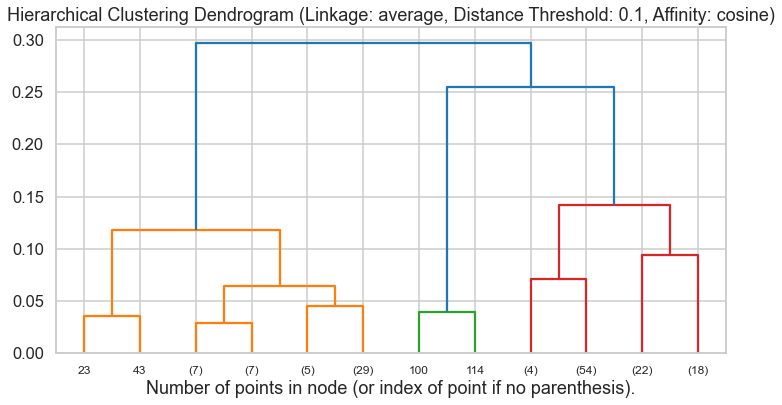

Silhouette Score: 0.5752807067120884


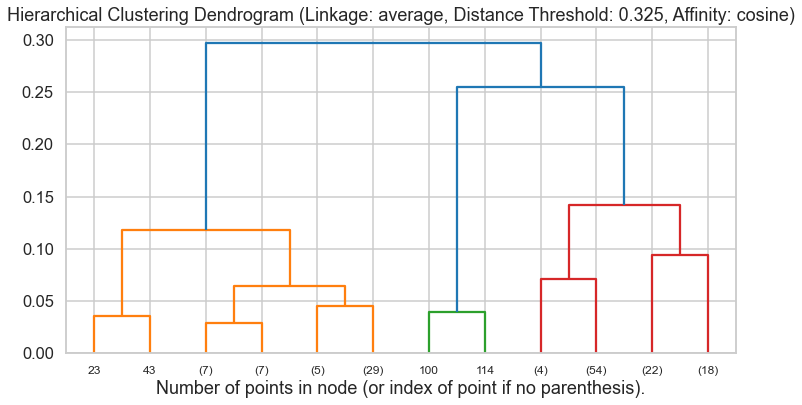

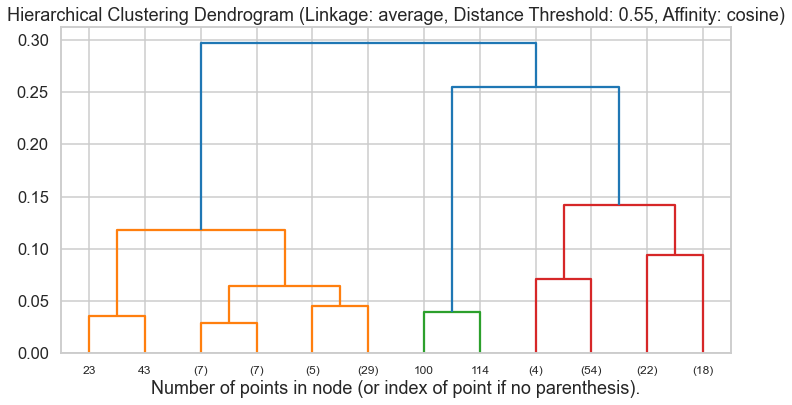

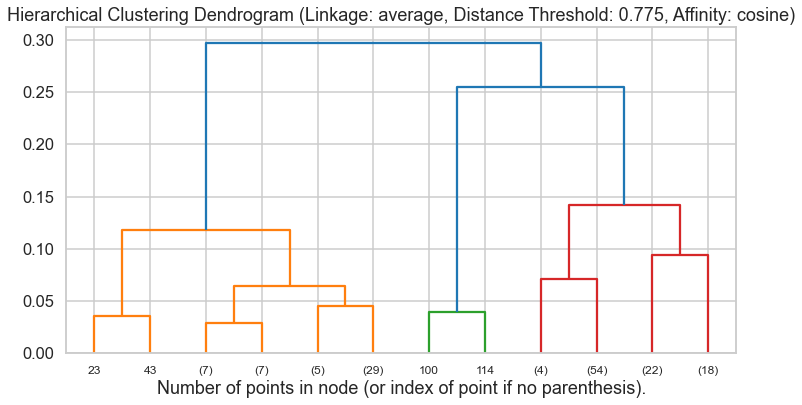

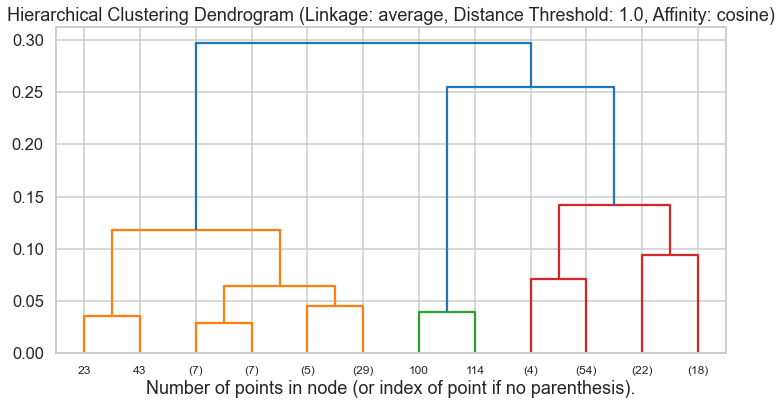

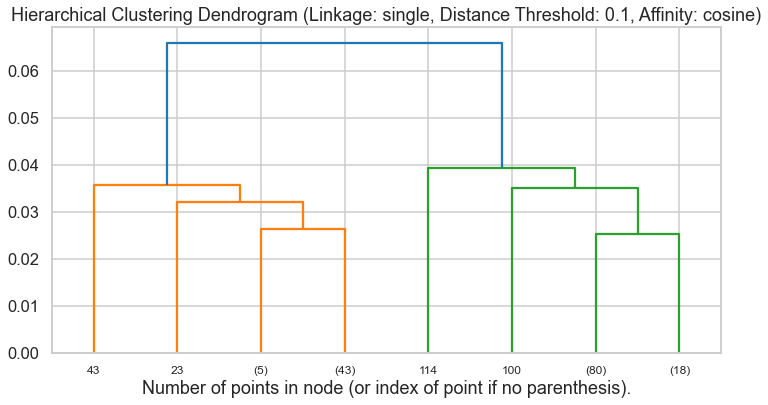

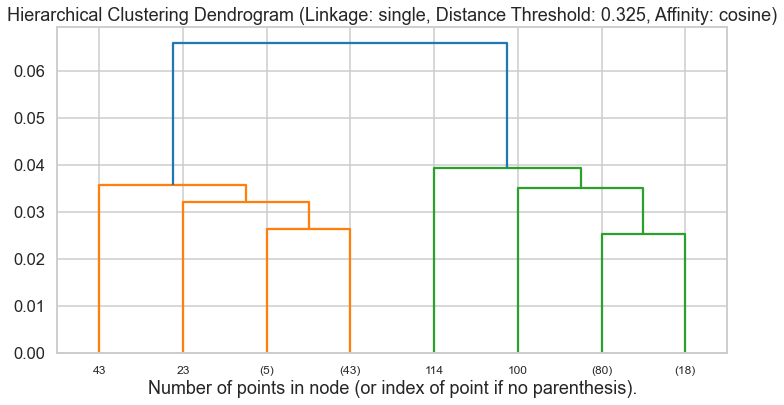

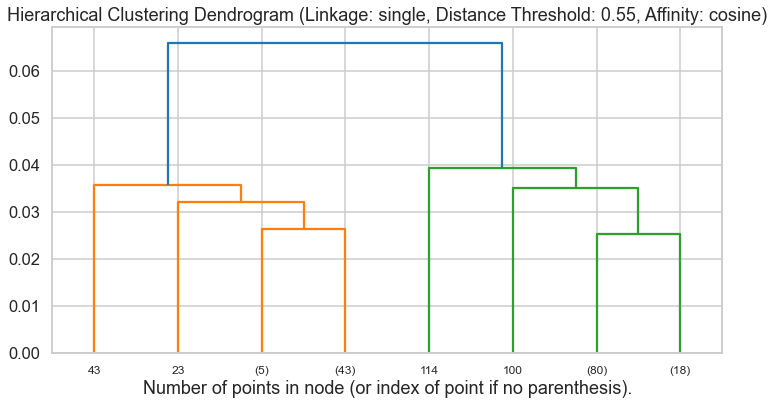

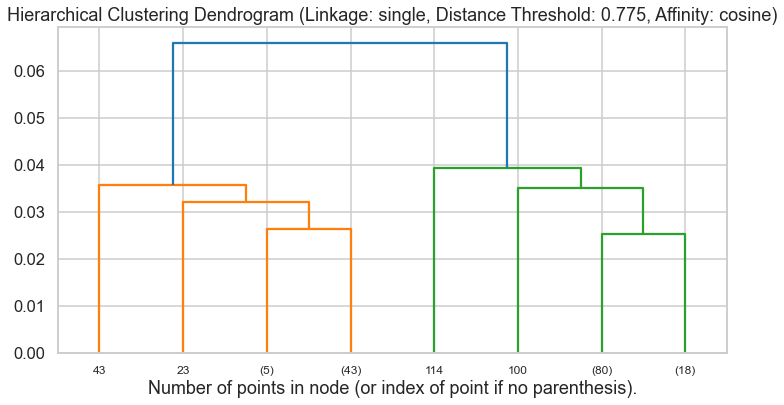

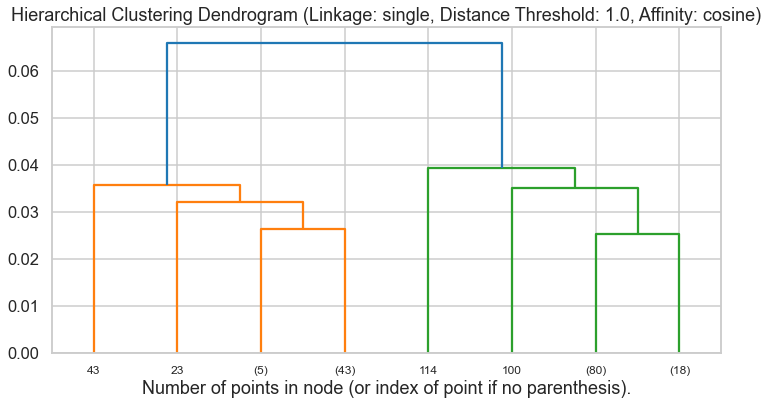

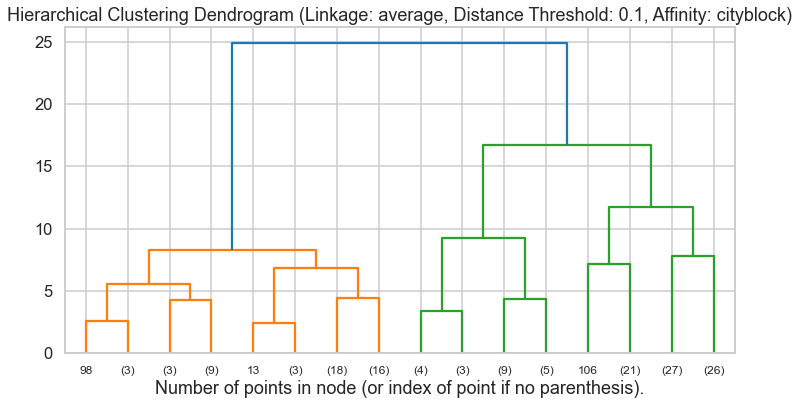

Silhouette Score: 0.4599999271620757


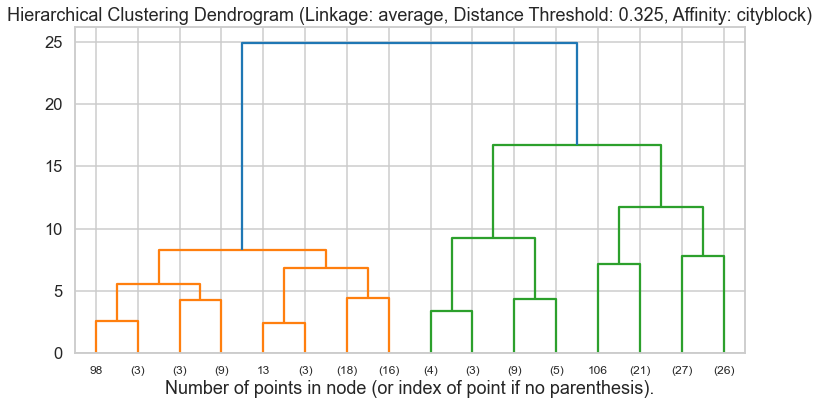

Silhouette Score: 0.4599999271620757


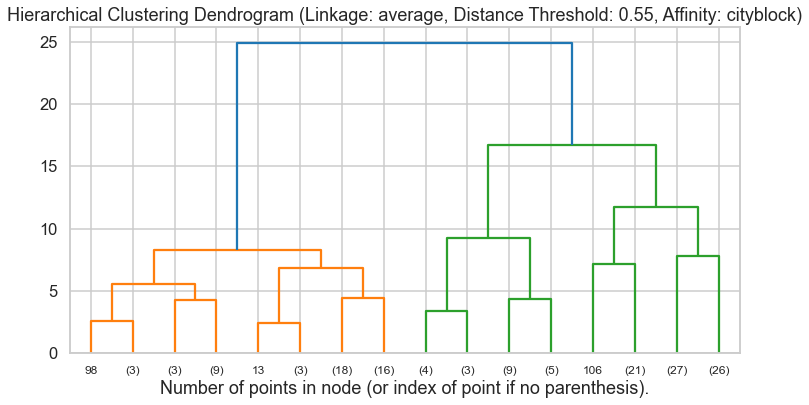

Silhouette Score: 0.4599999271620757


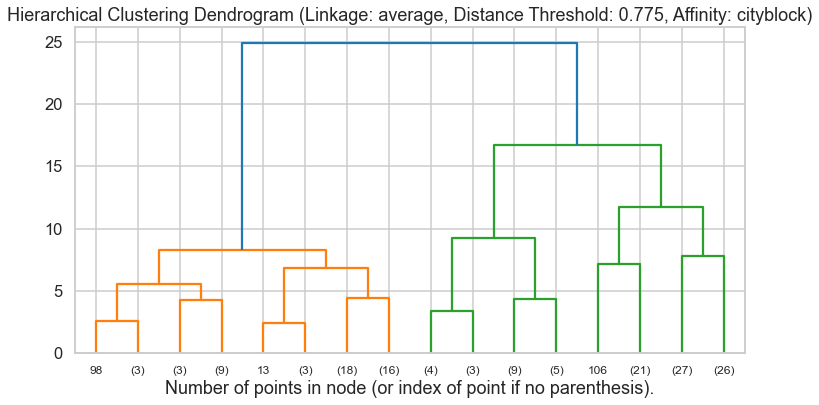

Silhouette Score: 0.4619944054352353


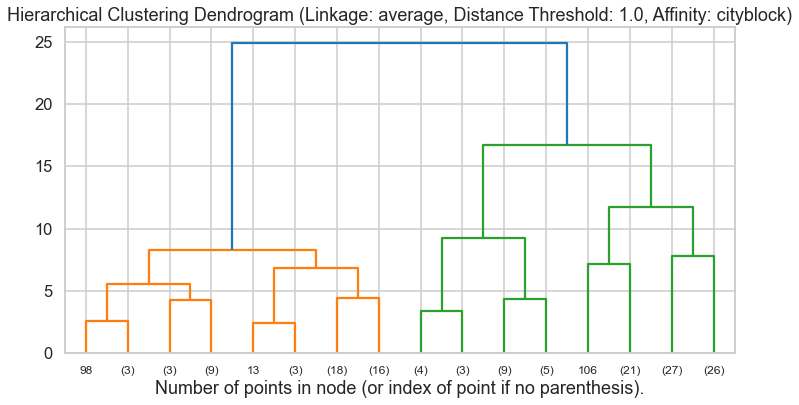

Silhouette Score: 0.4317420667028058


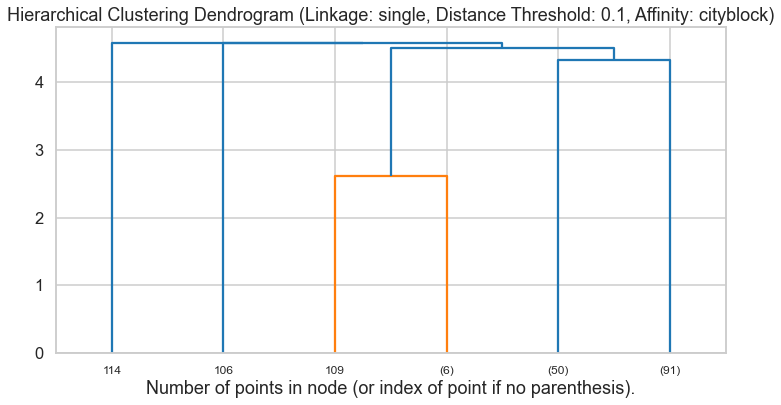

Silhouette Score: 0.4599999271620757


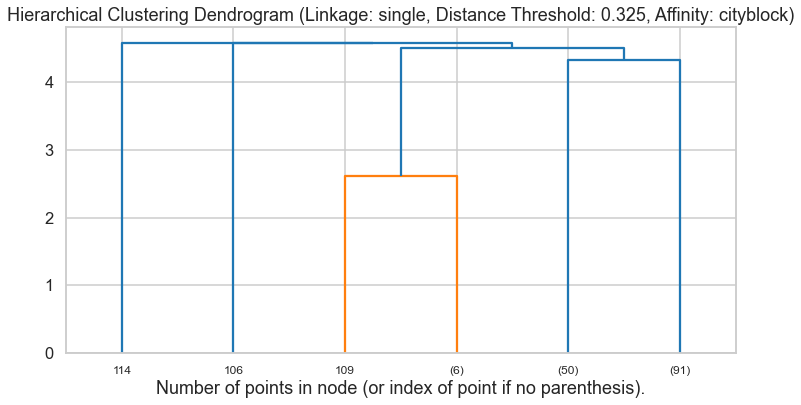

Silhouette Score: 0.4599999271620757


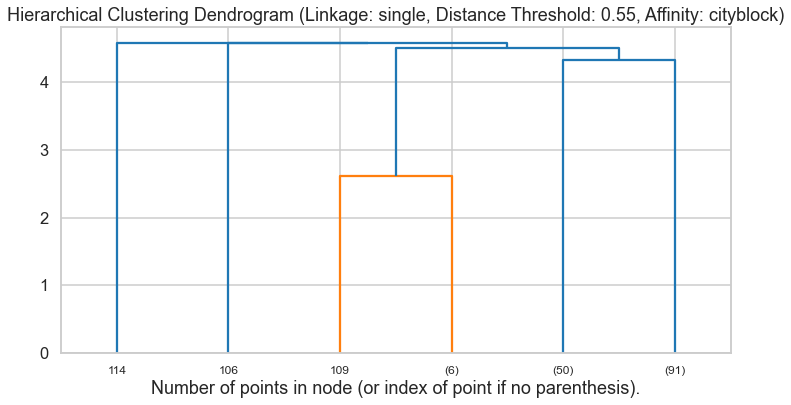

Silhouette Score: 0.4599999271620757


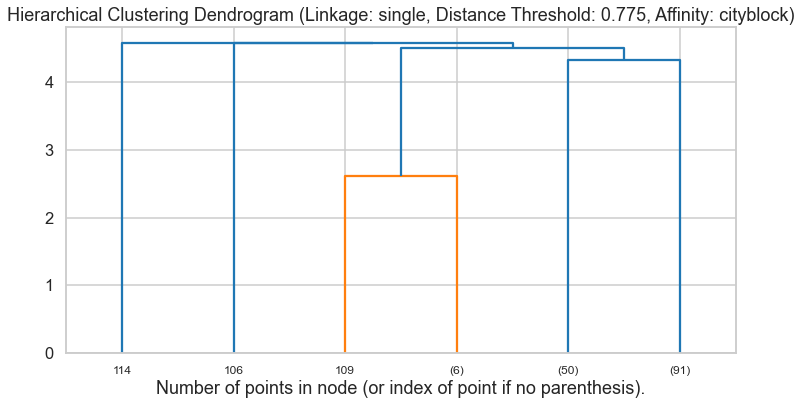

Silhouette Score: 0.4619944054352353


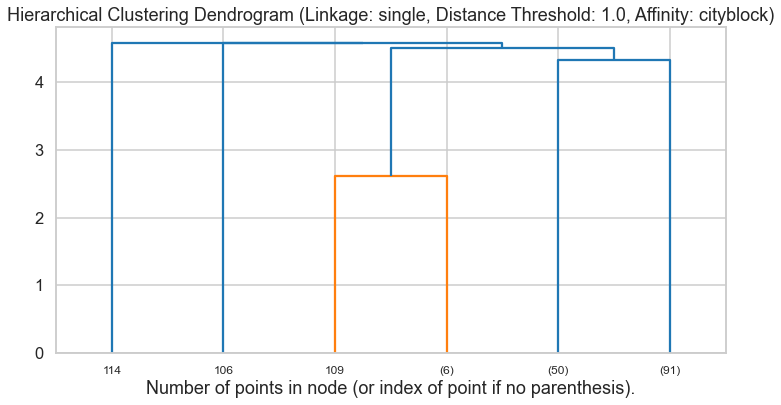

Silhouette Score: 0.430841192635144

Pair of Features: ['sepal width (cm)', 'petal length (cm)']


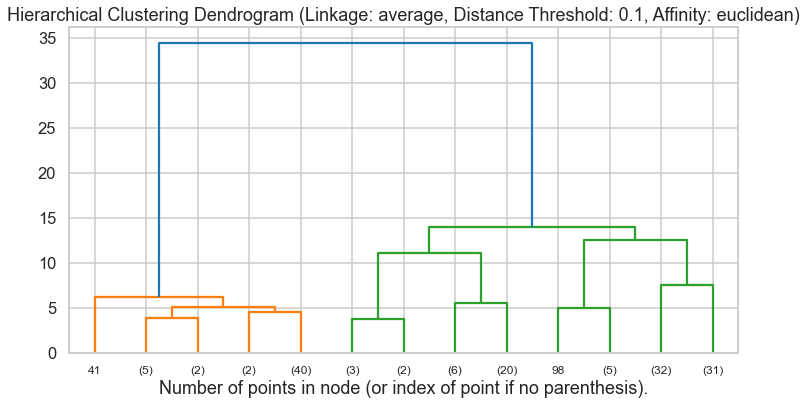

Silhouette Score: 0.3399998101034168


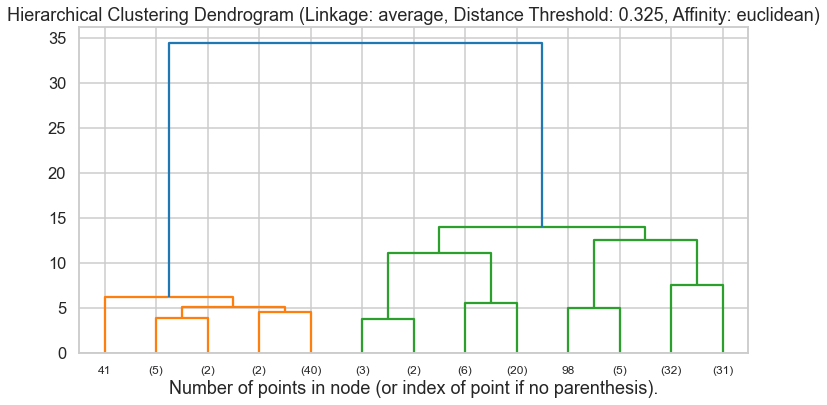

Silhouette Score: 0.3399998101034168


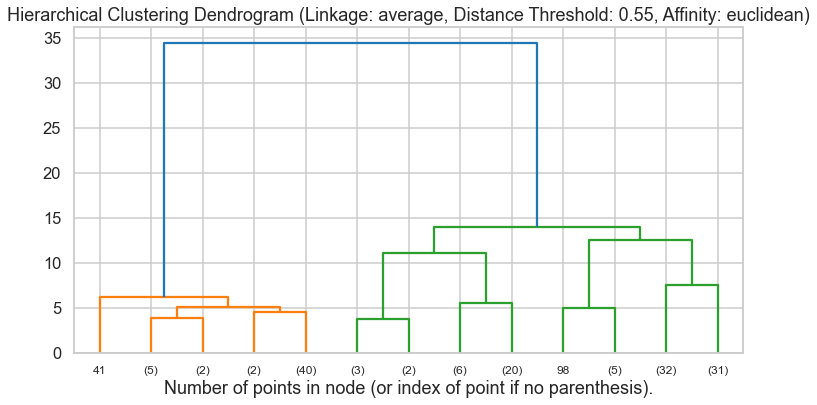

Silhouette Score: 0.3985478200109141


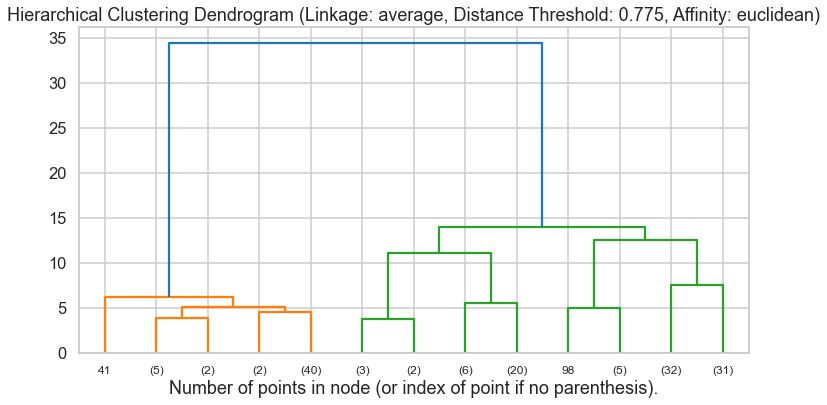

Silhouette Score: 0.4210387466404158


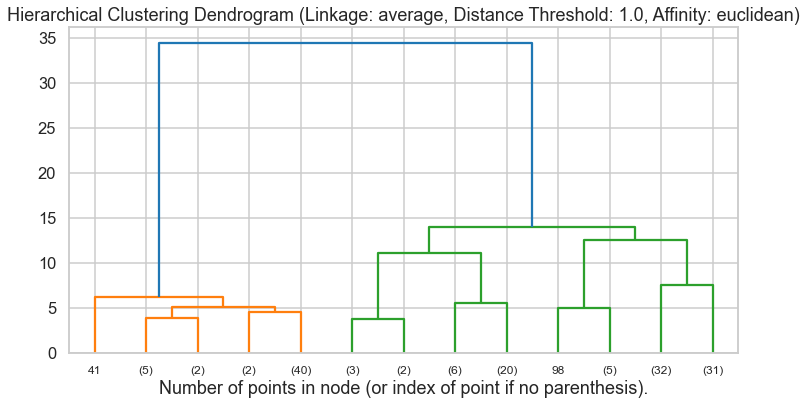

Silhouette Score: 0.4300554492053535


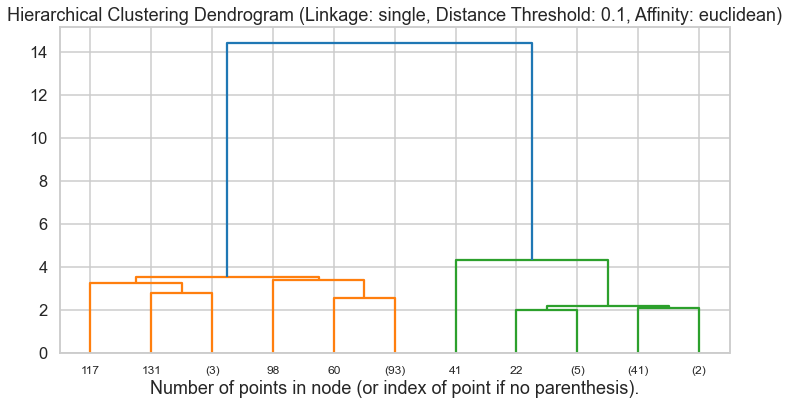

Silhouette Score: 0.3399998101034168


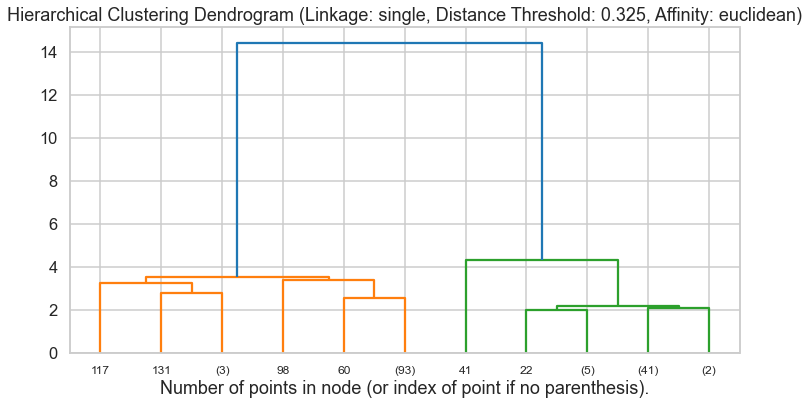

Silhouette Score: 0.3399998101034168


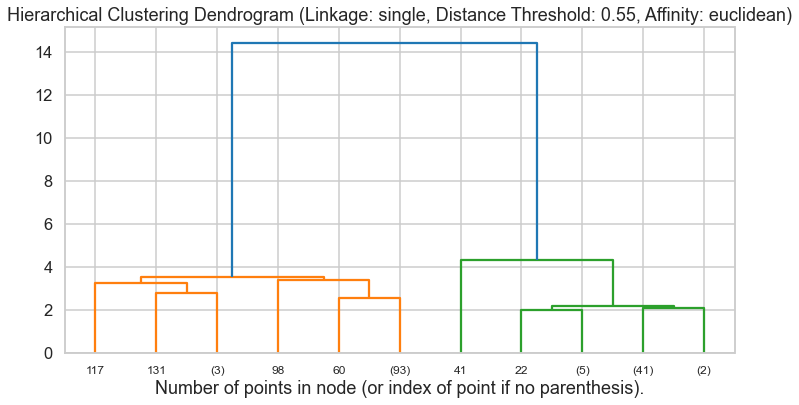

Silhouette Score: 0.4073668102582706


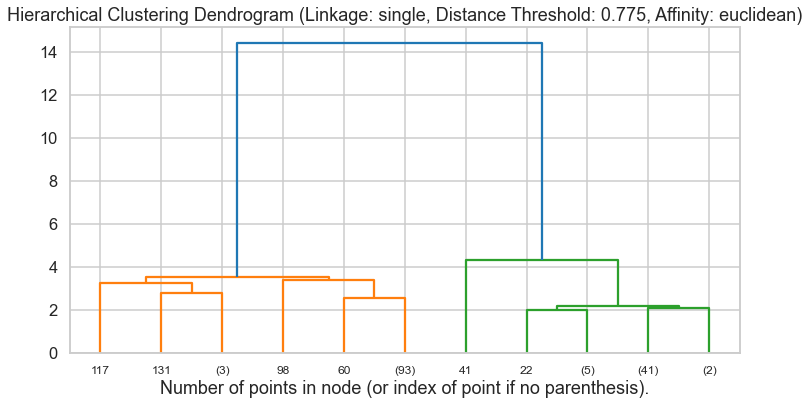

Silhouette Score: 0.4106547143078036


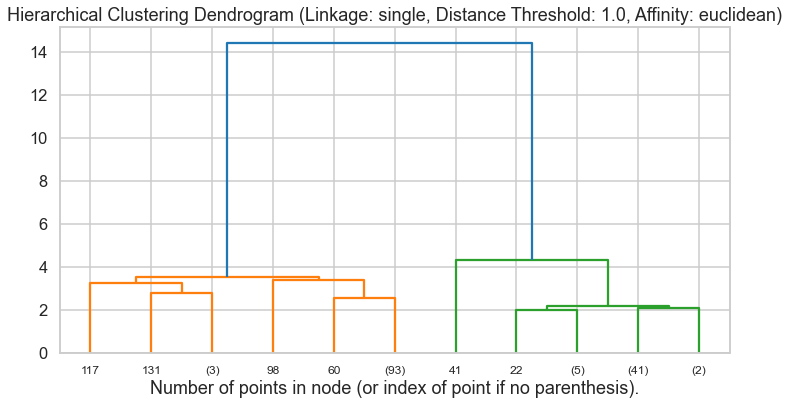

Silhouette Score: 0.4076482242310179


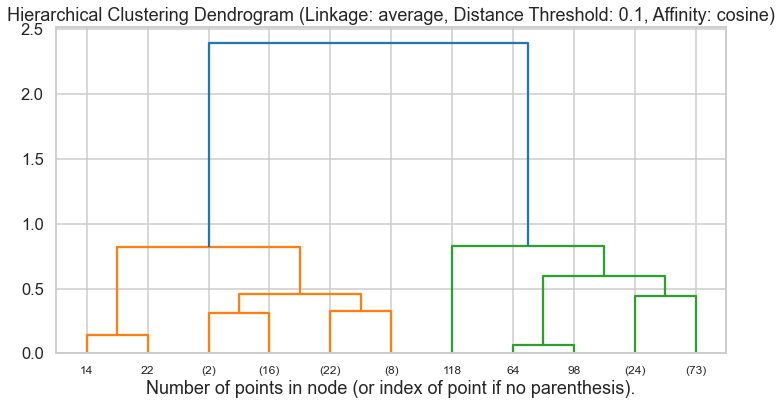

Silhouette Score: 0.5317639492926846


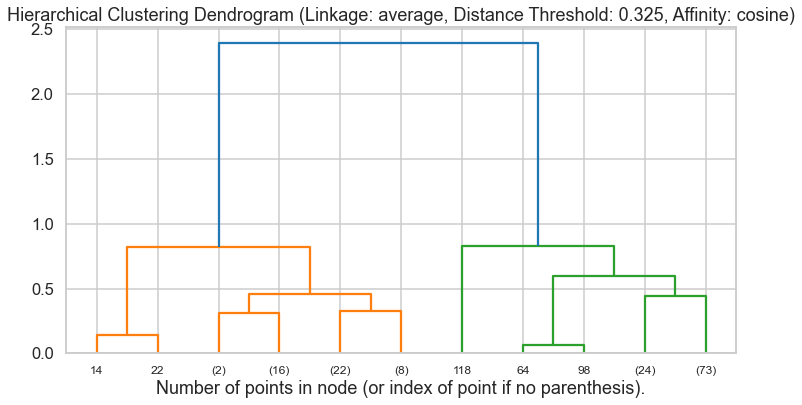

Silhouette Score: 0.43683186714671396


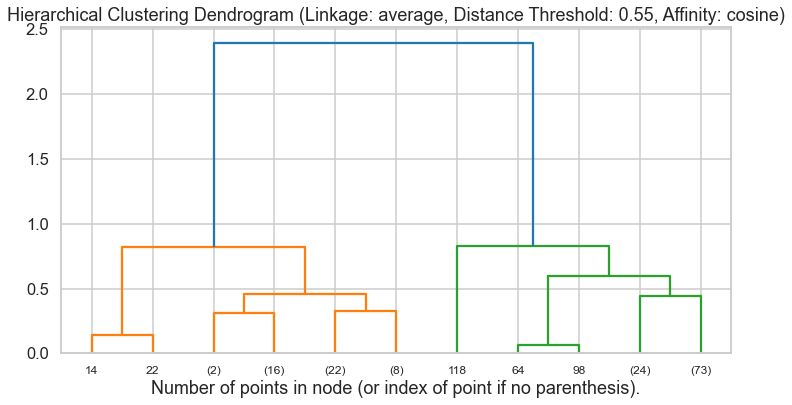

Silhouette Score: 0.4203037333184039


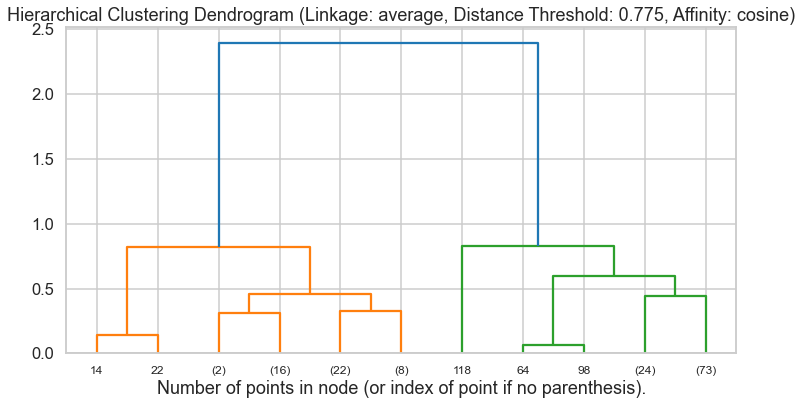

Silhouette Score: 0.5756500063482237


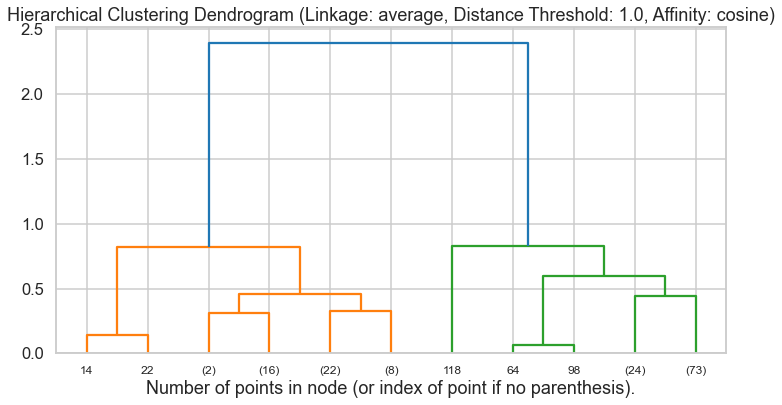

Silhouette Score: 0.8651231469518453


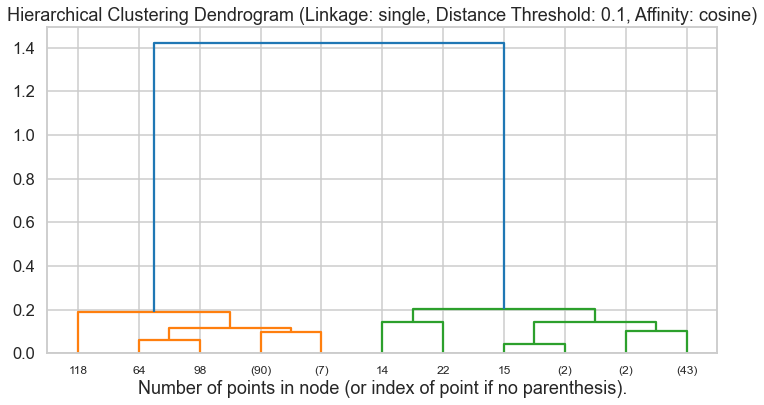

Silhouette Score: 0.32472661901943


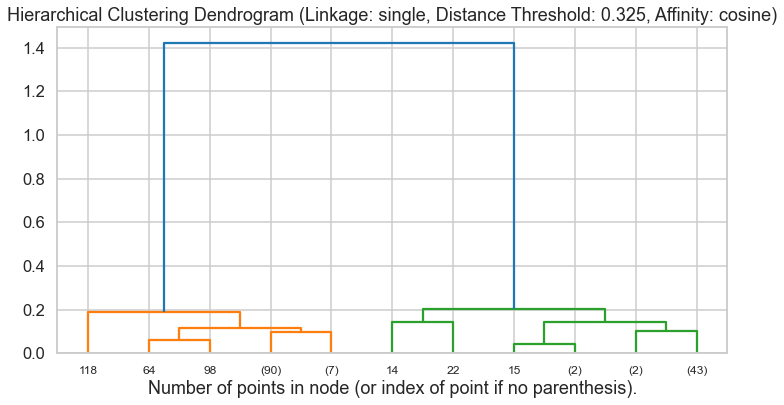

Silhouette Score: 0.8651231469518453


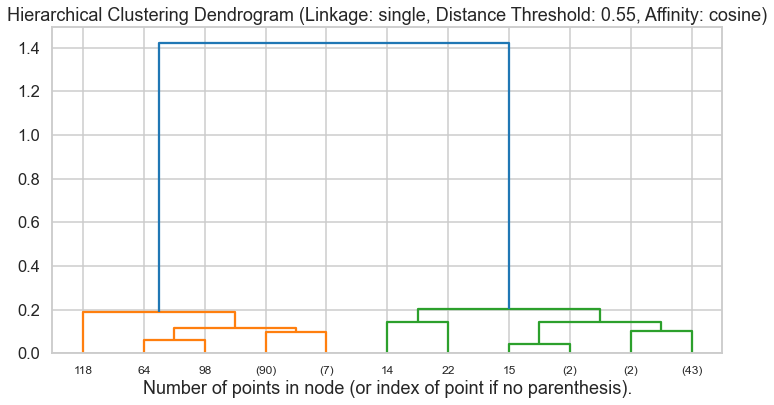

Silhouette Score: 0.8651231469518453


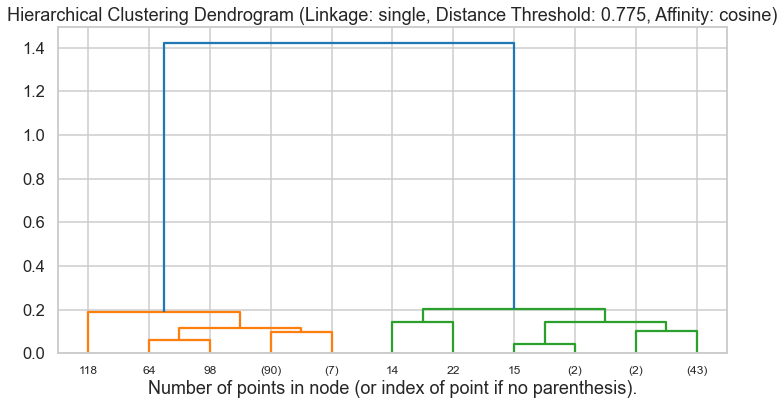

Silhouette Score: 0.8651231469518453


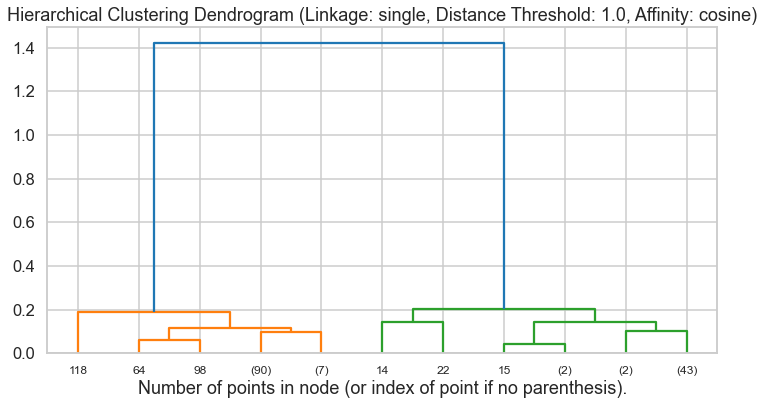

Silhouette Score: 0.8651231469518453


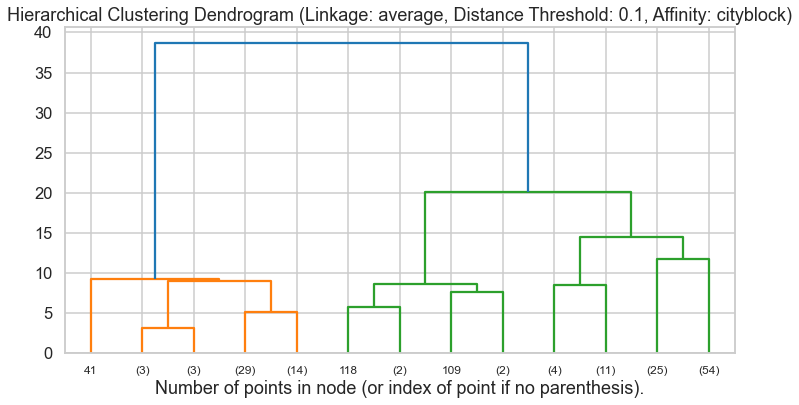

Silhouette Score: 0.3399998888207215


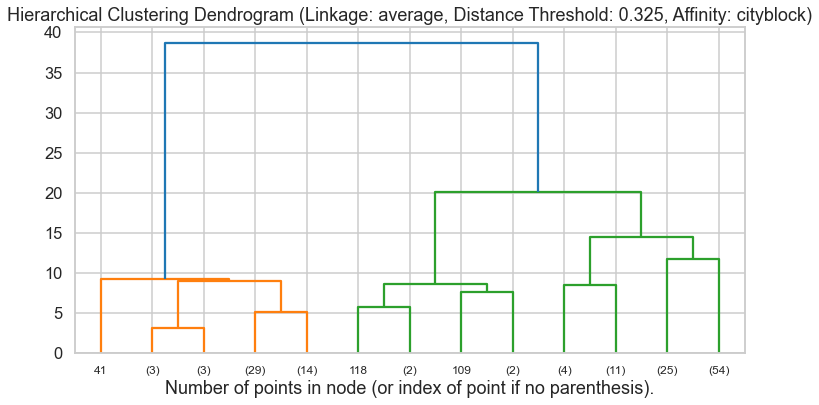

Silhouette Score: 0.3399998888207215


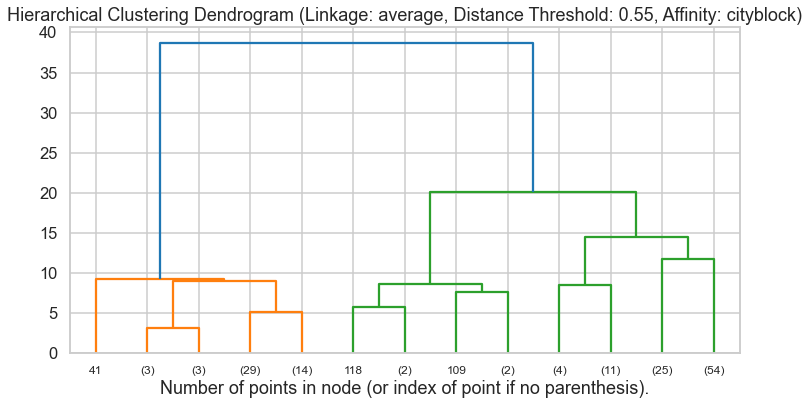

Silhouette Score: 0.3399998888207215


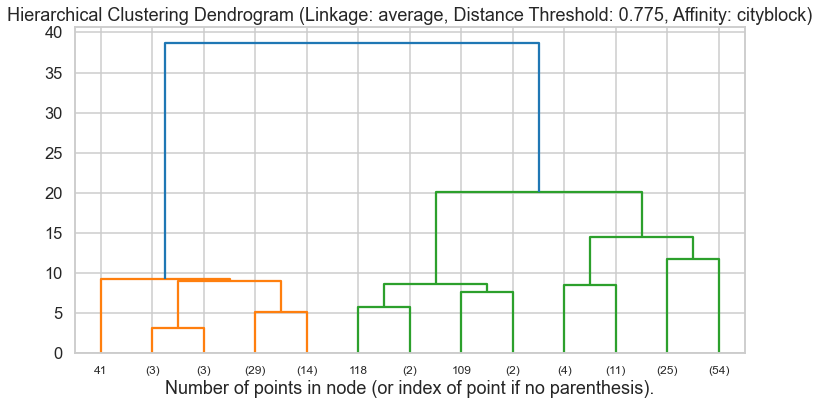

Silhouette Score: 0.3399998888207215


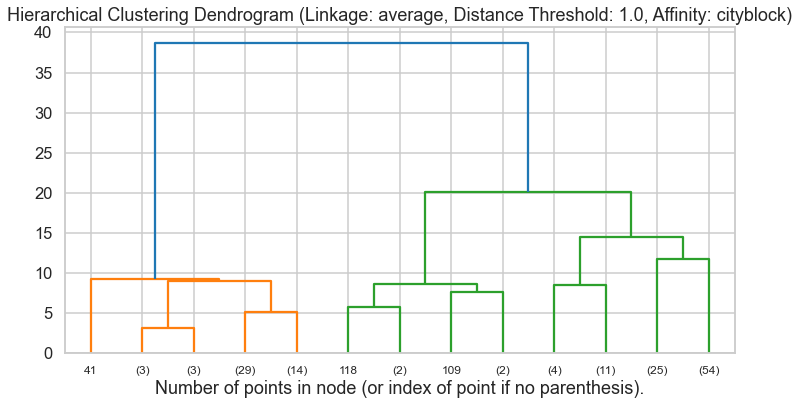

Silhouette Score: 0.32530831517702624


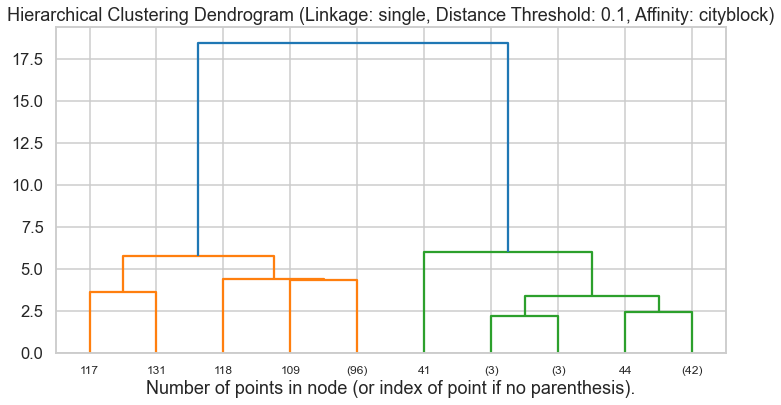

Silhouette Score: 0.3399998888207215


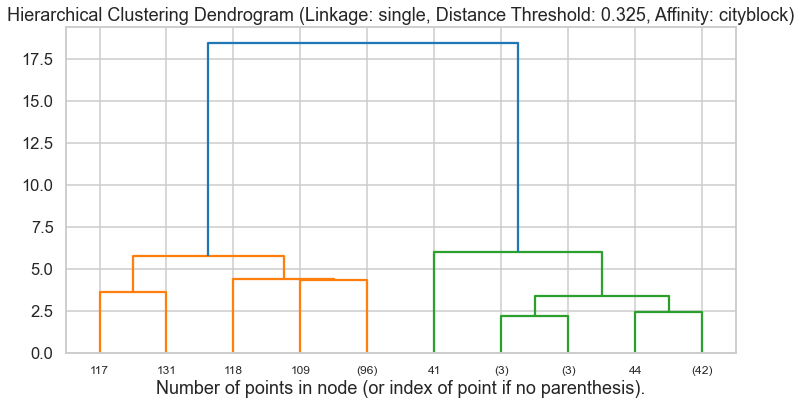

Silhouette Score: 0.3399998888207215


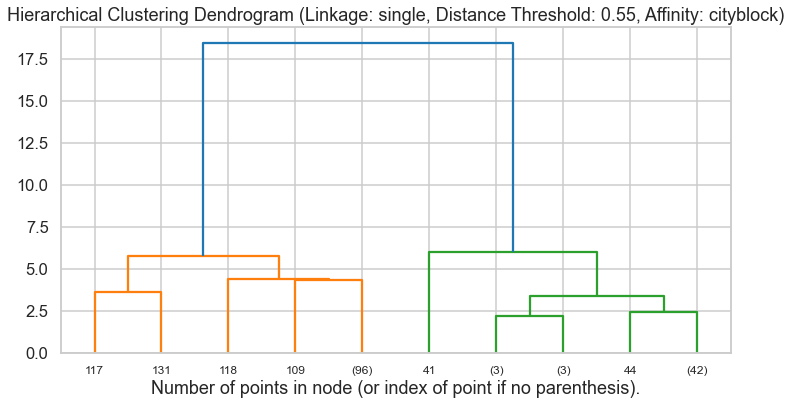

Silhouette Score: 0.3399998888207215


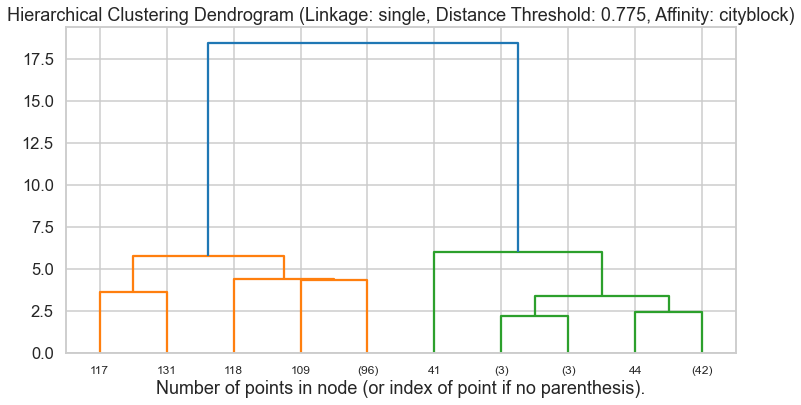

Silhouette Score: 0.3399998888207215


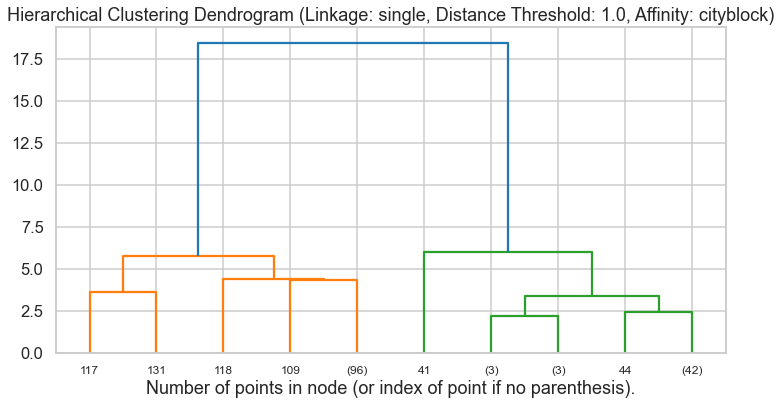

Silhouette Score: 0.32530831517702624

Pair of Features: ['sepal width (cm)', 'petal width (cm)']


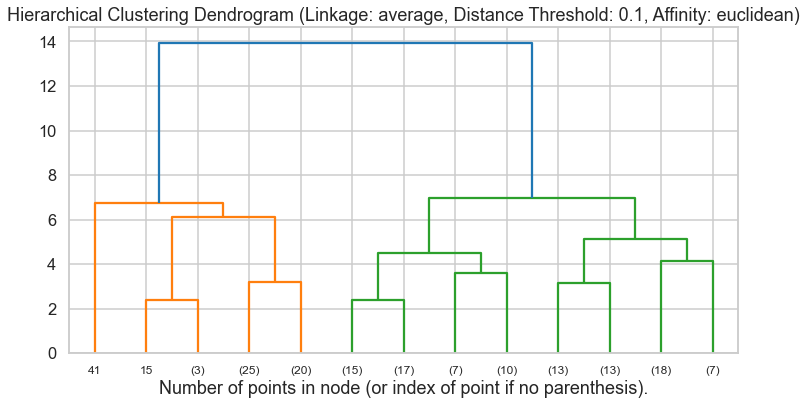

Silhouette Score: 0.5599998617199398


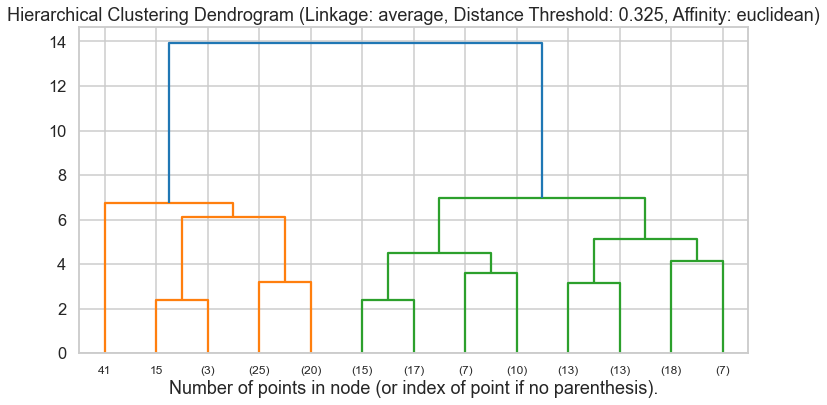

Silhouette Score: 0.5599998617199398


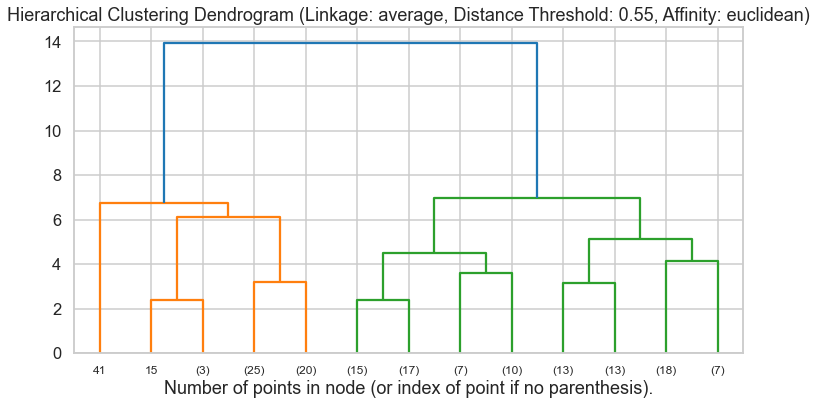

Silhouette Score: 0.5599998617199398


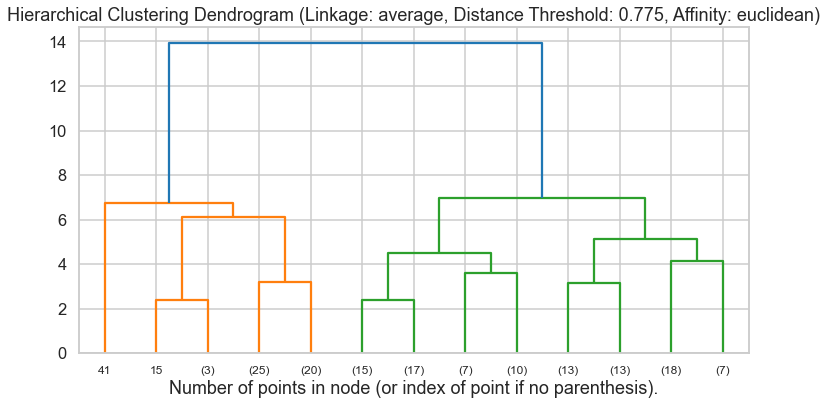

Silhouette Score: 0.5147148724472022


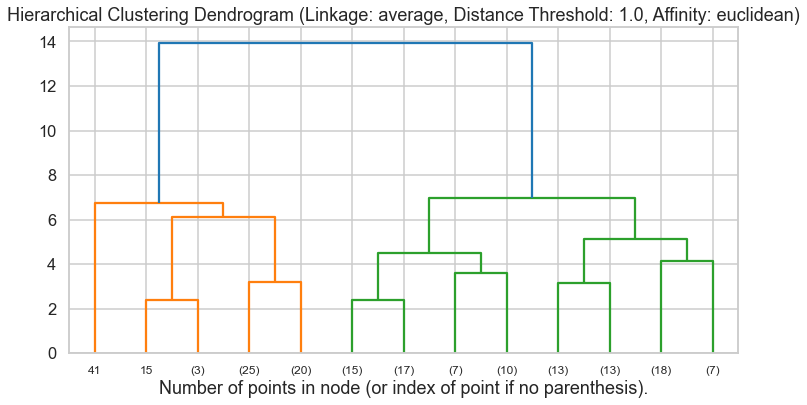

Silhouette Score: 0.48652690324016723


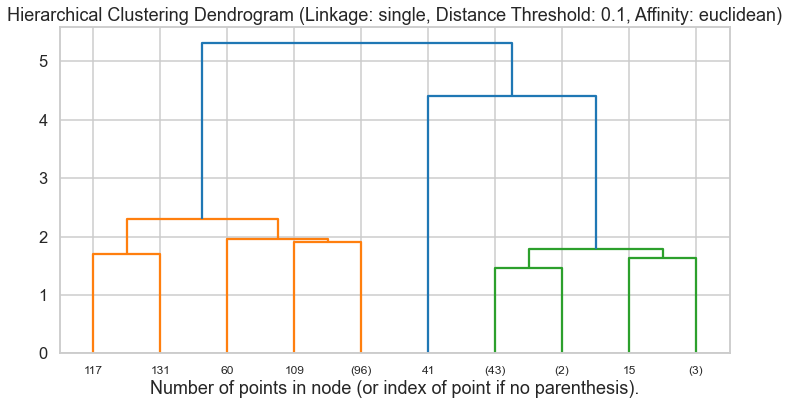

Silhouette Score: 0.5599998617199398


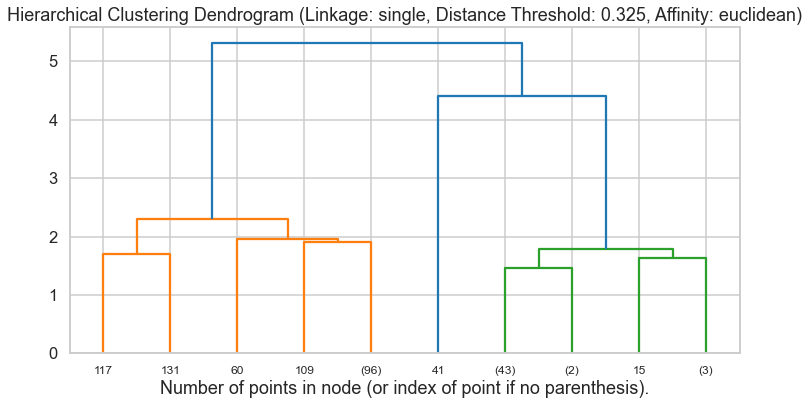

Silhouette Score: 0.5599998617199398


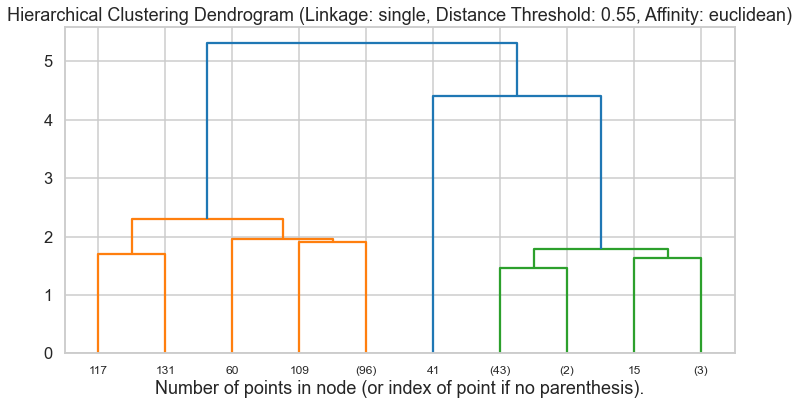

Silhouette Score: 0.5599998617199398


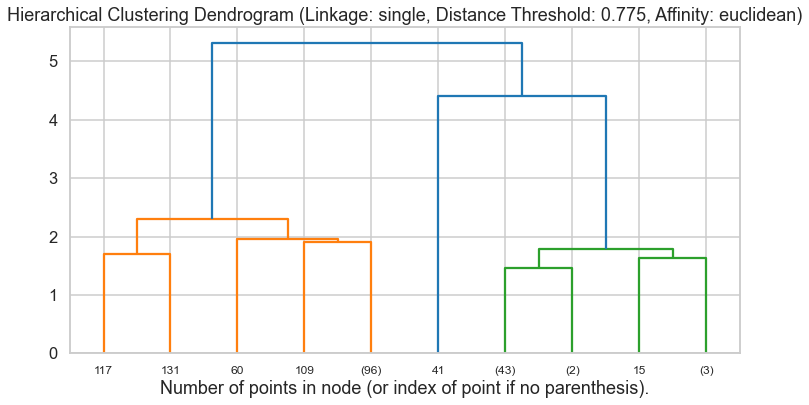

Silhouette Score: 0.29178398300059777


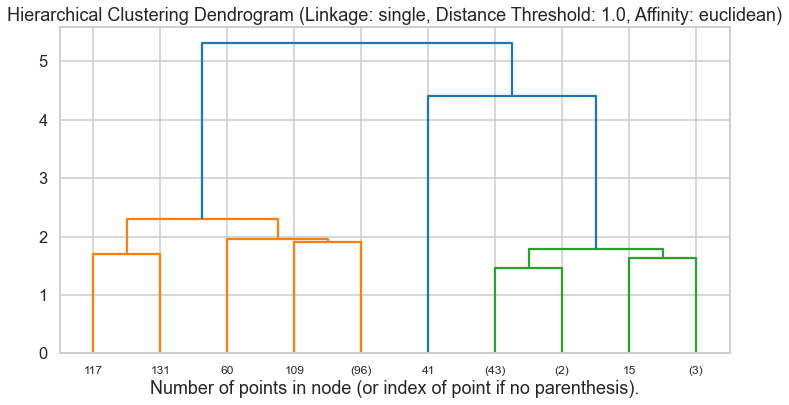

Silhouette Score: 0.07844423786665664


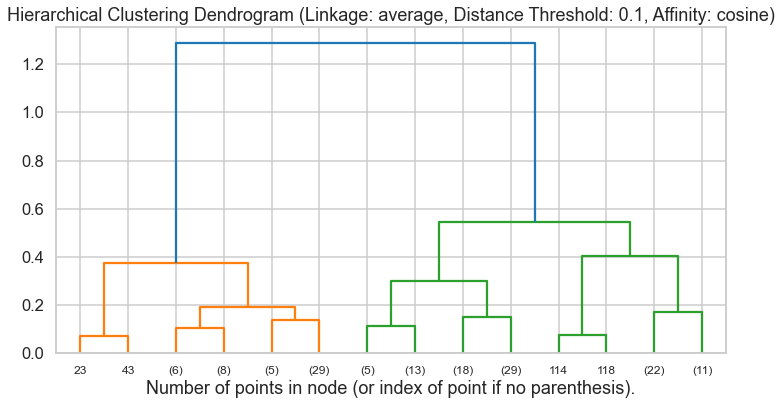

Silhouette Score: 0.6155051852480473


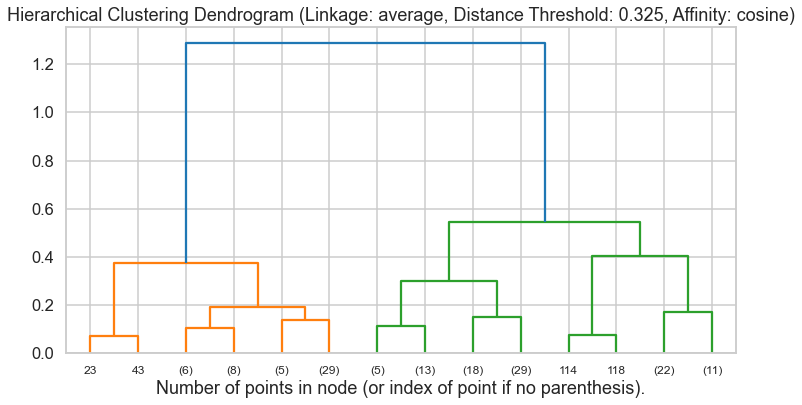

Silhouette Score: 0.6257189781916901


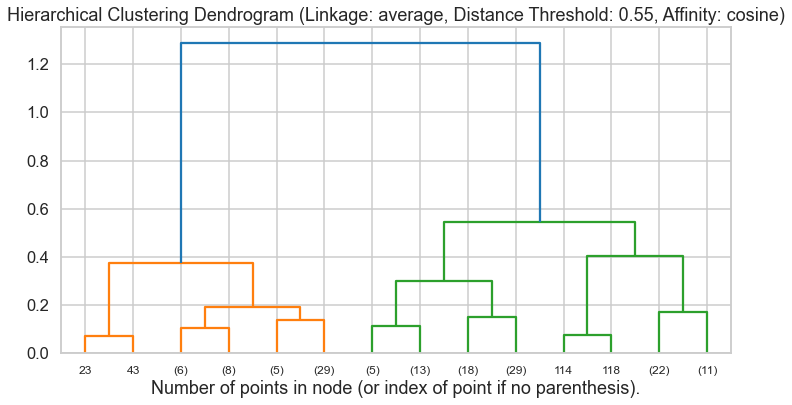

Silhouette Score: 0.7844507587290159


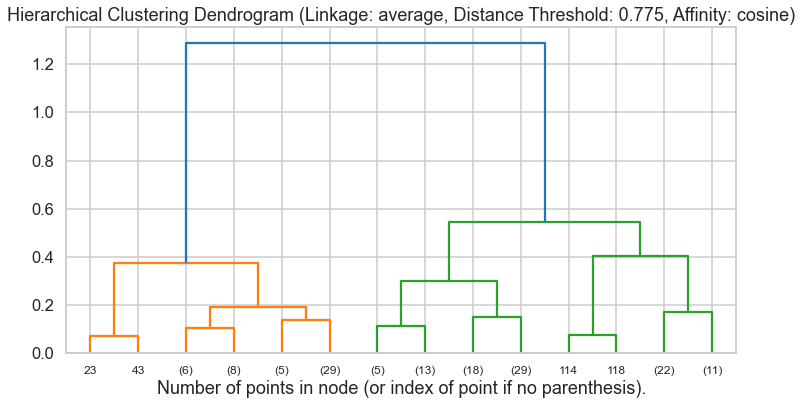

Silhouette Score: 0.7844507587290159


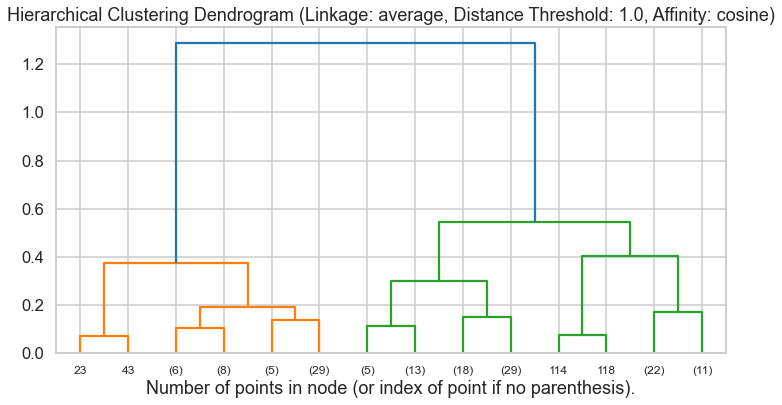

Silhouette Score: 0.7844507587290159


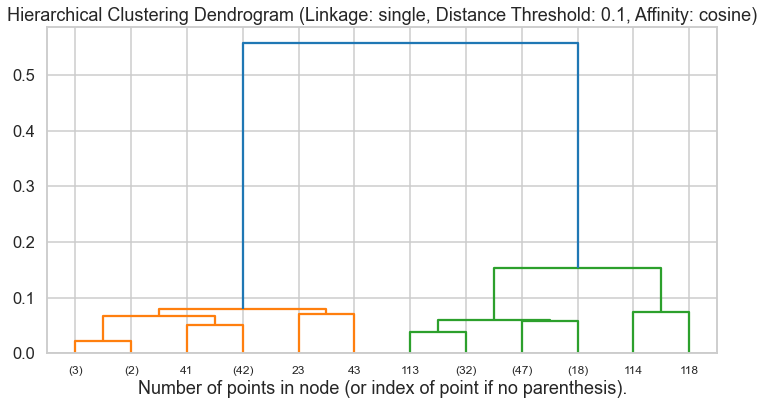

Silhouette Score: 0.6063042944714067


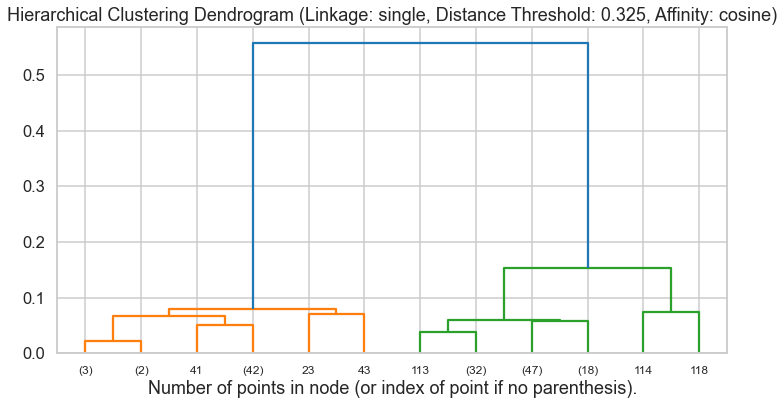

Silhouette Score: 0.7844507587290159


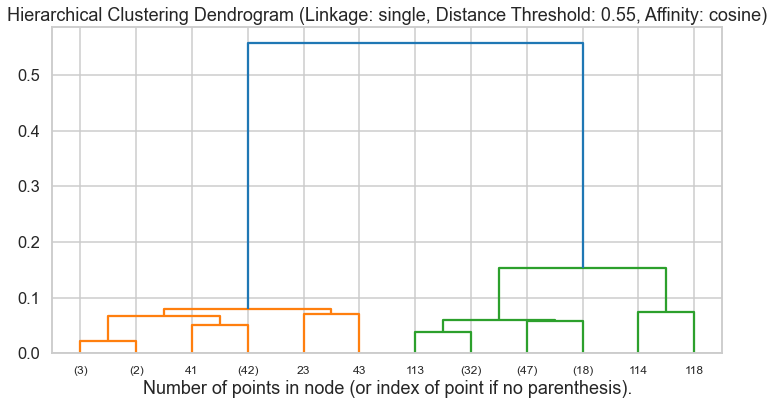

Silhouette Score: 0.7844507587290159


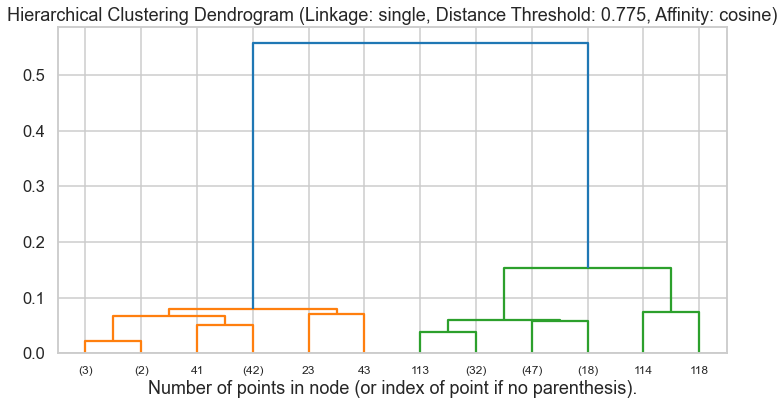

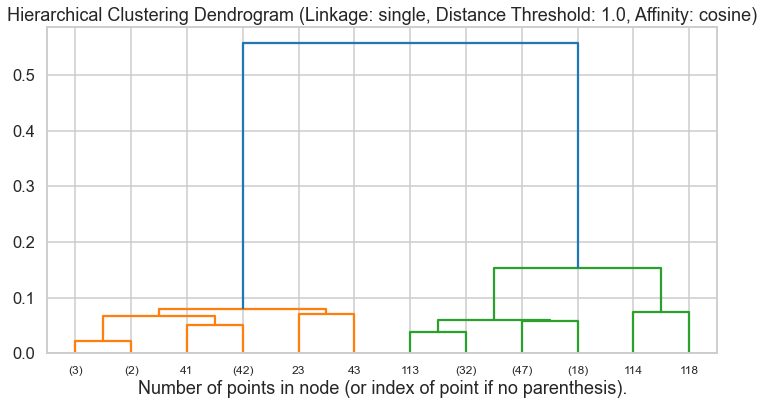

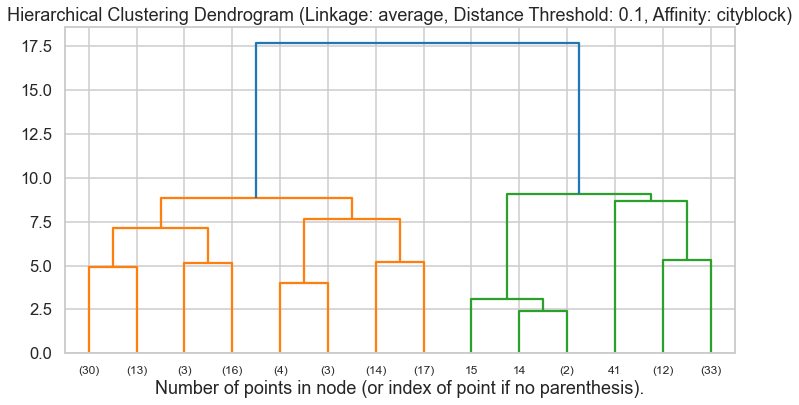

Silhouette Score: 0.5599999484644439


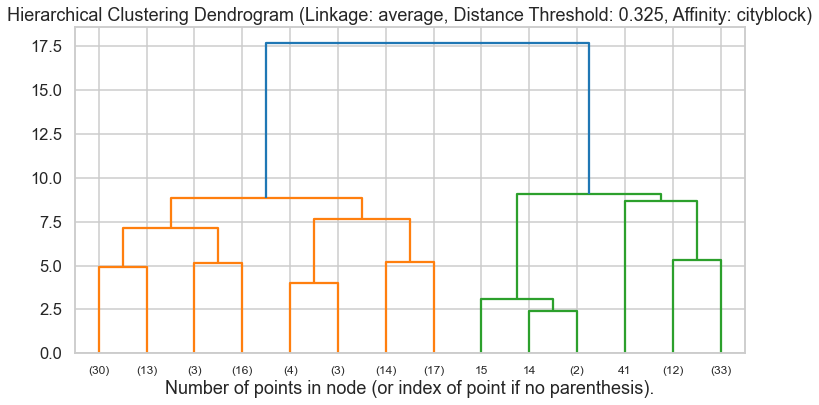

Silhouette Score: 0.5599999484644439


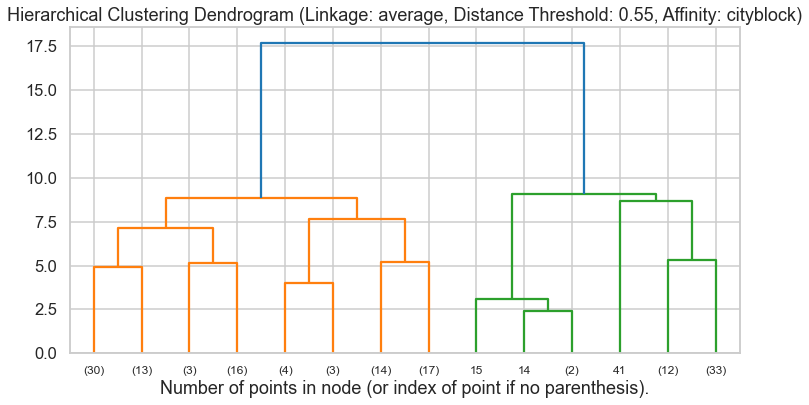

Silhouette Score: 0.5704086340233905


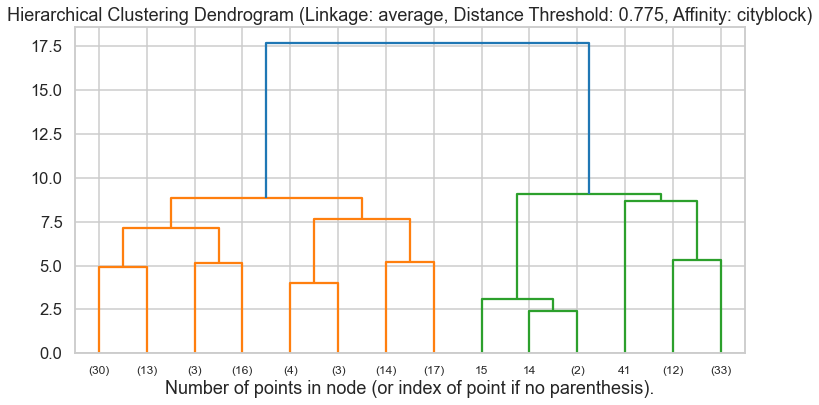

Silhouette Score: 0.5704086340233905


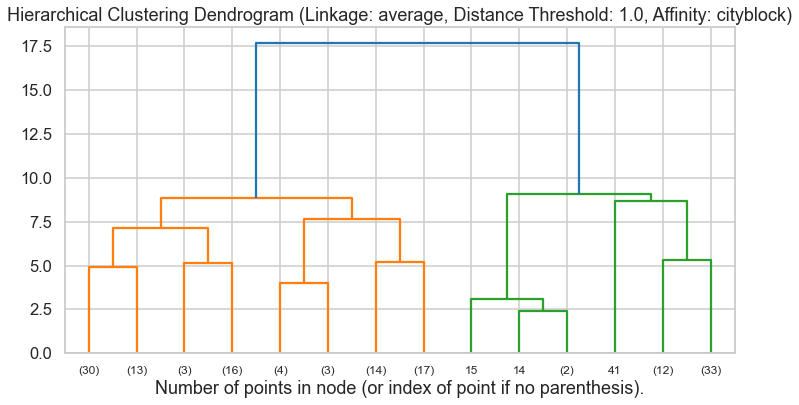

Silhouette Score: 0.5678376963830254


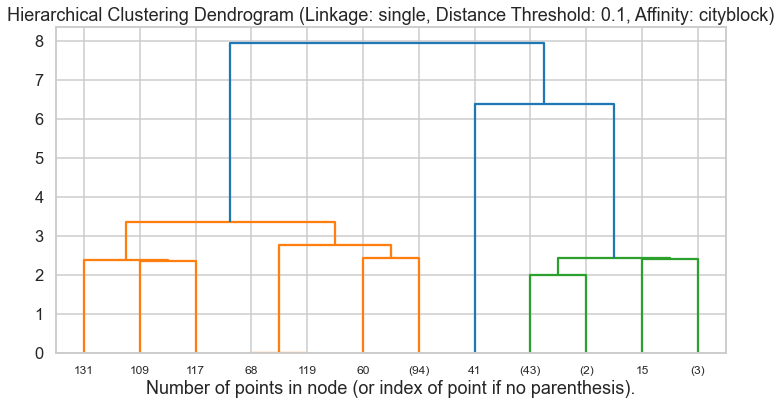

Silhouette Score: 0.5599999484644439


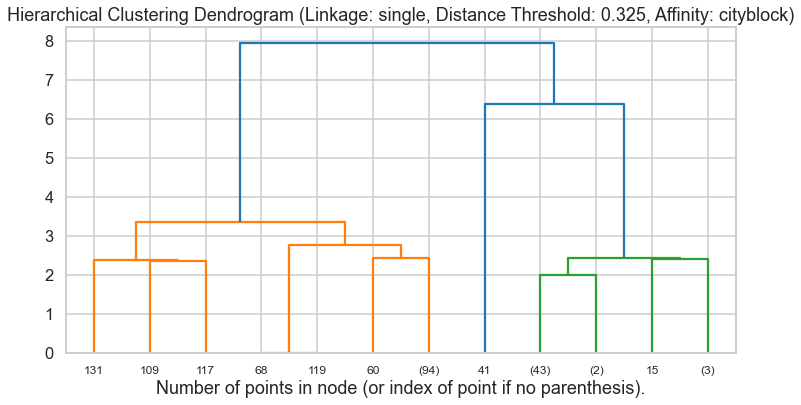

Silhouette Score: 0.5599999484644439


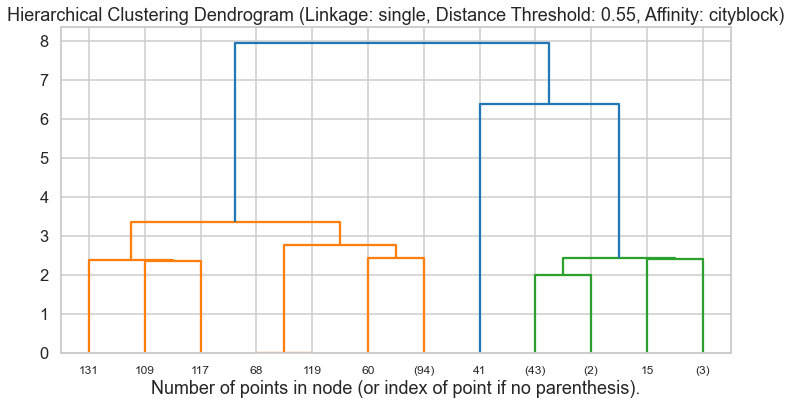

Silhouette Score: 0.5704086340233905


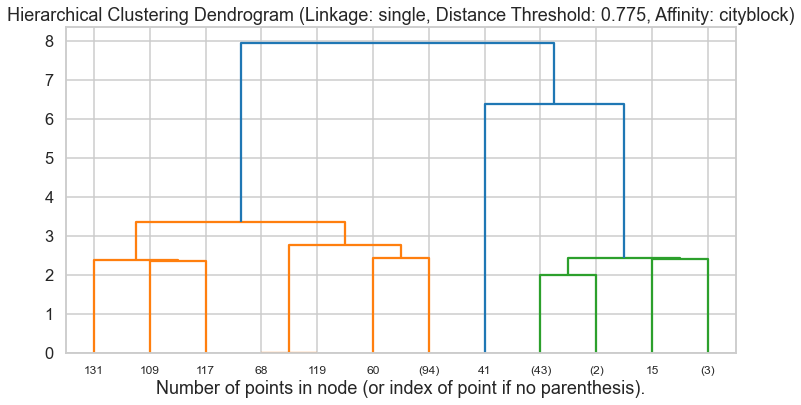

Silhouette Score: 0.5704086340233905


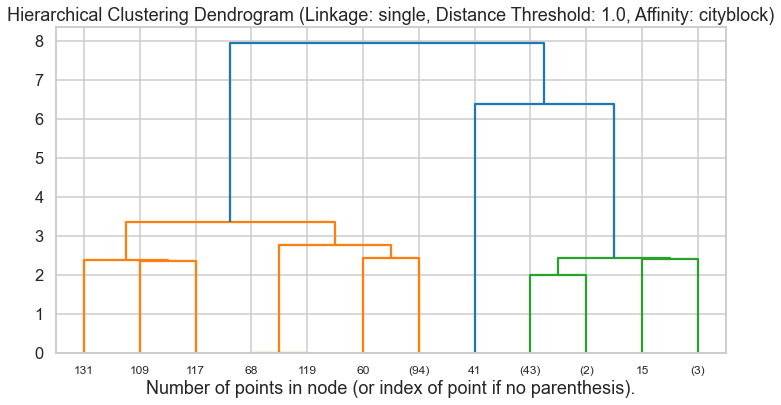

Silhouette Score: 0.5678376963830254

Pair of Features: ['petal length (cm)', 'petal width (cm)']


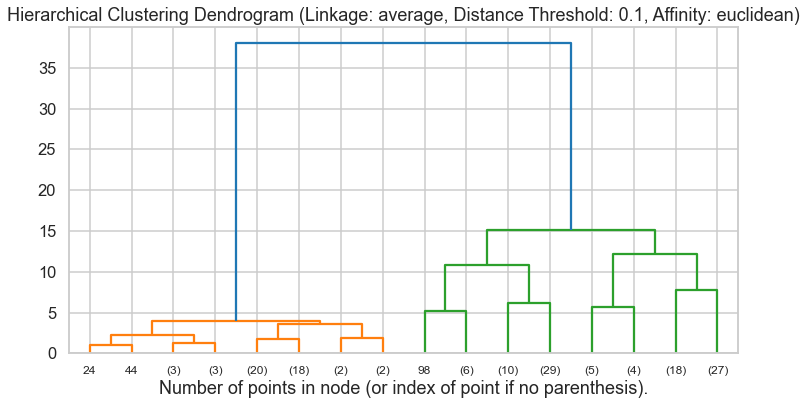

Silhouette Score: 0.4866663889314852


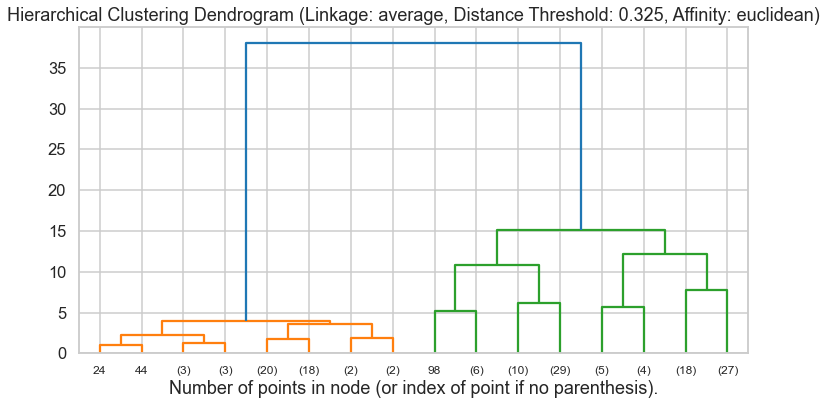

Silhouette Score: 0.4866663889314852


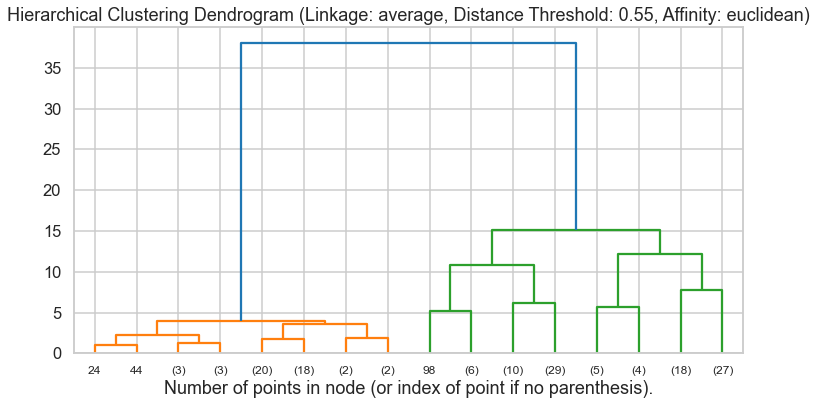

Silhouette Score: 0.47210881148717637


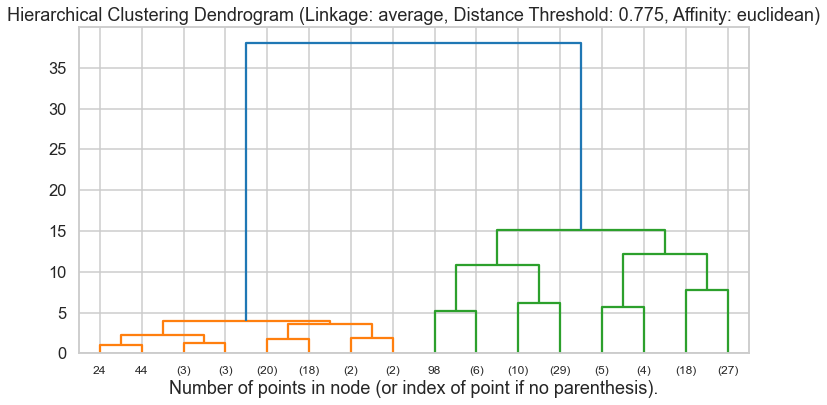

Silhouette Score: 0.4179672416523263


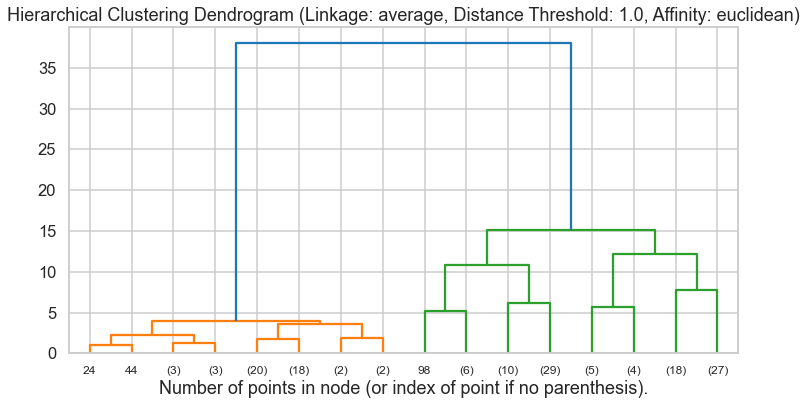

Silhouette Score: 0.4525246733247368


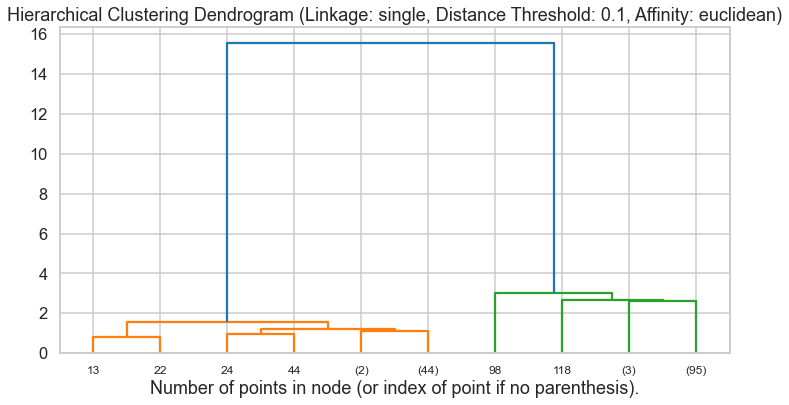

Silhouette Score: 0.4866663889314852


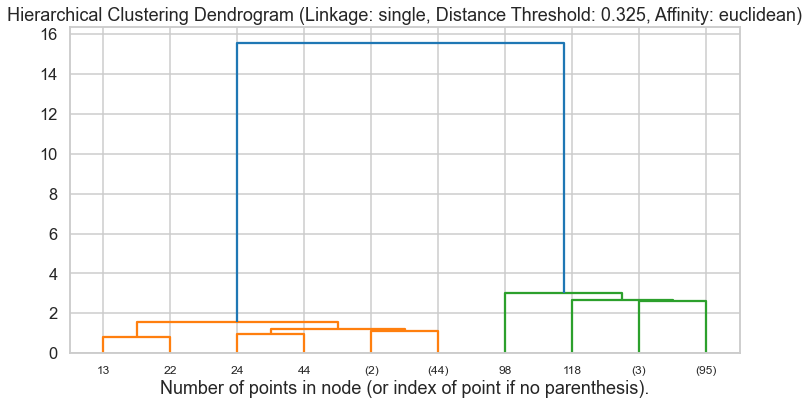

Silhouette Score: 0.4866663889314852


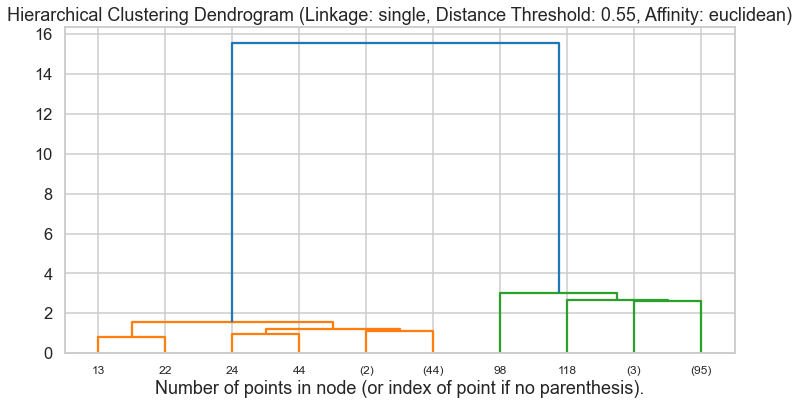

Silhouette Score: 0.47210881148717637


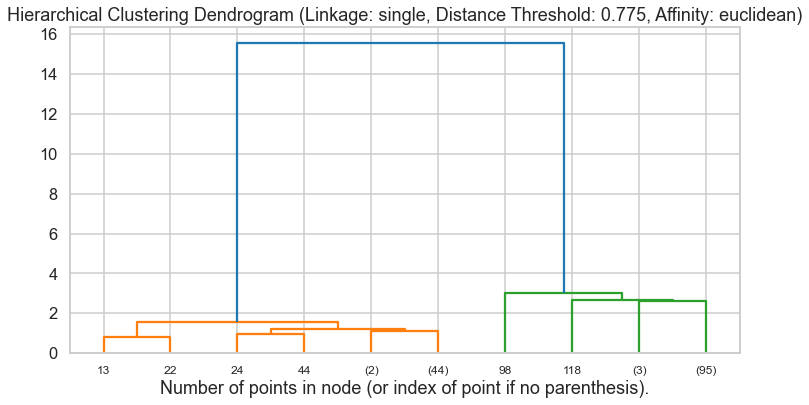

Silhouette Score: 0.3698904342941999


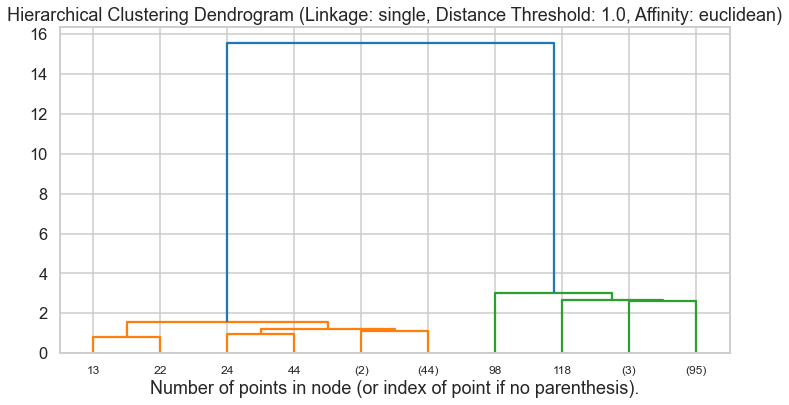

Silhouette Score: 0.38599653938933365


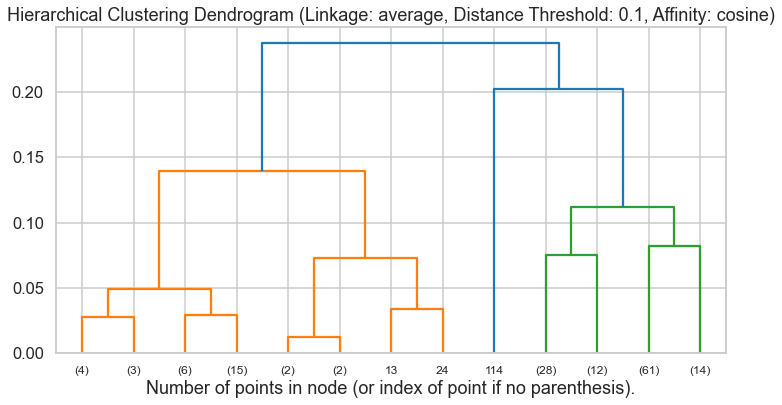

Silhouette Score: 0.5814974679766055


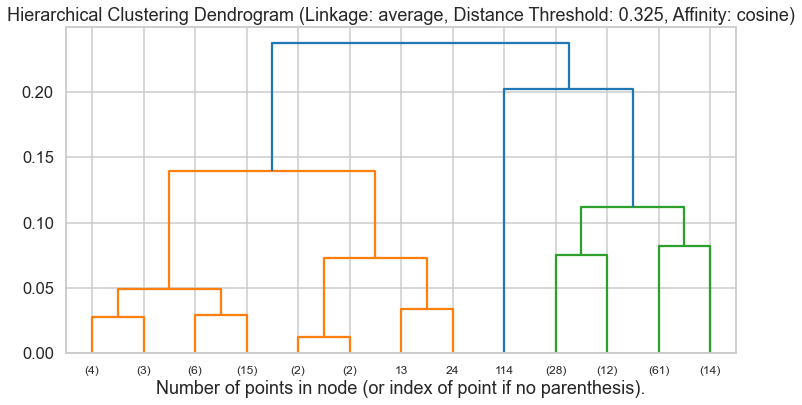

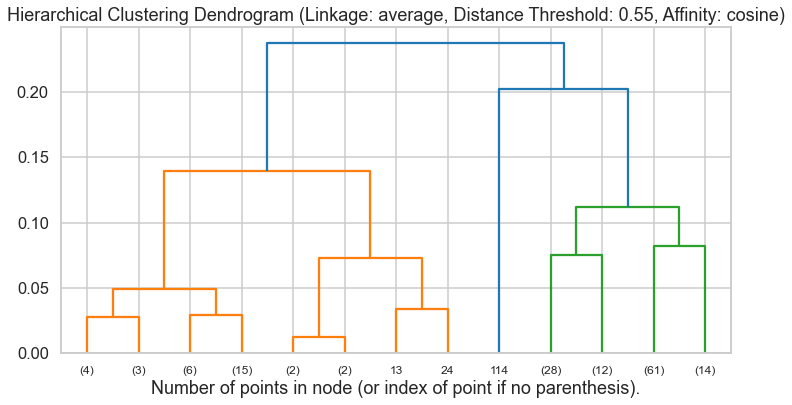

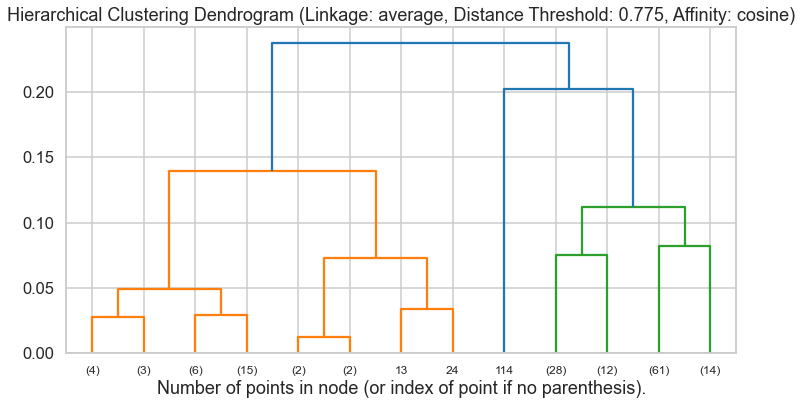

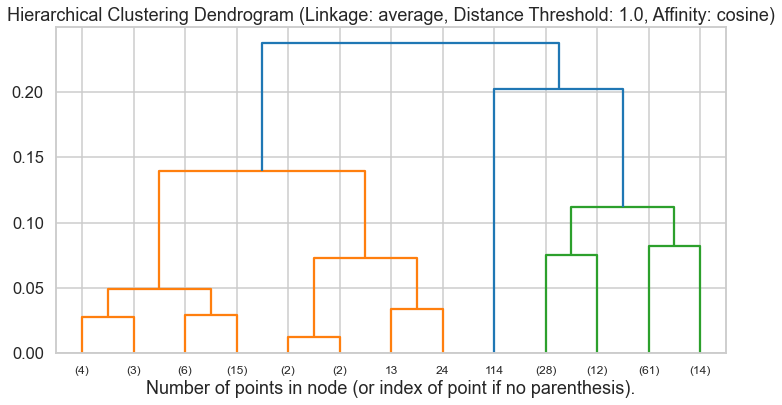

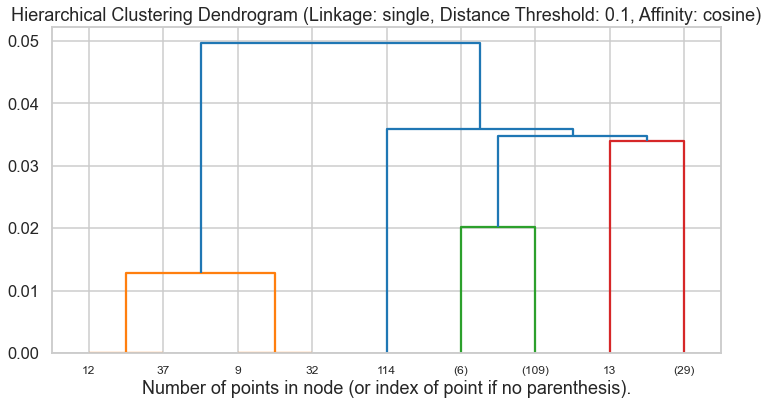

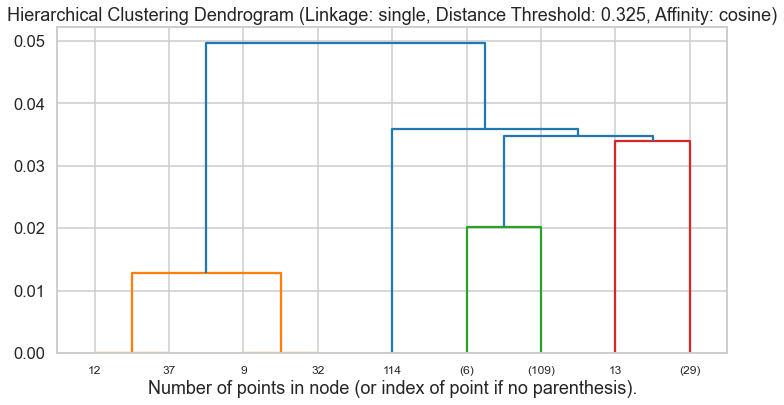

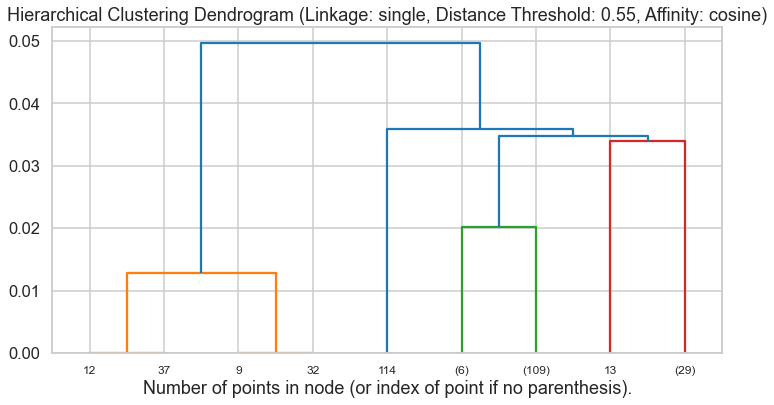

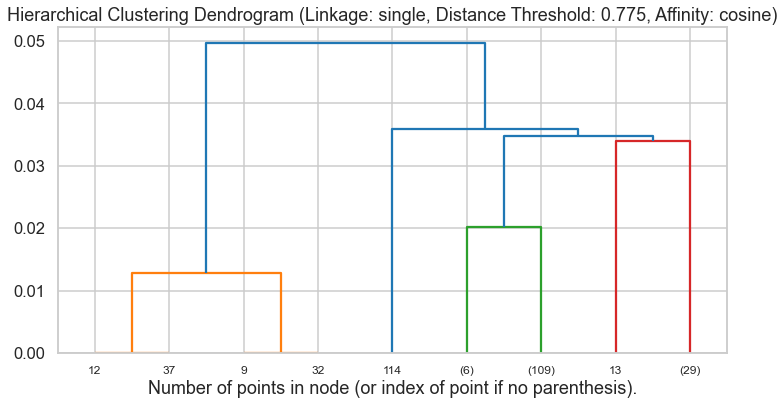

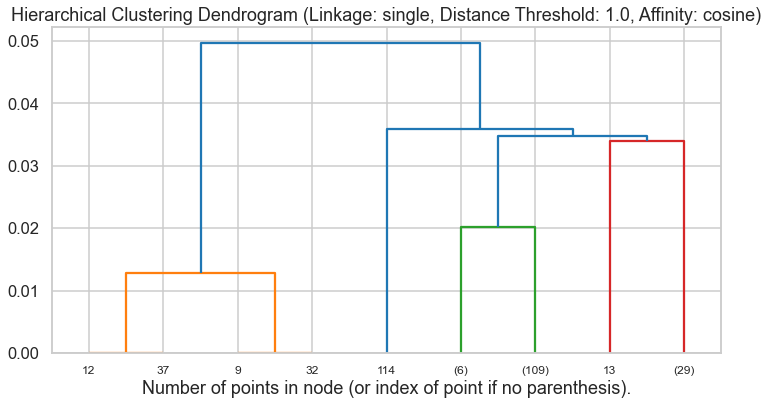

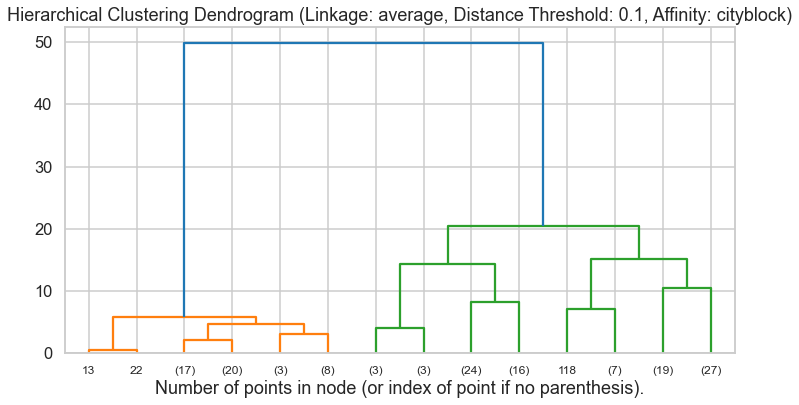

Silhouette Score: 0.48666651546576123


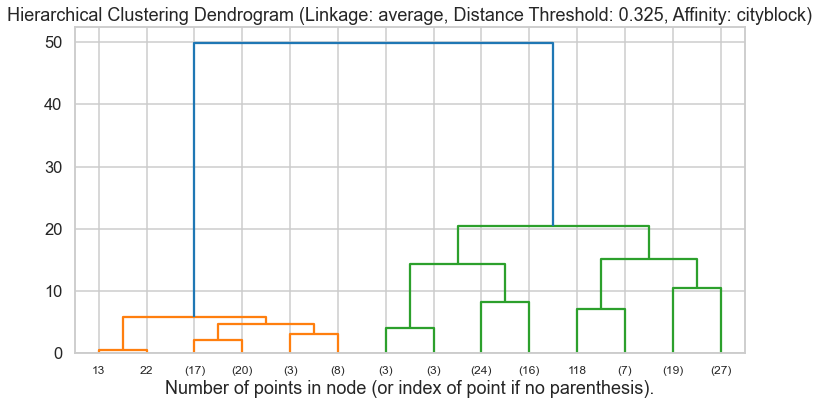

Silhouette Score: 0.48666651546576123


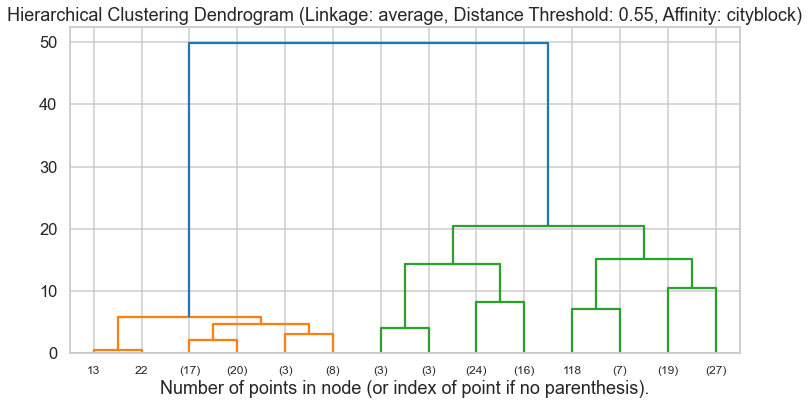

Silhouette Score: 0.5061579292927996


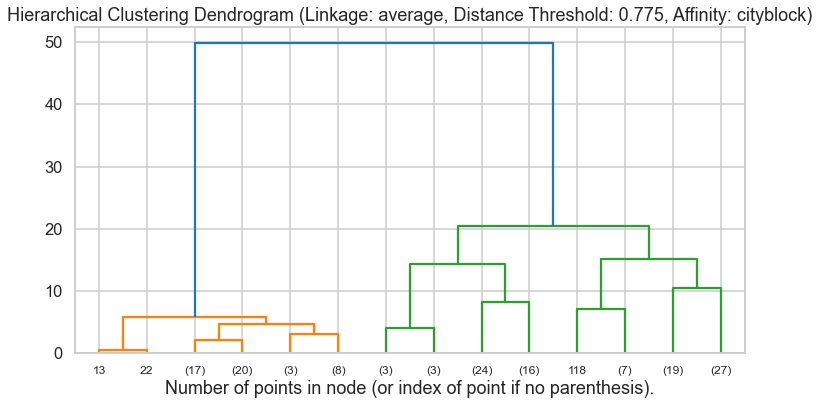

Silhouette Score: 0.5058433399111582


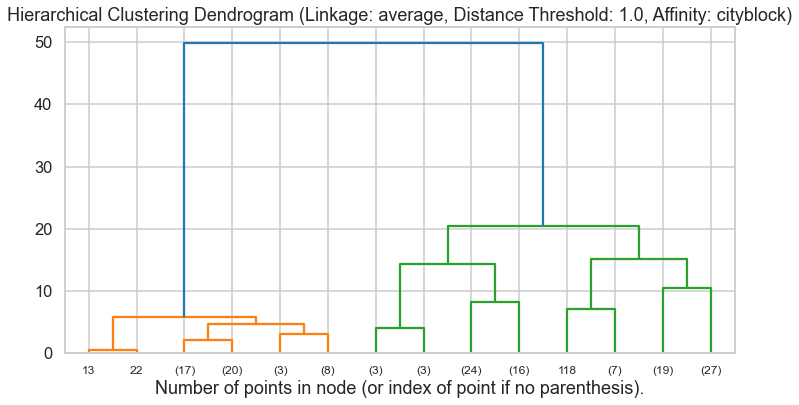

Silhouette Score: 0.4814513411386844


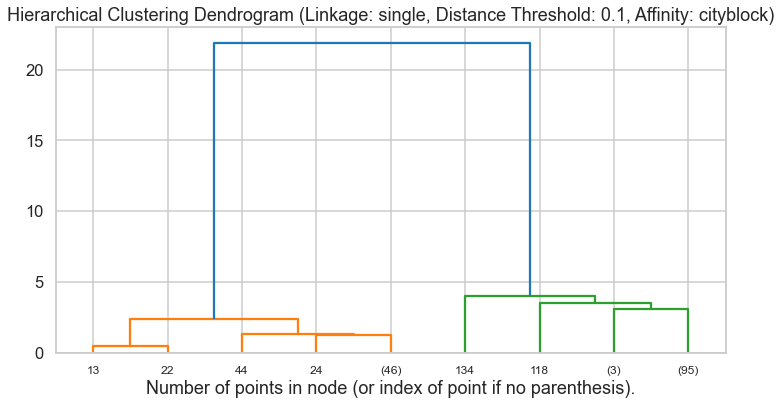

Silhouette Score: 0.48666651546576123


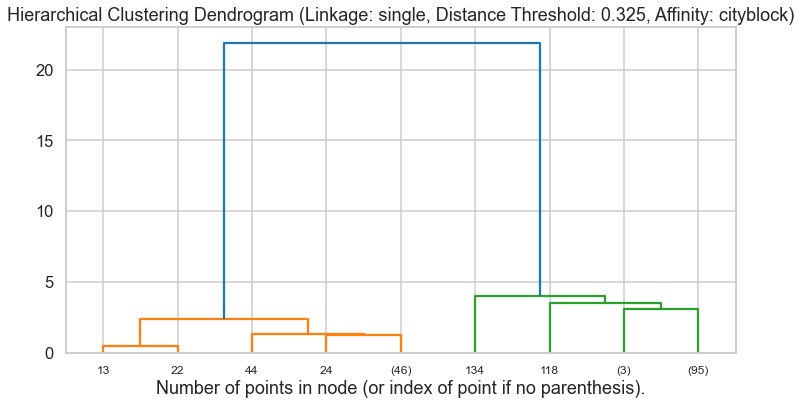

Silhouette Score: 0.48666651546576123


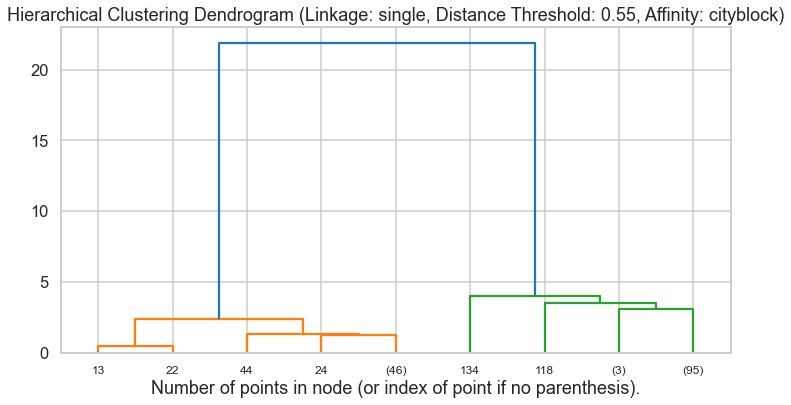

Silhouette Score: 0.5061579292927996


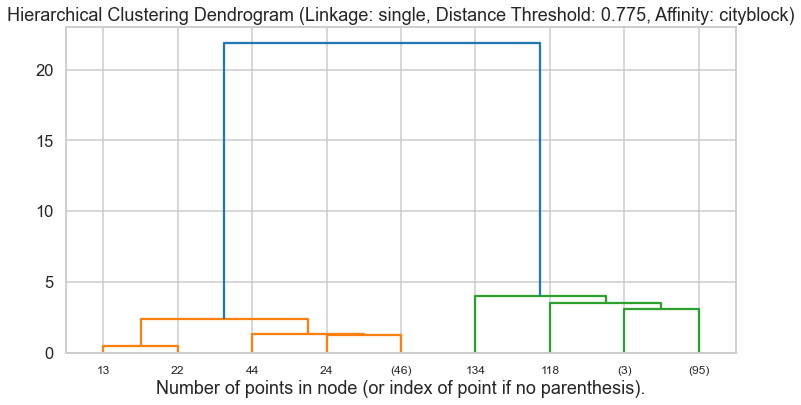

Silhouette Score: 0.5060912473762451


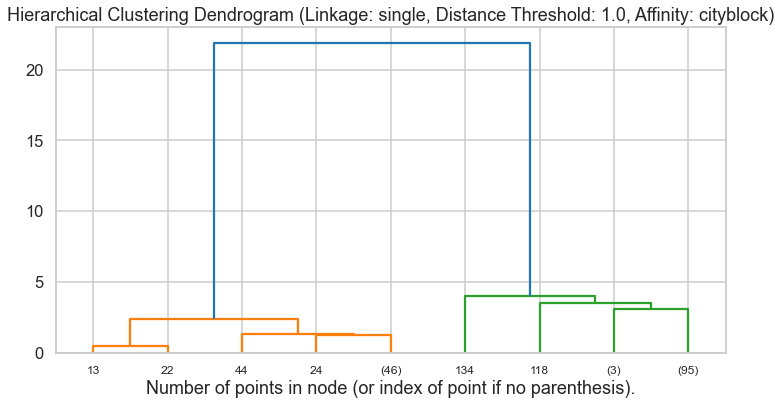

Silhouette Score: 0.47759405784379927

Best Parameters: {'pair': ['sepal width (cm)', 'petal length (cm)'], 'distance_metric': 'cosine', 'linkage_type': 'average', 'distance_threshold': 1.0}
Best Silhouette Score: 0.8651231469518453


In [15]:
# Load Iris dataset
iris_data = load_iris()
X = iris_data.data
feature_names = iris_data.feature_names

# Select every pair of features
pairs_of_features = [(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]

# Perform hierarchical clustering for each pair of features
best_silhouette_score = float('-inf')
best_params = None

for pair in pairs_of_features:
    feature_subset = X[:, pair]
    feature_subset_names = [feature_names[i] for i in pair]
    print("\nPair of Features:", feature_subset_names)
    for distance_metric in ['euclidean', 'cosine', 'cityblock']:
        for linkage_type in ['average', 'single']:
            for distance_threshold in np.linspace(0.1, 1.0, 5):
                try:
                    silhouette_score_current = hierarchical_clustering(feature_subset, affinity=distance_metric, linkage_type=linkage_type, distance_threshold=distance_threshold)

                    # Store the best silhouette_score and parameters
                    if silhouette_score_current > best_silhouette_score:
                        best_silhouette_score = silhouette_score_current
                        best_params = {'pair': feature_subset_names, 'distance_metric': distance_metric, 'linkage_type': linkage_type,'distance_threshold':distance_threshold}

                except ValueError as e:
                    # Skip when the number of clusters is one
                    if "Number of labels is 1" in str(e):
                        continue

# Print the best parameters and silhouette score
print("\nBest Parameters:", best_params)
print("Best Silhouette Score:", best_silhouette_score)


## DBScan

### Applying PCA first to reduce the iris to 2 features then apply DBScan

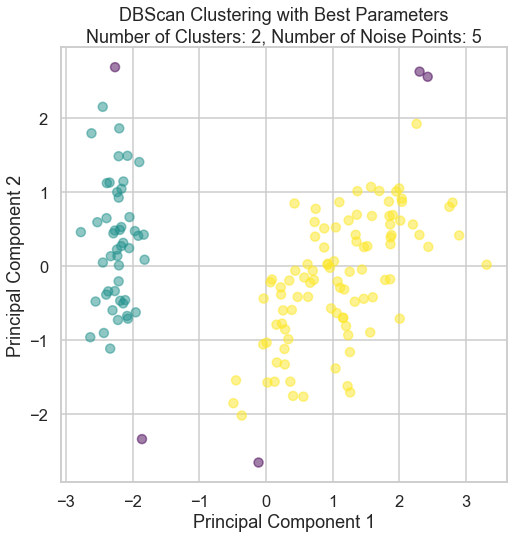

Best EPS: 1.0, Best Min_samples: 14
Best Silhouette Score: 0.5824811458241742


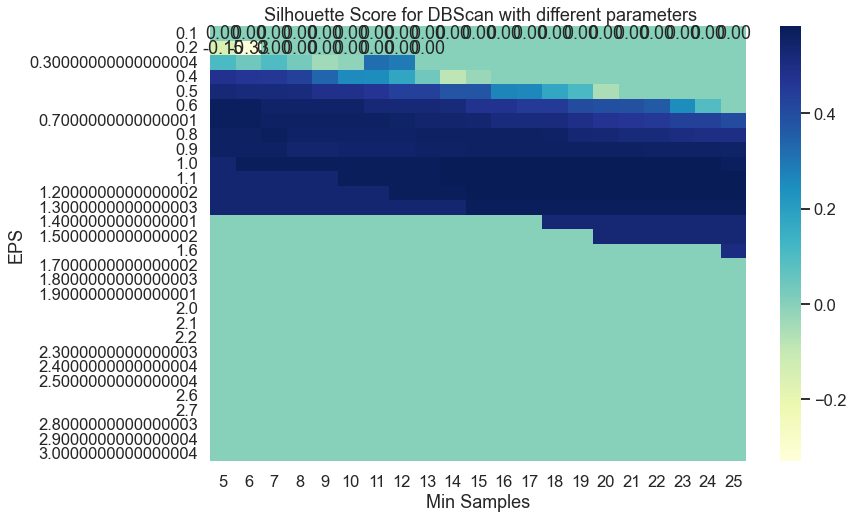

In [16]:
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data

# Standardize the data
scaler = StandardScaler()
iris_features_standardized = scaler.fit_transform(iris_features)

# Apply PCA to reduce the dataset to 2 dimensions
pca = PCA(n_components=2)
iris_features_pca = pca.fit_transform(iris_features_standardized)

# Define the range of parameters to search
eps_range = np.arange(0.1, 3.1, 0.1)
min_samples_range = np.arange(5, 26, 1)

# Perform DBScan with varying parameters and average silhouette score
average_silhouette_scores = perform_dbscan_with_average_silhouette(iris_features_pca, eps_range, min_samples_range)

# Find the indices of the maximum average silhouette score
best_indices = np.unravel_index(np.argmax(average_silhouette_scores), average_silhouette_scores.shape)
best_eps, best_min_samples, best_avg_silhouette_score = eps_range[best_indices[0]], min_samples_range[best_indices[1]], average_silhouette_scores[best_indices]

# Plot resulting clusters with the best parameters
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(iris_features_pca)

# Count the number of clusters (excluding noise)
num_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)
num_noise_points = np.sum(best_labels == -1)

# Plot the clusters
plt.scatter(iris_features_pca[:, 0], iris_features_pca[:, 1], c=best_labels, cmap='viridis', alpha=0.5)
plt.title(f'DBScan Clustering with Best Parameters\nNumber of Clusters: {num_clusters}, Number of Noise Points: {num_noise_points}')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

# Print the best parameters and corresponding average silhouette score
print(f"Best EPS: {best_eps}, Best Min_samples: {best_min_samples}")
print(f"Best Silhouette Score: {best_avg_silhouette_score}")

# Plot average silhouette scores
plt.figure(figsize=(12, 8))
sns.heatmap(average_silhouette_scores, annot=True, fmt=".2f", cmap="YlGnBu",
                xticklabels=min_samples_range, yticklabels=eps_range)
plt.xlabel("Min Samples")
plt.ylabel("EPS")
plt.title(" Silhouette Score for DBScan with different parameters")
plt.show()


## GMM 

### Applying PCA first to reduce the iris to 2 features then apply GMM

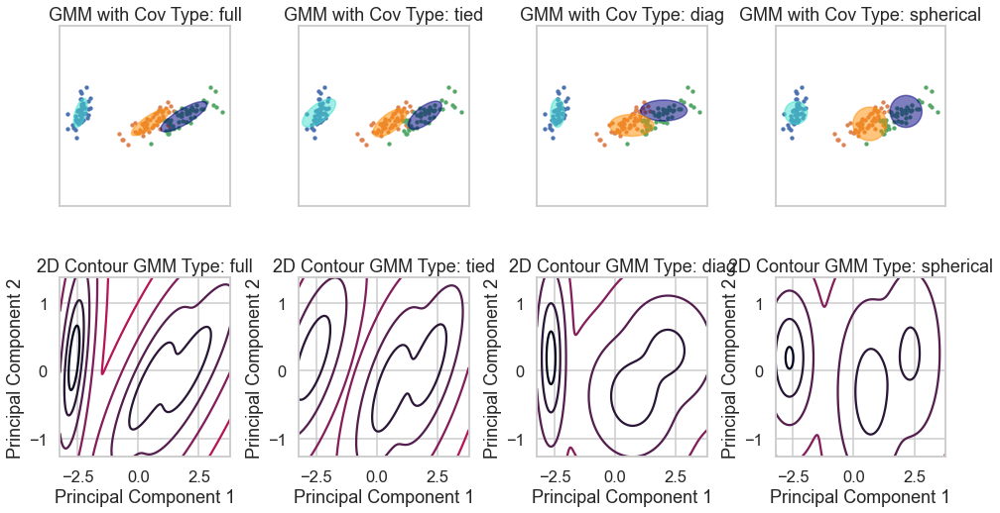

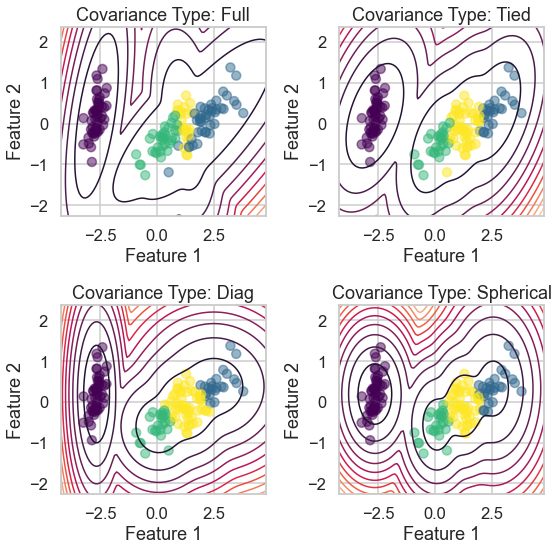

Log-likelihood for Full covariance type: -1.86
Log-likelihood for Tied covariance type: -2.08
Log-likelihood for Diag covariance type: -2.02
Log-likelihood for Spherical covariance type: -2.15


In [17]:
# Load Iris dataset
iris_data = load_iris()
iris_features = iris_data.data

# Apply PCA to reduce the dataset to 2 dimensions
pca = PCA(n_components=2)
iris_features_pca = pca.fit_transform(iris_features)

# Set up GMM parameters
covariance_types = ["full", "tied", "diag", "spherical"]
n_estimators = len(covariance_types)

plt.figure(figsize=(4 * n_estimators, 8))
plt.subplots_adjust(wspace=0.4, hspace=0.4)

for index, cov_type in enumerate(covariance_types):
    # Fit GMM with the current covariance_type
    gmm = GaussianMixture(n_components=len(np.unique(iris_data.target)),
                          covariance_type=cov_type,
                          random_state=42)
    gmm.fit(iris_features_pca)

    # Plot data points
    plt.subplot(2, n_estimators, index + 1)
    for n, color in enumerate(sns.color_palette("deep")):
        data = iris_features_pca[iris_data.target == n]
        plt.scatter(data[:, 0], data[:, 1], s=8, color=color, label=f"Class {n + 1}")

    # Plot GMM components
    make_ellipses(gmm, plt.gca())
    plt.title(f"GMM with Cov Type: {cov_type}")
    plt.xticks(())
    plt.yticks(())

    # Plot 2D contour plot of the GMM
    plt.subplot(2, n_estimators, index + n_estimators + 1)
    h = plt.gca()
    x, y = np.meshgrid(np.linspace(iris_features_pca[:, 0].min(), iris_features_pca[:, 0].max(), 500),
                       np.linspace(iris_features_pca[:, 1].min(), iris_features_pca[:, 1].max(), 500))
    xy = np.column_stack((x.ravel(), y.ravel()))
    z = -gmm.score_samples(xy)
    z = z.reshape(x.shape)
    plt.contour(x, y, z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10))
    plt.title(f"2D Contour GMM Type: {cov_type}")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")

plt.show()

## VERRA

log_likelihoods = {}

for i, covariance_type in enumerate(covariance_types, 1):
    # Create and fit GMM model
    gmm = GaussianMixture(n_components=4, covariance_type=covariance_type, random_state=0)
    gmm.fit(iris_features_pca)
    
    log_likelihoods[covariance_type] = gmm.score(iris_features_pca)
    
    # Generate grid points to evaluate the density
    x_min, x_max = iris_features_pca[:, 0].min() - 1, iris_features_pca[:, 0].max() + 1
    y_min, y_max = iris_features_pca[:, 1].min() - 1, iris_features_pca[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    Z = -gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot contour plot
    plt.subplot(2, 2, i)
    plt.scatter(iris_features_pca[:, 0], iris_features_pca[:, 1], marker='o', c=gmm.predict(iris_features_pca), cmap='viridis', alpha=0.5)
    plt.contour(xx, yy, Z, levels=10, linewidths=1.5)
    plt.title(f'Covariance Type: {covariance_type.capitalize()}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()
for covariance_type, log_likelihood in log_likelihoods.items():
    print(f'Log-likelihood for {covariance_type.capitalize()} covariance type: {log_likelihood:.2f}')


* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

# Customer dataset
Repeat all the above on the customer data set 

In [18]:
dataset = pd.read_csv('/Users/mahmoudelnakib/Desktop/Machine Learning/Assignment 1/Customer data.csv')

In [19]:
dataset.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [20]:
df = dataset.copy()

In [21]:
df = df.drop('ID', axis=1)
df.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1


## Kmeans

### Apply PCA to the customer dataset to reduce it to two features then apply kmean clustering

For K=2, Silhouette Score: 0.5834469063066806
For K=3, Silhouette Score: 0.512539047865931
For K=4, Silhouette Score: 0.5428479084194484
For K=5, Silhouette Score: 0.5401520655414145
For K=6, Silhouette Score: 0.5437793531102109
For K=7, Silhouette Score: 0.5325741436955314
For K=8, Silhouette Score: 0.5402053223225173
For K=9, Silhouette Score: 0.5338224914246146
For K=10, Silhouette Score: 0.5345894031086674
The best K based on Silhouette Score: 2


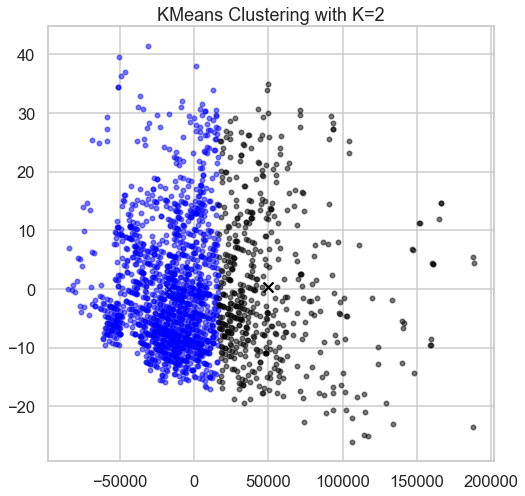

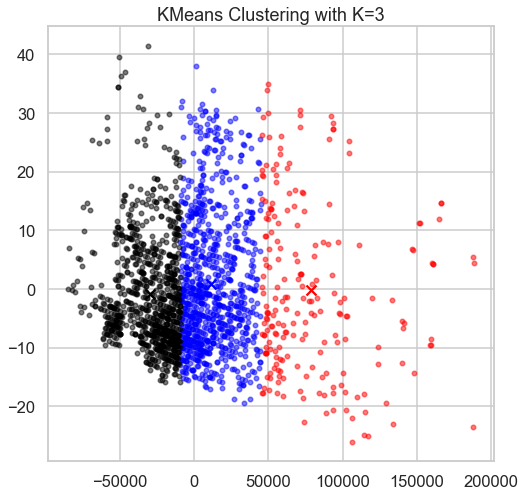

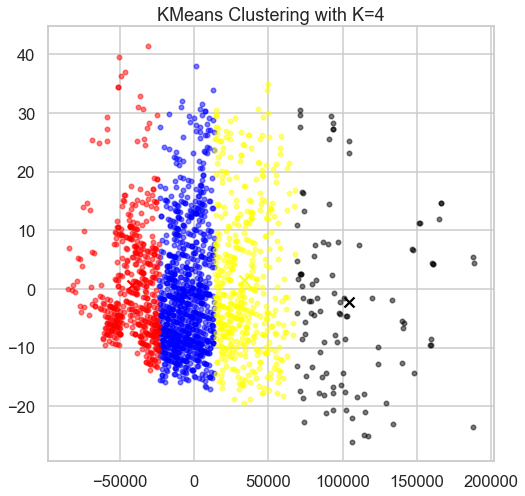

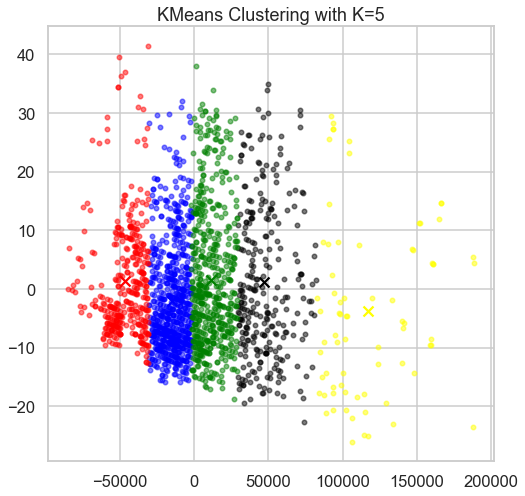

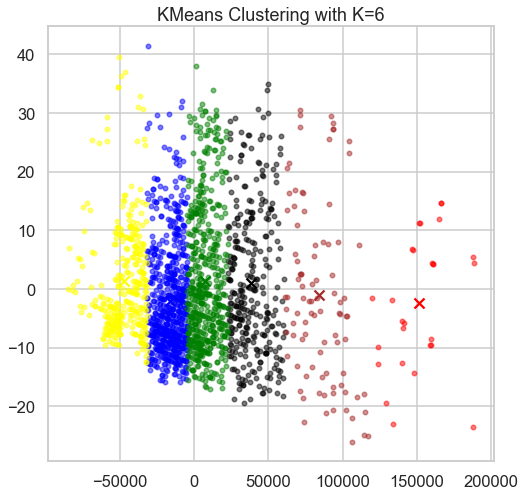

...

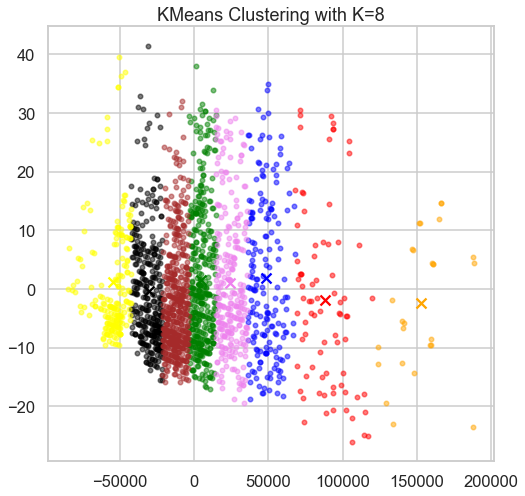

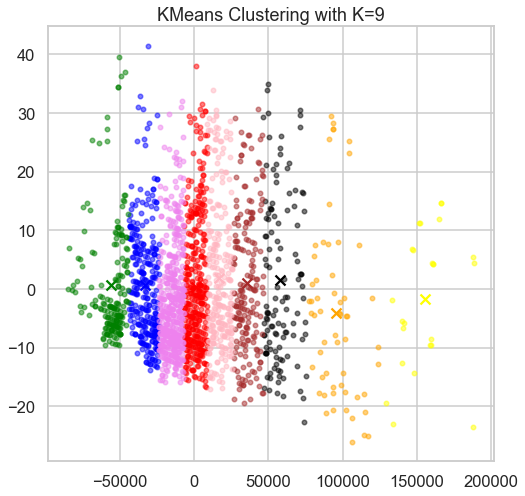

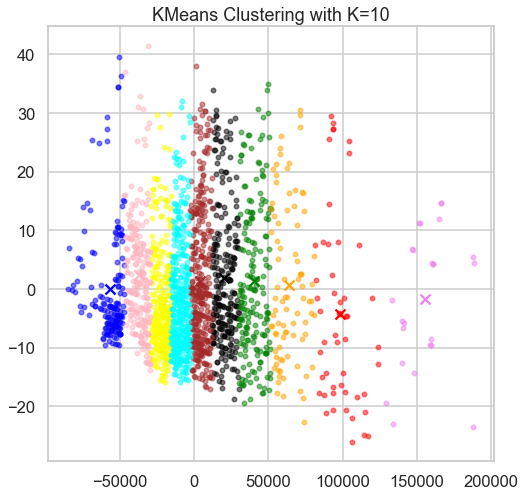

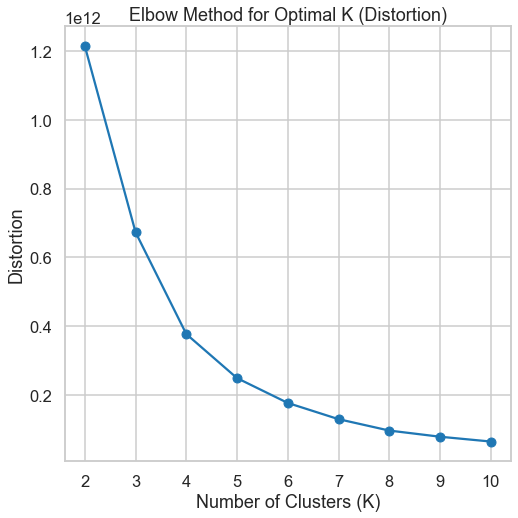

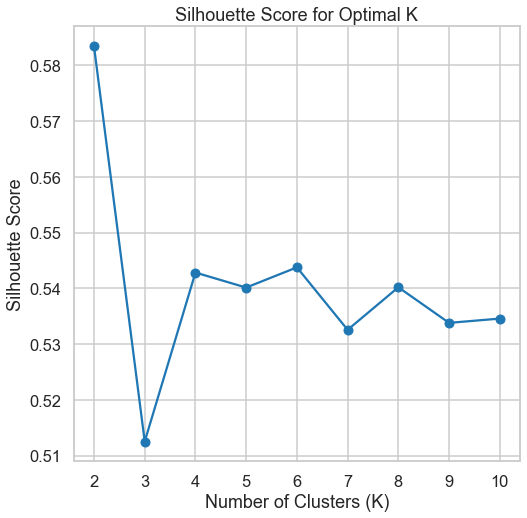

In [22]:
# Extract features from the DataFrame
dataset_features = df[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']].values

# Apply PCA to reduce the dataset to 2 dimensions
pca = PCA(n_components=2)
dataset_features_pca = pca.fit_transform(dataset_features)

# Specify K values to try
k_values = range(2, 11)

# Perform KMeans clustering and display results using PCA
best_k_pca = kmeans_clustering(dataset_features_pca, k_values)


## Heirarchal clustering

### Apply PCA to the customer dataset to reduce it to two features then apply Heirarchal clustering

In [23]:
df.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1


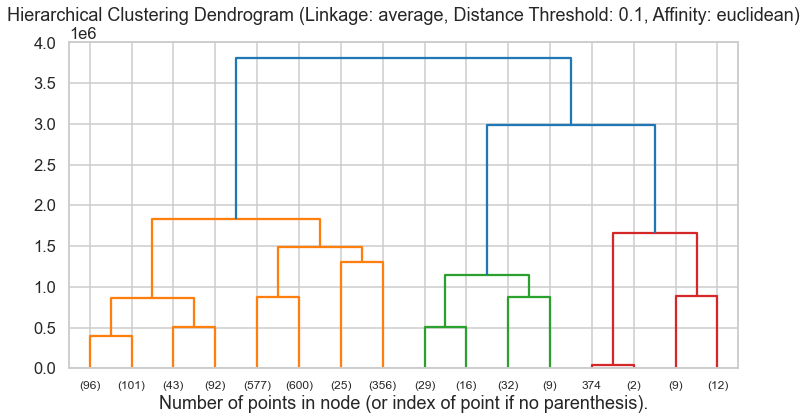

Silhouette Score: 0.0009999725645384024


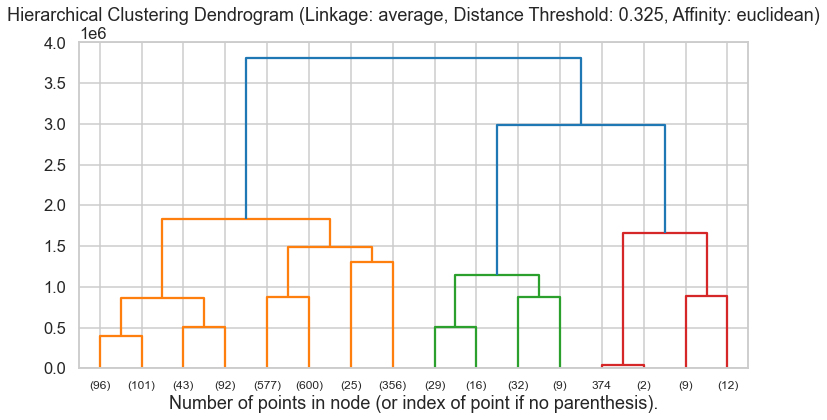

Silhouette Score: 0.0009999725645384024


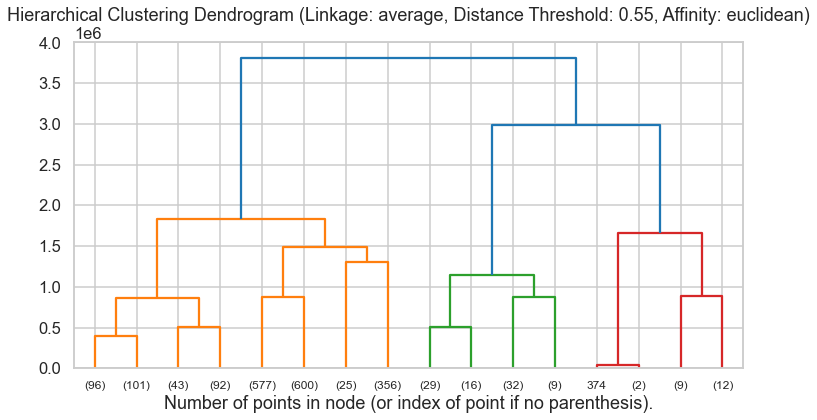

Silhouette Score: 0.0009999725645384024


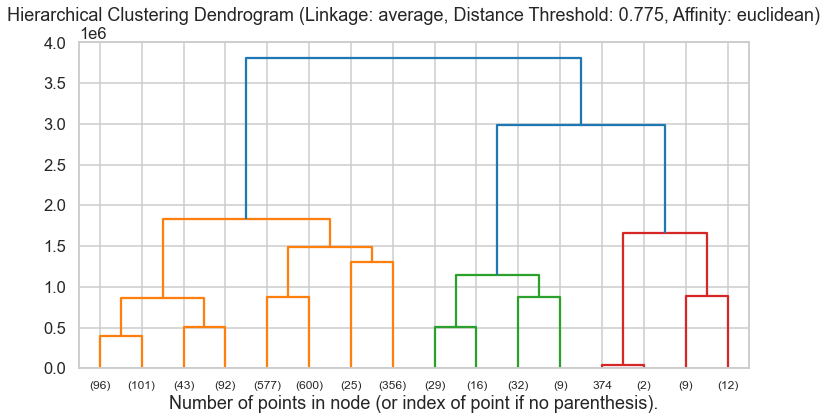

Silhouette Score: 0.0009999725645384024


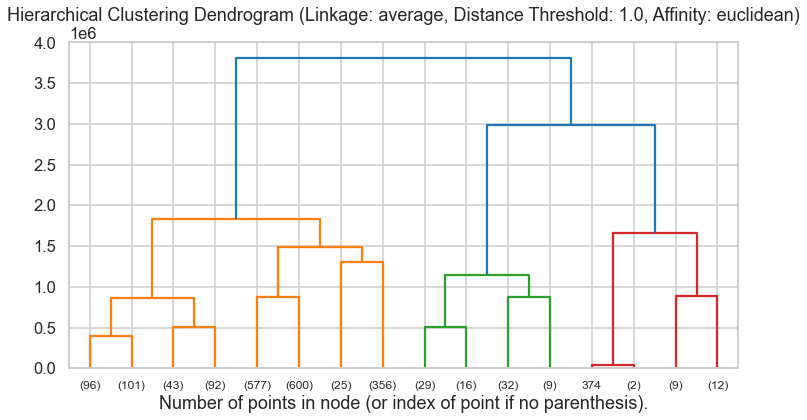

Silhouette Score: 0.0009999725645384024


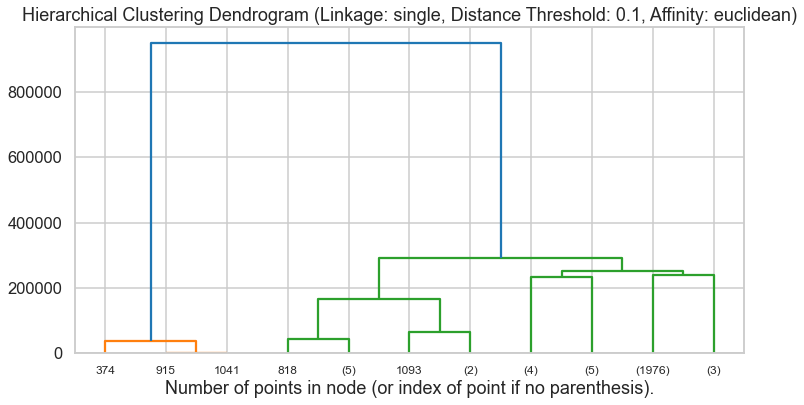

Silhouette Score: 0.0009999725645384024


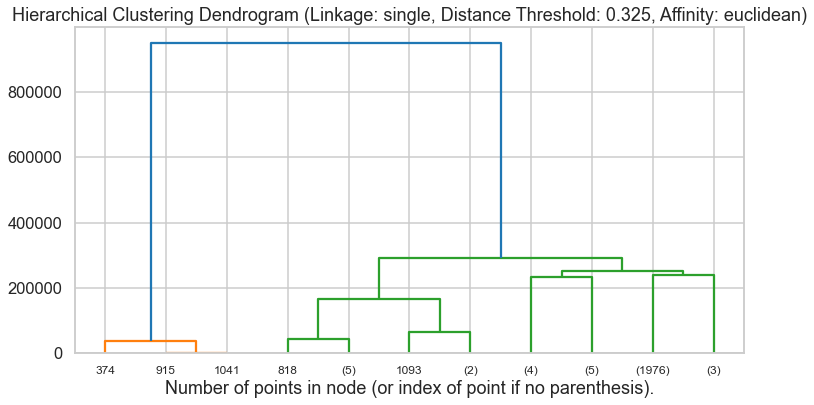

Silhouette Score: 0.0009999725645384024


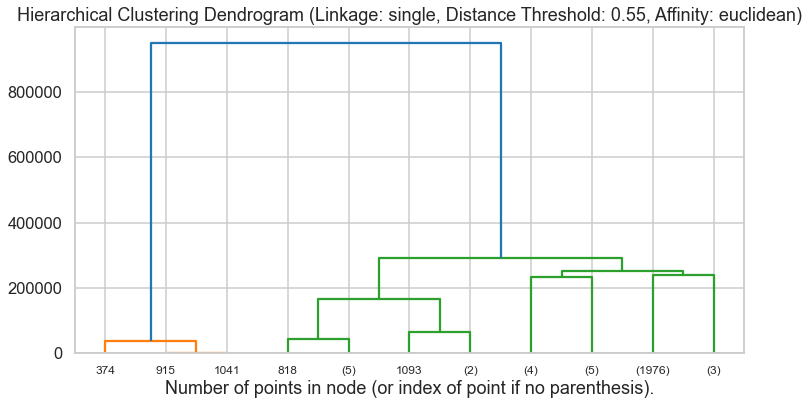

Silhouette Score: 0.0009999725645384024


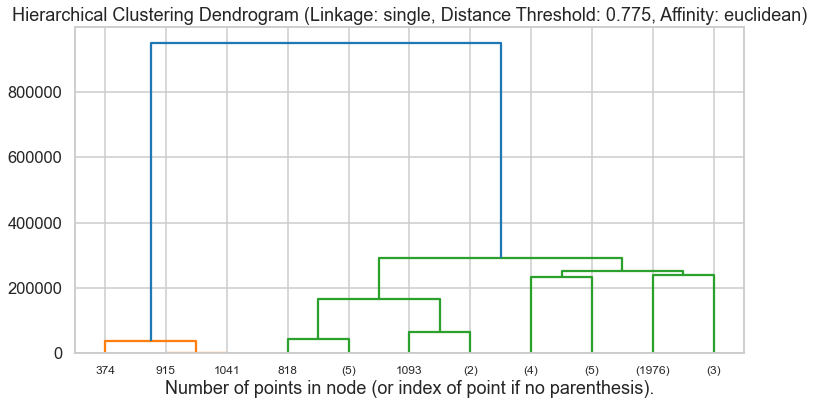

Silhouette Score: 0.0009999725645384024


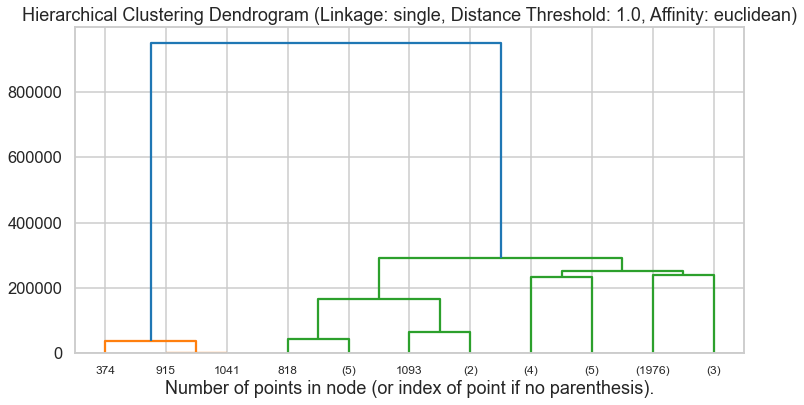

Silhouette Score: 0.0009999725645384024


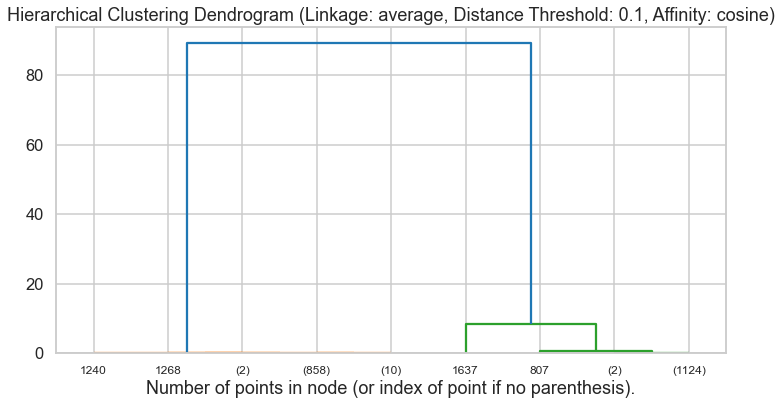

Silhouette Score: 0.9910552921493818


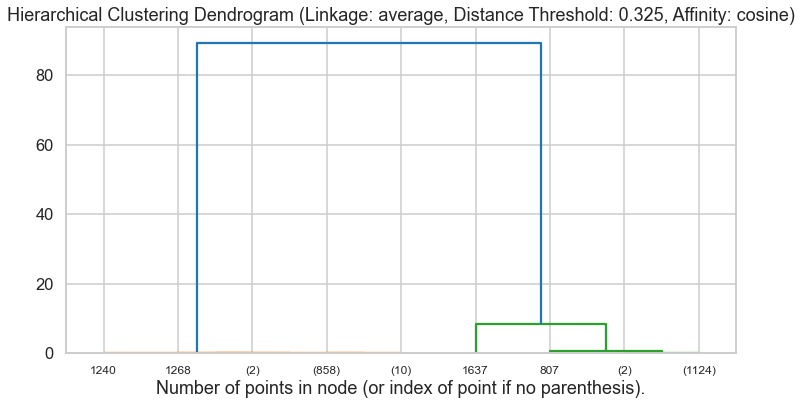

Silhouette Score: 0.9977922521447594


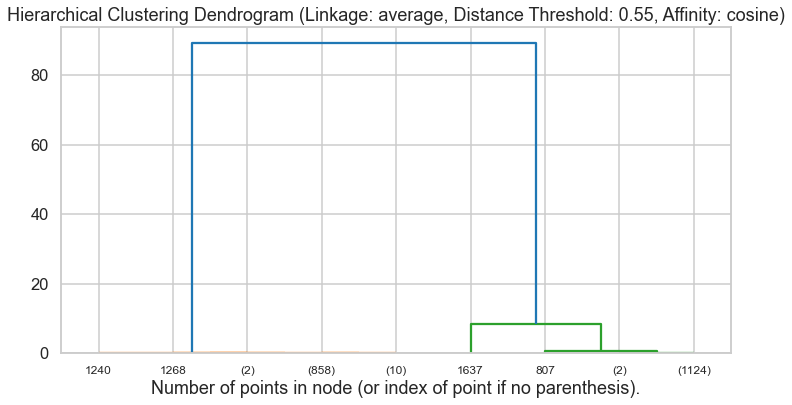

Silhouette Score: 0.9977922521447594


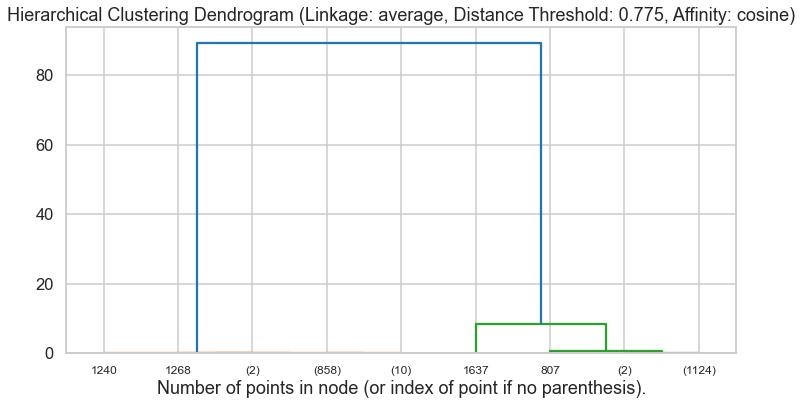

Silhouette Score: 0.9993276855602836


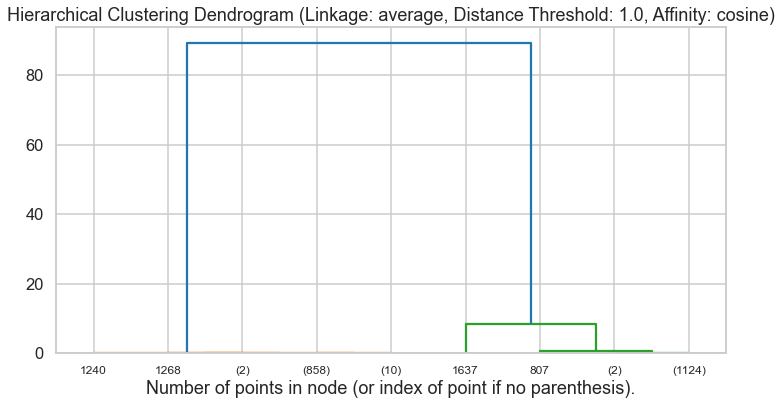

Silhouette Score: 0.9993276855602836


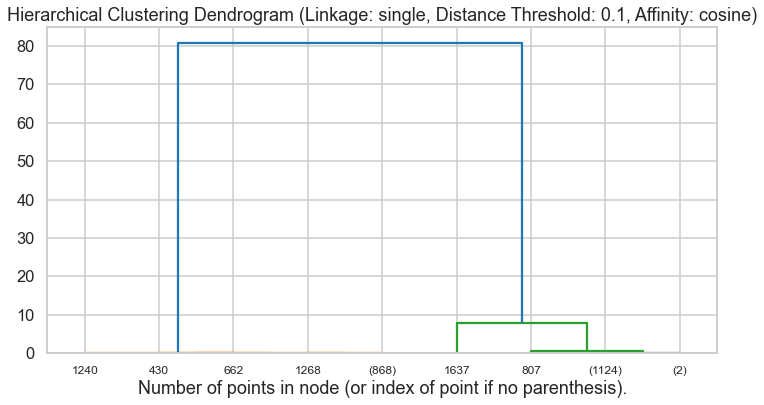

Silhouette Score: 0.9977922521447594


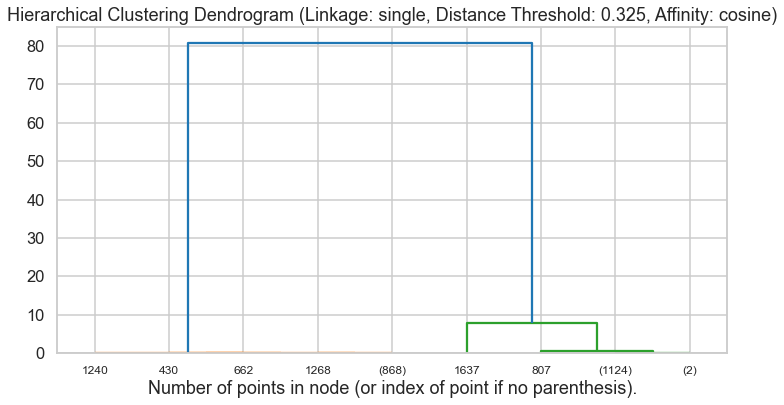

Silhouette Score: 0.9977922521447594


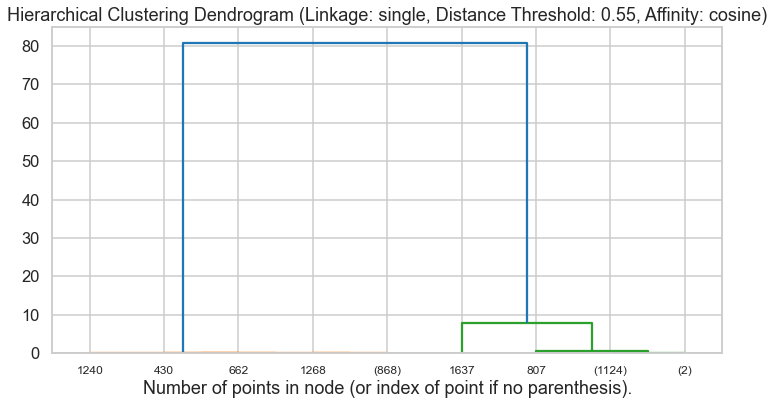

Silhouette Score: 0.9977922521447594


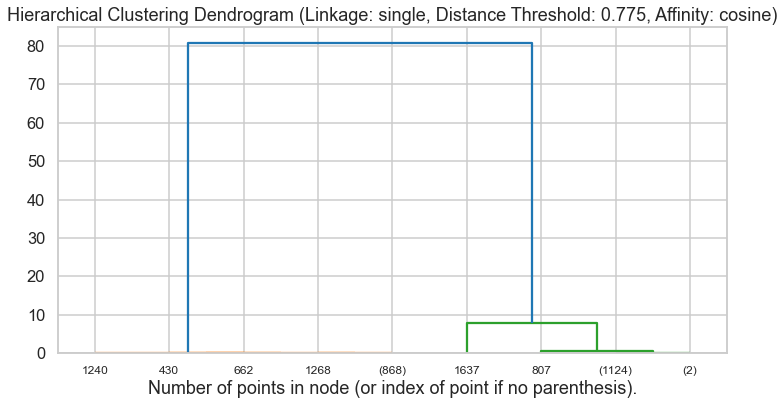

Silhouette Score: 0.9993276855602836


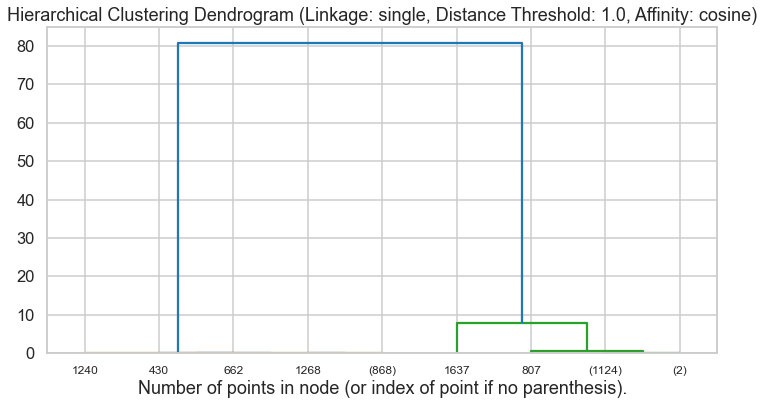

Silhouette Score: 0.9993276855602836


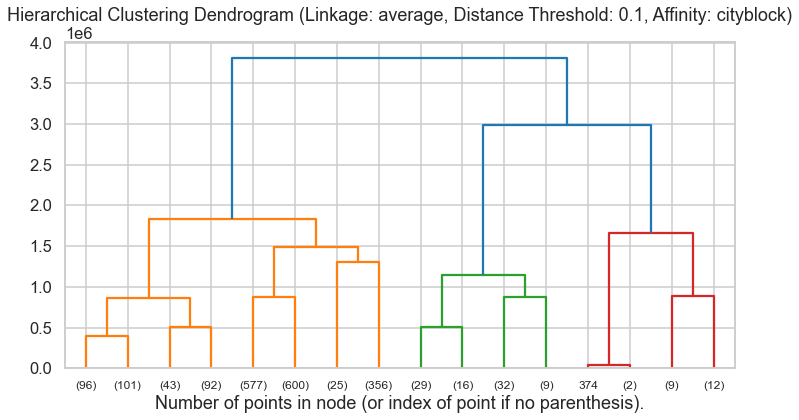

Silhouette Score: 0.0009999396967970825


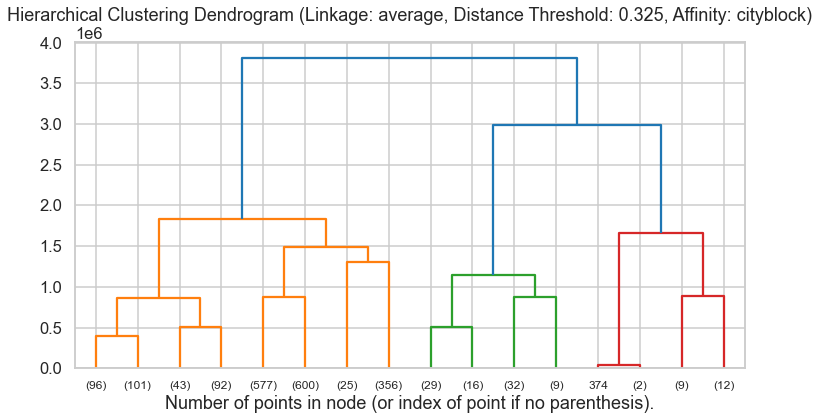

Silhouette Score: 0.0009999396967970825


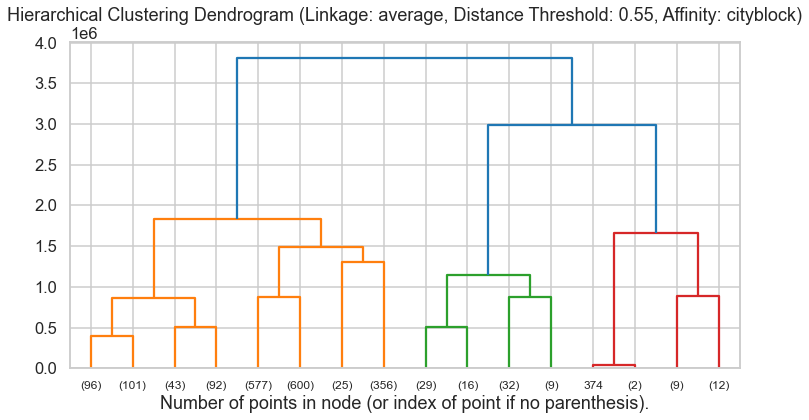

Silhouette Score: 0.0009999396967970825


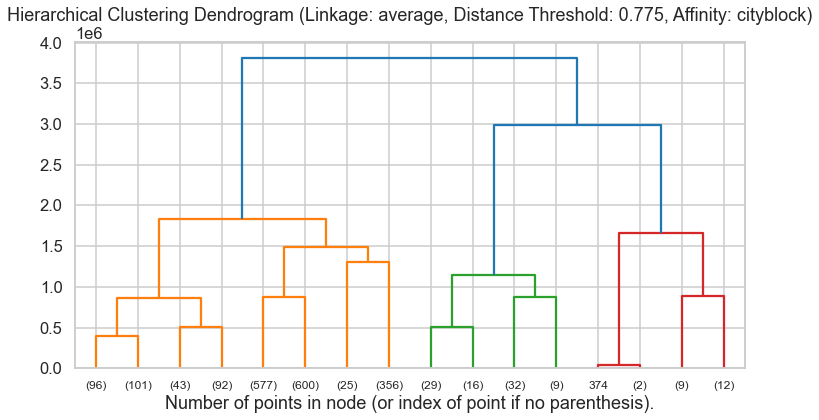

Silhouette Score: 0.0009999396967970825


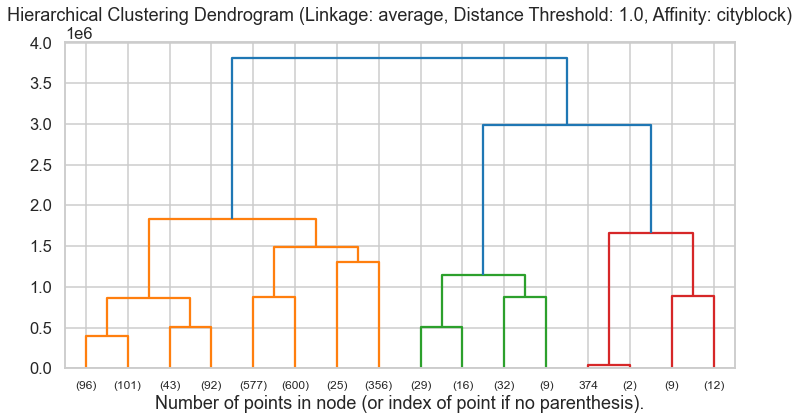

Silhouette Score: 0.0009999396967970825


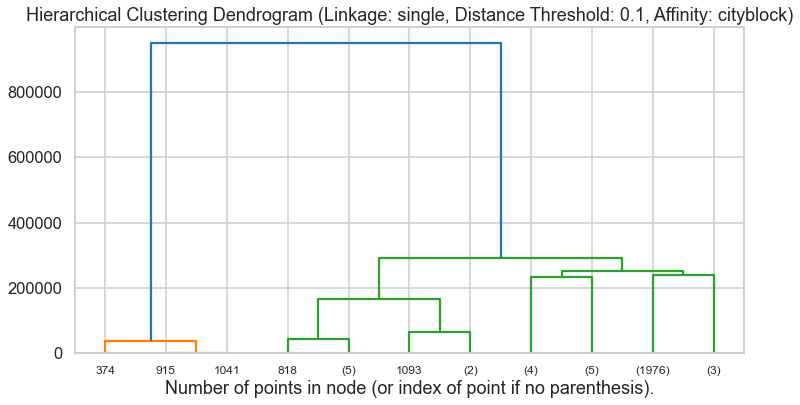

Silhouette Score: 0.0009999396967970825


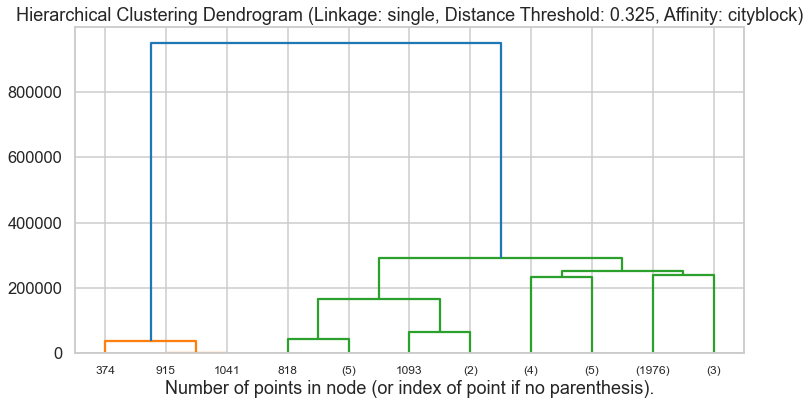

Silhouette Score: 0.0009999396967970825


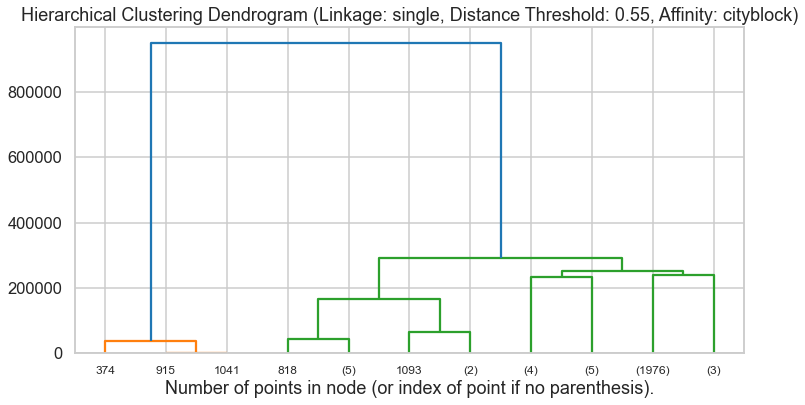

Silhouette Score: 0.0009999396967970825


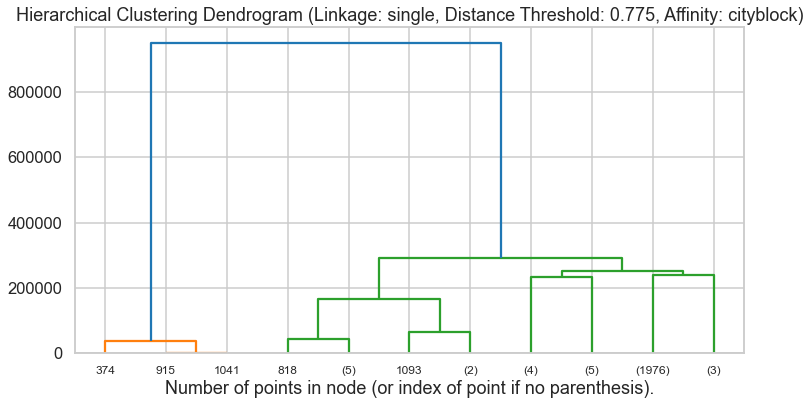

Silhouette Score: 0.0009999396967970825


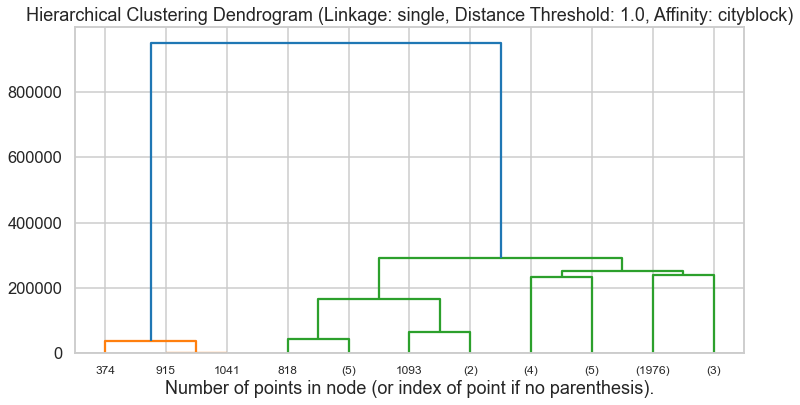

Silhouette Score: 0.0009999396967970825
Best Parameters: {'distance_metric': 'cosine', 'linkage_type': 'average', 'distance_threshold': 0.775}
Best Silhouette Score: 0.9993276855602836


In [24]:
# Extract the feature names and data
feature_names = df.columns
X = df.values

# Apply PCA to reduce the dimensionality to 2 features
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Perform hierarchical clustering on the reduced dataset
best_silhouette_score = float('-inf')
best_params = None

for distance_metric in ['euclidean', 'cosine', 'cityblock']:
    for linkage_type in ['average', 'single']:
        for distance_threshold in np.linspace(0.1, 1.0, 5):
            try:
                silhouette_score_current = hierarchical_clustering(X_pca, affinity=distance_metric, linkage_type=linkage_type,distance_threshold=distance_threshold)

                # Store the best silhouette_score and parameters
                if silhouette_score_current > best_silhouette_score:
                    best_silhouette_score = silhouette_score_current
                    best_params = {'distance_metric': distance_metric, 'linkage_type': linkage_type,'distance_threshold':distance_threshold}
            except ValueError as e:
                    # Skip when the number of clusters is one
                    if "Number of labels is 1" in str(e):
                        continue
# Print the best parameters and silhouette score
print("Best Parameters:", best_params)
print("Best Silhouette Score:", best_silhouette_score)


## DBScan

### Apply PCA to the customer dataset to reduce it to two features then apply DBScan clustering

In [25]:
df.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1


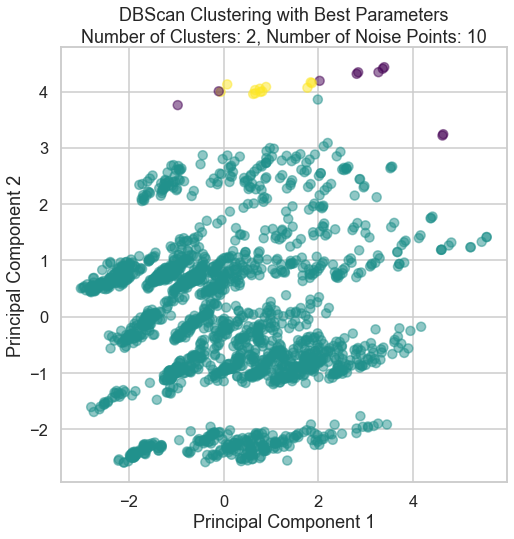

Best EPS: 1.0, Best Min_samples: 12
Best Silhouette Score: 0.394686636436618


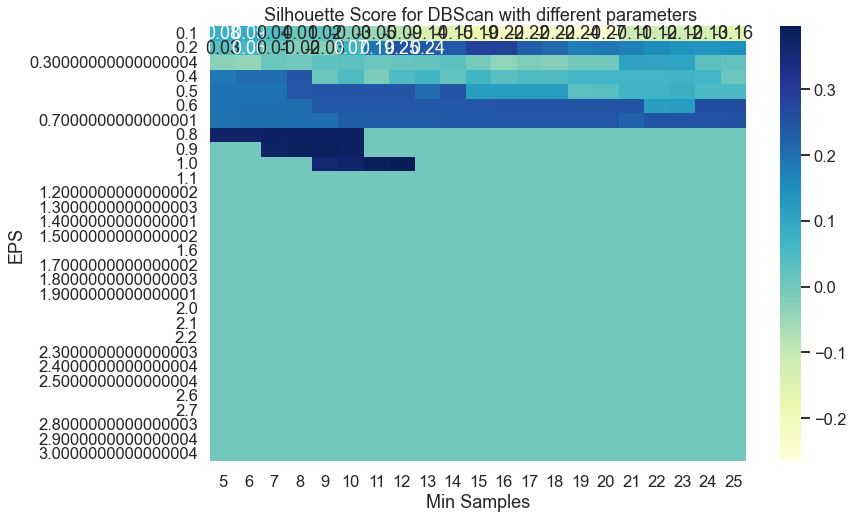

In [26]:
# Extract features (assuming no target column)
data = df.values

# Standardize the data
scaler = StandardScaler()
data_standardized = scaler.fit_transform(data)

# Apply PCA to reduce the dataset to 2 dimensions
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_standardized)

# Define the range of parameters to search
eps_range = np.arange(0.1, 3.1, 0.1)
min_samples_range = np.arange(5, 26, 1)

# Perform DBScan with varying parameters and average silhouette score
average_silhouette_scores = perform_dbscan_with_average_silhouette(data_pca, eps_range, min_samples_range)

# Find the indices of the maximum average silhouette score
best_indices = np.unravel_index(np.argmax(average_silhouette_scores), average_silhouette_scores.shape)
best_eps, best_min_samples, best_avg_silhouette_score = eps_range[best_indices[0]], min_samples_range[best_indices[1]], average_silhouette_scores[best_indices]

# Plot resulting clusters with the best parameters
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(data_pca)

# Count the number of clusters (excluding noise)
num_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)
num_noise_points = np.sum(best_labels == -1)

# Plot the clusters
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=best_labels, cmap='viridis', alpha=0.5)
plt.title(f'DBScan Clustering with Best Parameters\nNumber of Clusters: {num_clusters}, Number of Noise Points: {num_noise_points}')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

# Print the best parameters and corresponding average silhouette score
print(f"Best EPS: {best_eps}, Best Min_samples: {best_min_samples}")
print(f"Best Silhouette Score: {best_avg_silhouette_score}")

# Plot average silhouette scores
plt.figure(figsize=(12, 8))
sns.heatmap(average_silhouette_scores, annot=True, fmt=".2f", cmap="YlGnBu",
                xticklabels=min_samples_range, yticklabels=eps_range)
plt.xlabel("Min Samples")
plt.ylabel("EPS")
plt.title(" Silhouette Score for DBScan with different parameters")
plt.show()


## GMM

### Apply PCA to the customer dataset to reduce it to two features then apply GMM clustering

In [27]:
df.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1


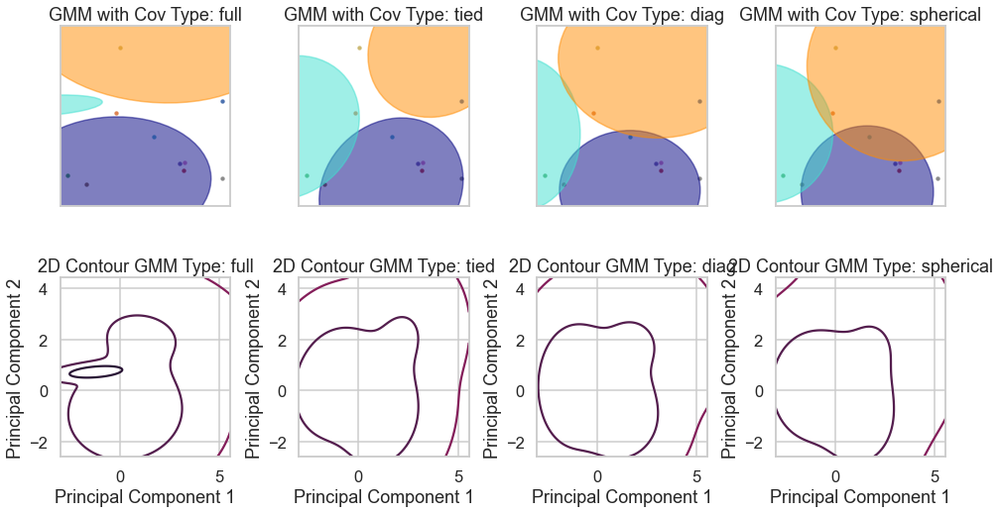

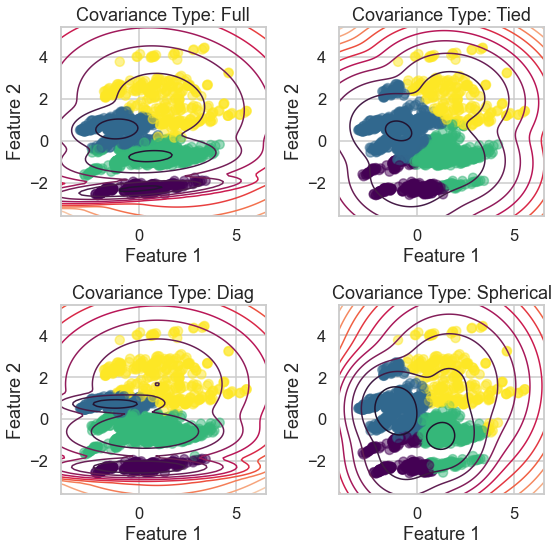

Log-likelihood for Full covariance type: -3.23
Log-likelihood for Tied covariance type: -3.48
Log-likelihood for Diag covariance type: -3.20
Log-likelihood for Spherical covariance type: -3.47


In [28]:
# Standardize the data
scaler = StandardScaler()
data_standardized = scaler.fit_transform(df)

# Apply PCA to reduce the dataset to 2 dimensions
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_standardized)

# Set up GMM parameters
covariance_types = ["full", "tied", "diag", "spherical"]
n_estimators = len(covariance_types)

plt.figure(figsize=(4 * n_estimators, 8))
plt.subplots_adjust(wspace=0.4, hspace=0.4)

for index, cov_type in enumerate(covariance_types):
    # Fit GMM with the current covariance_type
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    gmm.fit(data_pca)

    # Plot data points
    plt.subplot(2, n_estimators, index + 1)
    for n, color in enumerate(sns.color_palette("deep")):
        data = data_pca[df.index[df.index == n]]
        plt.scatter(data[:, 0], data[:, 1], s=8, color=color, label=f"Class {n + 1}")

    # Plot GMM components
    make_ellipses(gmm, plt.gca())
    plt.title(f"GMM with Cov Type: {cov_type}")
    plt.xticks(())
    plt.yticks(())

    # Plot 2D contour plot of the GMM
    plt.subplot(2, n_estimators, index + n_estimators + 1)
    h = plt.gca()
    x, y = np.meshgrid(np.linspace(data_pca[:, 0].min(), data_pca[:, 0].max(), 500),
                       np.linspace(data_pca[:, 1].min(), data_pca[:, 1].max(), 500))
    xy = np.column_stack((x.ravel(), y.ravel()))
    z = -gmm.score_samples(xy)
    z = z.reshape(x.shape)
    plt.contour(x, y, z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10))
    plt.title(f"2D Contour GMM Type: {cov_type}")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")

plt.show()

## VERRA

log_likelihoods = {}

for i, covariance_type in enumerate(covariance_types, 1):
    # Create and fit GMM model
    gmm = GaussianMixture(n_components=4, covariance_type=covariance_type, random_state=0)
    gmm.fit(data_pca)
    
    log_likelihoods[covariance_type] = gmm.score(data_pca)
    
    # Generate grid points to evaluate the density
    x_min, x_max = data_pca[:, 0].min() - 1, data_pca[:, 0].max() + 1
    y_min, y_max = data_pca[:, 1].min() - 1, data_pca[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    Z = -gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot contour plot
    plt.subplot(2, 2, i)
    plt.scatter(data_pca[:, 0], data_pca[:, 1], marker='o', c=gmm.predict(data_pca), cmap='viridis', alpha=0.5)
    plt.contour(xx, yy, Z, levels=10, linewidths=1.5)
    plt.title(f'Covariance Type: {covariance_type.capitalize()}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()
for covariance_type, log_likelihood in log_likelihoods.items():
    print(f'Log-likelihood for {covariance_type.capitalize()} covariance type: {log_likelihood:.2f}')
